# Import Python Libaries

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
%matplotlib inline
import re
import string
import spacy 
import os
import sys
import numpy as np

nlp = spacy.load('en', disable=['ner', 'parser'])
import nltk
from nltk.stem.snowball import SnowballStemmer
from scipy import stats

from time import time
from collections import defaultdict
import gc
import io
import random

from __future__ import print_function, division
from builtins import range
import os
import sys
import numpy as np
import operator

import nltk
nltk.download('all')
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize


import keras
from keras.models import Model, Sequential
from keras.layers import *
from keras.layers import Dense, Embedding, Input
from keras.layers import LSTM, Bidirectional, GlobalAveragePooling1D, Dropout, Conv1D, GRU, Layer
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.optimizers import Adam, SGD
from sklearn.metrics import roc_auc_score
import keras.backend as K
from keras.layers import CuDNNLSTM as LSTM
from keras.models import load_model
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint

from keras import metrics
from tensorflow.python.keras.metrics import Metric
from tensorflow.keras.utils import plot_model

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.utils import shuffle, class_weight
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import cohen_kappa_score, roc_auc_score, f1_score, confusion_matrix

from sklearn.pipeline import Pipeline



/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package biocreative_ppi is already up-to-date!
[nltk_data]    | Downloading package brown to /root/nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package brown_tei to /root/nltk_data...
[nltk_data]    |   Package brown_tei is already up-to-date!
[nltk_data]    | Downloading package cess_cat to /root/nltk_data...
[nltk_data]    |   Package cess_cat is already up-to-date!
[nltk_data]    | Downloading package cess_esp to /root/nltk_data...
[nltk_data]    |   Package cess_esp is already up-to-date!
[nltk_data]    | Downloading packag

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [0]:
# install tensorflow 2.0
#!pip uninstall tensorflow
#!pip install tensorflow-gpu==2.1.0

In [0]:
import tensorflow as tf
print(tf.__version__)

2.1.0


In [0]:
# check the availability of GPU
%tensorflow_version 2.x
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))


Found GPU at: /device:GPU:0


In [0]:
# Mount Google Drive (to save the downloaded files)
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


### GloVe Pretrained Word Embedding loading

In [0]:
# Load GloVe Embeddings
print('Loading GloVe Embeddings.')

glove_embeddings = {}
f = open('/gdrive/My Drive/glove.42B.300d.txt', encoding='utf-8')
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    glove_embeddings[word] = coefs
f.close()

print('Found %s word vectors.' % len(glove_embeddings))


Loading GloVe Embeddings.
Found 1917495 word vectors.


# Import cleaned data

In [0]:
data = pd.read_csv('/gdrive/My Drive/cleaned_data.csv')
data_cleaned = data[['texts','positivity']][data['relevance']==1]

In [0]:
data_cleaned

,texts,positivity
0,yield cd fall late week new york yield cert...,3.0
4,currency trading dollar remain tight range a...,3.0
5,stock fall bofa alcoa slide stock decline ...,3.0
9,u s dollar fall currency decline soften bo...,4.0
12,defend deflation author james b stewartthe...,4.0
...,...,...
7964,housing start grow raise inflation fear ec...,7.0
7965,profit evasive stock mart rally greer philip...,3.0
7975,salomon sound wary note economy clinton admini...,8.0
7978,great terror massive new history hitler tyra...,5.0


In [0]:
data_cleaned.groupby('positivity').count()

,texts
positivity,
2.0,35
3.0,343
4.0,255
5.0,205
6.0,214
7.0,295
8.0,71
9.0,2


# Sentiment Analysis

## Data Augmentation

In [0]:
# use WordNet to find synonyms of each word and oversample the minor class
from nltk.corpus import wordnet 

def get_synonyms(word):
	synonyms = set()
	for syn in wordnet.synsets(word): 
		for l in syn.lemmas(): 
			synonym = l.name()
			synonym = "".join([char for char in synonym if char in ' qwertyuiopasdfghjklzxcvbnm'])
			synonyms.add(synonym) 
	if word in synonyms:
		synonyms.remove(word)
	return list(synonyms)

In [0]:
# use the function in Oversampling
def augmentation(wordlist, pos): 
  new_words = wordlist
  for i in range(len(wordlist)):
    for random_word in wordlist[wordlist.index[i]]:
      try:
        synonyms = get_synonyms(random_word)
        synonym = random.choice(list(synonyms))
        new_words[new_words.index[i]] = [synonym if word == random_word else word for word in new_words[new_words.index[i]]]
      except:
        pass
    s = ' '.join(new_words[new_words.index[i]])
    new_words[new_words.index[i]] = s
  augmented_sentences = pd.DataFrame(columns=['texts','positivity'])
  augmented_sentences['texts'] = new_words
  augmented_sentences['positivity']  = pos
  return augmented_sentences

### 20% data augmentation

In [0]:
data_cleaned_1 = data_cleaned.sample(frac=0.2, replace=False, random_state=17)

In [0]:
sentence = data_cleaned_1['texts']
pos = data_cleaned_1['positivity']
word_list = sentence.str.split()

random.seed(55)
data_1 = data_cleaned.append(augmentation(word_list, pos))

In [0]:
data_1 = shuffle(data_1)
data_1.reset_index()

,index,texts,positivity
0,3898,presidency president obama comment friday r...,4.0
1,5821,trillion new debt expect economic growth...,6.0
2,2176,greenspan take hard line growth fed continu...,7.0
3,4985,area hit labor shortage job unfilled unemploym...,6.0
4,1781,bond price fall nervousness refund trader f...,3.0
...,...,...,...
1699,4322,stock gain day end week low new york march...,6.0
1700,167,pende home sale slip june housing recovery r...,4.0
1701,2932,industry output decline june drop index ...,3.0
1702,546,deflation battle feed official issue aggress...,4.0


In [0]:
data_1.groupby('positivity').count()

,texts
positivity,
2.0,41
3.0,417
4.0,306
5.0,239
6.0,255
7.0,355
8.0,88
9.0,3


### 50% data augmentation

In [0]:
data_cleaned_2 = data_cleaned.sample(frac=0.5, replace=False, random_state=17)

In [0]:
sentence = data_cleaned_2['texts']
pos = data_cleaned_2['positivity']
word_list = sentence.str.split()

random.seed(55)
data_2 = data_cleaned.append(augmentation(word_list, pos))

In [0]:
data_2 = shuffle(data_2)
data_2.reset_index()

,index,texts,positivity
0,4961,growth rate economy say slow fed ' beige boo...,5.0
1,7735,mortgage loan field see enter new era mortg...,5.0
2,7351,cut deficit solution economy s problem high in...,3.0
3,407,u s budget defict widen february washington ...,7.0
4,1909,review outlook editorial greenspan reco...,6.0
...,...,...,...
2125,1575,firm consumer assurance wage retailmerchant bl...,7.0
2126,2928,clothing retailer report strong earning clothi...,6.0
2127,4613,martin marietta post high profit lafarge d...,7.0
2128,7660,china increase sale u s finally outstrip ris...,7.0


### 80% data augmentation

In [0]:
data_cleaned_3 = data_cleaned.sample(frac=0.8, replace=False, random_state=17)

In [0]:
sentence = data_cleaned_3['texts']
pos = data_cleaned_3['positivity']
word_list = sentence.str.split()

random.seed(55)
data_3 = data_cleaned.append(augmentation(word_list, pos))

In [0]:
data_3 = shuffle(data_3)
data_3.reset_index()

,index,texts,positivity
0,784,office vacancy decline year time year sur...,5.0
1,402,u s jobless claim fall week move average l...,7.0
2,6733,dow berth investor look outofwork numerate sto...,4.0
3,6728,dow feedin place conclusion fresh ouseofork ug...,6.0
4,7634,radius apital place at revered uboftheniverse ...,8.0
...,...,...,...
2551,1214,rate concern leave stock mixed industrial de...,6.0
2552,7660,china increase sale u s finally outstrip ris...,7.0
2553,2809,u s news business spend order equipment...,5.0
2554,1206,uranium sec budget shortage constrict thirdbas...,7.0


### 100% data augmentation

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_4 = data_cleaned.append(augmentation(word_list, pos))


In [0]:
data_4 = shuffle(data_4)
data_4.reset_index()

,index,texts,positivity
0,5208,stock spurt early week decline new york se...,5.0
1,7343,bush aide economy lull best ' boskin close...,4.0
2,6209,tough tone bernanke answer critic assertiven...,4.0
3,7100,store sale advance store sale advance finck...,7.0
4,3345,investor switch equity fund bond shift fix ...,3.0
...,...,...,...
2835,2106,commonplace beatup misplace steamclean belated...,7.0
2836,5352,dow war optimism market high level august...,7.0
2837,434,economical optimism rise euro newfangled ouseo...,4.0
2838,3738,consumer debt increment hohum ovember resident...,6.0


### 120% data augmentation

In [0]:
data_cleaned_5 = data_cleaned.sample(frac=0.2, replace=False, random_state=17)

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_5 = data_cleaned.append(augmentation(word_list, pos))

sentence = data_cleaned_5['texts']
pos = data_cleaned_5['positivity']
word_list = sentence.str.split()

random.seed(74)
data_5 = data_5.append(augmentation(word_list, pos))

In [0]:
data_5 = shuffle(data_5)
data_5.reset_index()

,index,texts,positivity
0,1854,dollarbill involve warm lend interim dollarbil...,6.0
1,4597,findout nitedexicantates pitiful spectacle ura...,3.0
2,2578,short term rate rise bond price slump despite ...,4.0
3,5512,give comprehend corner ctober bit policymaker ...,3.0
4,3438,uranium southward alcolmstock ruin dropoff bar...,5.0
...,...,...,...
3119,4989,money provision crepuscle snapshot workweek tu...,4.0
3120,3024,ahead tape uncle sam inflation deal youtalk mo...,3.0
3121,4961,increment tread economicsystem aver lento cour...,5.0
3122,7877,livingaccommodations firm calendarmonth living...,5.0


### 150% data augmentation

In [0]:
data_cleaned_6 = data_cleaned.sample(frac=0.5, replace=False, random_state=17)

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_6 = data_cleaned.append(augmentation(word_list, pos))

sentence = data_cleaned_6['texts']
pos = data_cleaned_6['positivity']
word_list = sentence.str.split()

random.seed(74)
data_6 = data_6.append(augmentation(word_list, pos))

In [0]:
data_6 = shuffle(data_6)
data_6.reset_index()

,index,texts,positivity
0,1625,productiveness produce behind gait mull languo...,5.0
1,1396,ulianond eontynerice callup volcker note bespe...,4.0
2,3664,grossnationalproduct forecast sheer rank hursd...,3.0
3,7257,post war reality visit market remarkable rise ...,4.0
4,721,manufacturer toll bound uly freeenergy gondola...,4.0
...,...,...,...
3545,1561,actuate foodmarket lehman paper heave profits ...,4.0
3546,3516,eat slimdown place beseech longpillow economic...,5.0
3547,5540,vergreentate brand ues revered interim indican...,4.0
3548,4568,greenspan cite oil restraint economy strengt...,6.0


### 180% data augmentation

In [0]:
data_cleaned_7 = data_cleaned.sample(frac=0.8, replace=False, random_state=17)

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_7 = data_cleaned.append(augmentation(word_list, pos))

sentence = data_cleaned_7['texts']
pos = data_cleaned_7['positivity']
word_list = sentence.str.split()

random.seed(74)
data_7 = data_7.append(augmentation(word_list, pos))

In [0]:
data_7 = shuffle(data_7)
data_7.reset_index()

,index,texts,positivity
0,5307,arrymeliaooreation abbreviated ichigan andofin...,5.0
1,7281,raise value atomicnumber poop economicsystem ...,7.0
2,5273,populist yes resolution return patronage insur...,5.0
3,2208,givechase economicsystem ov ostentation range ...,3.0
4,2725,discipline elaboration sorry check economical ...,3.0
...,...,...,...
3971,1912,business finance factory order fall june ad...,7.0
3972,7631,significant budget extra author commercialente...,4.0
3973,3663,industrial refuse direct pastime pace fossiloi...,3.0
3974,5656,dow prevision humbled range freshly ork celest...,6.0


In [0]:
dist = data_7[['positivity','texts']].groupby('positivity').count()
dist

,texts
positivity,
2.0,98
3.0,959
4.0,718
5.0,570
6.0,596
7.0,829
8.0,200
9.0,6


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  if __name__ == '__main__':


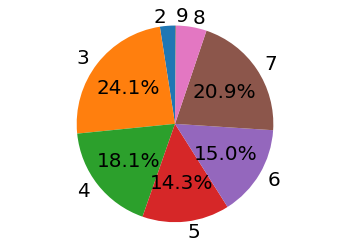

In [0]:
def autopct_generator(limit):
    def inner_autopct(pct):
        return ('%.1f%%' % pct) if pct > limit else ''
    return inner_autopct
plt.rcParams.update({'font.size':20})
fig1, ax1 = plt.subplots()
sizes = dist.values
label = [2,3,4,5,6,7,8,9]
ax1.pie(sizes, labels=label, autopct = autopct_generator(10), startangle=90)
ax1.axis('equal')  

plt.show()

### 200% data augmentation

In [0]:
sentence = data_cleaned['texts']
pos = data_cleaned['positivity']
word_list = sentence.str.split()

random.seed(55)
data_8 = data_cleaned.append(augmentation(word_list, pos))

random.seed(74)
data_8 = data_8.append(augmentation(word_list, pos))

In [0]:
data_8 = shuffle(data_8)
data_8.reset_index()

,index,texts,positivity
0,1177,market bounceback stock shimmy new york sh...,6.0
1,1374,reign wisdom shaky economic ground economist e...,4.0
2,4527,aircrafts buoyant general list sink steel sh...,7.0
3,2036,liothyronine type sulphur thousand dueeast d...,8.0
4,5702,durable good order surge april recession ...,3.0
...,...,...,...
4255,7232,fivehundred east ittlehoebe east litre atomicn...,7.0
4256,6507,gunstock boil raggedly brisk businessdeal brin...,3.0
4257,6376,chair connect mixer securitydepartment succeed...,3.0
4258,2499,psychoanalyst dissent import ostentatiousness ...,5.0


## LSTM

In [0]:
# some configuration

MAX_SEQUENCE_LENGTH = 432   # max sentence length 427 words
EMBEDDING_DIM = 300    # word vector dimension
MAX_VOCAB_SIZE = 50000
num_words = MAX_VOCAB_SIZE

### Word Embedding Weights and Padding

In [0]:
# Function for word embedding and padding, return embedding weight matrix, tokenized texts after padding, and number of words
def embedding(data_cleaned):  

  MAX_VOCAB_SIZE = 50000     # how many words will be used from dictionary 

  print('Loading word vectors...')
  word2vec = glove_embeddings

  # load dataset
  sentences = data_cleaned['texts'].fillna("DUMMY_VALUE").values

  # convert the sentences (strings) into integers
  # return a list of the index of every word in every sentence
  num_words = MAX_VOCAB_SIZE
  tokenizer = Tokenizer(num_words)
  tokenizer.fit_on_texts(sentences)   # word counts on unique words, see below

  # word2idx: number of unique words with index (Dictionary of word index)
  word2idx = tokenizer.word_index
  print('Found %s unique tokens.' % len(word2idx))

  # prepare embedding matrix
  n = 0
  uncovered_words = {}
  print('Filling pre-trained embeddings...')
  num = min(MAX_VOCAB_SIZE,len(word2idx) + 1)
  embedding_matrix = np.zeros((num, EMBEDDING_DIM))
  for word, i in word2idx.items():
      if i < MAX_VOCAB_SIZE:
          embedding_vector = word2vec.get(word)
          #print(embedding_vector)
          if embedding_vector is not None:
          # words not found in embedding index will be all zeros.
              embedding_matrix[i] = embedding_vector
          else:
              n = n + 1
              uncovered_words[n] = word
  print('{}, or {:.2%} of total {} unique words are not covered'.format(n, n/len(word2idx), len(word2idx)))

  # padding
  sequences = tokenizer.texts_to_sequences(data_cleaned['texts'].values)  # list, size T x number of words in each line (each line fluctuates)
  texts = pad_sequences(sequences, truncating = 'post', padding = 'post', maxlen=MAX_SEQUENCE_LENGTH)
  print('Shape of test data tensor:', texts.shape)
  
  return texts, embedding_matrix, num

In [0]:
# 20% data augmentation
[texts1, embedding_matrix_1, num1] = embedding(data_1)

Loading word vectors...
Found 16239 unique tokens.
Filling pre-trained embeddings...
2291, or 14.11% of total 16239 unique words are not covered
Shape of test data tensor: (1704, 432)


In [0]:
# 50% data augmentation
[texts2, embedding_matrix_2, num2] = embedding(data_2)

Loading word vectors...
Found 19404 unique tokens.
Filling pre-trained embeddings...
3427, or 17.66% of total 19404 unique words are not covered
Shape of test data tensor: (2130, 432)


In [0]:
# 80% data augmentation
[texts3, embedding_matrix_3, num3] = embedding(data_3)

Loading word vectors...
Found 21242 unique tokens.
Filling pre-trained embeddings...
4080, or 19.21% of total 21242 unique words are not covered
Shape of test data tensor: (2556, 432)


In [0]:
# 100% data augmentation
[texts4, embedding_matrix_4, num4] = embedding(data_4)

Loading word vectors...
Found 22274 unique tokens.
Filling pre-trained embeddings...
4464, or 20.04% of total 22274 unique words are not covered
Shape of test data tensor: (2840, 432)


In [0]:
# 120% data augmentation
[texts5, embedding_matrix_5, num5] = embedding(data_5)

Loading word vectors...
Found 22927 unique tokens.
Filling pre-trained embeddings...
4712, or 20.55% of total 22927 unique words are not covered
Shape of test data tensor: (3124, 432)


In [0]:
# 150% data augmentation
[texts6, embedding_matrix_6, num6] = embedding(data_6)

Loading word vectors...
Found 23749 unique tokens.
Filling pre-trained embeddings...
5020, or 21.14% of total 23749 unique words are not covered
Shape of test data tensor: (3550, 432)


In [0]:
# 180% data augmentation
[texts7, embedding_matrix_7, num7] = embedding(data_7)

Loading word vectors...
Found 24345 unique tokens.
Filling pre-trained embeddings...
5242, or 21.53% of total 24345 unique words are not covered
Shape of test data tensor: (3976, 432)


In [0]:
# 200% data augmentation
[texts8, embedding_matrix_8, num8] = embedding(data_8)

Loading word vectors...
Found 22302 unique tokens.
Filling pre-trained embeddings...
4476, or 20.07% of total 22302 unique words are not covered
Shape of test data tensor: (4260, 432)


### Model

#### learning rate selection

In [0]:
# embedding weight matrix, tokenized texts and number of words using raw data (without data augmentation)
[texts, embedding_matrix, n] = embedding(data_cleaned)

Loading word vectors...
Found 10932 unique tokens.
Filling pre-trained embeddings...
542, or 4.96% of total 10932 unique words are not covered
Shape of test data tensor: (1420, 432)


In [0]:
# split into training and testing set
labels = data_cleaned['positivity'].values
#X_train, X_test, y_train, y_test = train_test_split(texts, labels, test_size=0.1, random_state=7)

In [0]:
# transfer multi-class to binary classes
labels_train = pd.get_dummies(y_train) 
labels_test = pd.get_dummies(y_test)

# using list of zeros to represents missing classes
m = sum(labels_train.columns)-sum(labels_test.columns)
print(m)
if m > 0:
  n = int(m)-2
  labels_test.insert(n, m, 0)
elif m < 0:
  n = abs(int(m))-2
  labels_train.insert(n, abs(m), 0)

Building Bi-LSTM model...
Training model...
Train on 1278 samples, validate on 142 samples
Epoch 1/250
1278/1278 [==============================] - 5s 4ms/sample - loss: 2.3918 - accuracy: 0.1854 - val_loss: 2.4002 - val_accuracy: 0.1268
Epoch 2/250
1278/1278 [==============================] - 2s 2ms/sample - loss: 2.3918 - accuracy: 0.1854 - val_loss: 2.4002 - val_accuracy: 0.1268
Epoch 3/250
1278/1278 [==============================] - 2s 2ms/sample - loss: 2.3918 - accuracy: 0.1854 - val_loss: 2.4002 - val_accuracy: 0.1268
Epoch 4/250
1278/1278 [==============================] - 2s 2ms/sample - loss: 2.3917 - accuracy: 0.1854 - val_loss: 2.4002 - val_accuracy: 0.1268
Epoch 5/250
1278/1278 [==============================] - 2s 2ms/sample - loss: 2.3917 - accuracy: 0.1854 - val_loss: 2.4001 - val_accuracy: 0.1268
Epoch 6/250
1278/1278 [==============================] - 2s 2ms/sample - loss: 2.3917 - accuracy: 0.1854 - val_loss: 2.4001 - val_accuracy: 0.1268
Epoch 7/250
1278/1278 [====

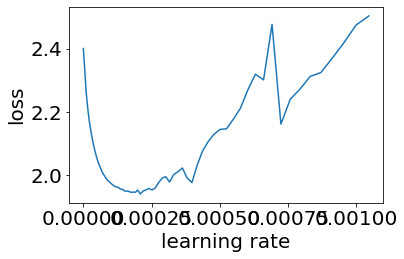

In [0]:
# some configuration
VALIDATION_SPLIT = 0.1   
BATCH_SIZE = 32   # number of training samples to work through
EPOCHS = 250   # number of complete passes through the training dataset

from keras.callbacks import LearningRateScheduler

print('Building Bi-LSTM model...')
METRICS = ['accuracy']
y = pd.get_dummies(labels)

# define loss history to record losses while changing learning rate
sd=[]
class LossHistory(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.losses = [1,1]

    def on_epoch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))
        sd.append(step_decay(len(self.losses)))
        #print('lr:', step_decay(len(self.losses)))

# build model
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(n, EMBEDDING_DIM, input_length=MAX_SEQUENCE_LENGTH, weights=[embedding_matrix], trainable=True),
    tf.keras.layers.LSTM(32, return_sequences=True),
    #tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16)),
    tf.keras.layers.GlobalMaxPooling1D(),
    tf.keras.layers.Dense(16, activation='sigmoid'),
    tf.keras.layers.Dense(8, activation='softmax')
])


optimizer = tf.keras.optimizers.Adam(lr=1e-8)
model.compile(
  loss = 'categorical_crossentropy',
  optimizer = optimizer,
  metrics = METRICS,

)

# learning rate will change from 1e-8 to 1e-3
def step_decay(losses):
        lrate=1e-8 * 10**(len(history.losses) / 50)
        momentum=0.8
        decay_rate=2e-6
        return lrate

history=LossHistory()
lrate=LearningRateScheduler(step_decay)

# Training model:


print('Training model...')
r = model.fit(
  texts,
  y,
  batch_size = BATCH_SIZE,
  epochs = EPOCHS,
  validation_split = VALIDATION_SPLIT,
  callbacks=[history, lrate]
)



model.summary()

plt.rcParams.update({'figure.autolayout': True, 'font.size':20})
# plot learning rate and validation loss
plt.plot(r.history['lr'], r.history['val_loss'])
plt.xlabel('learning rate')
plt.ylabel('loss')
plt.show()

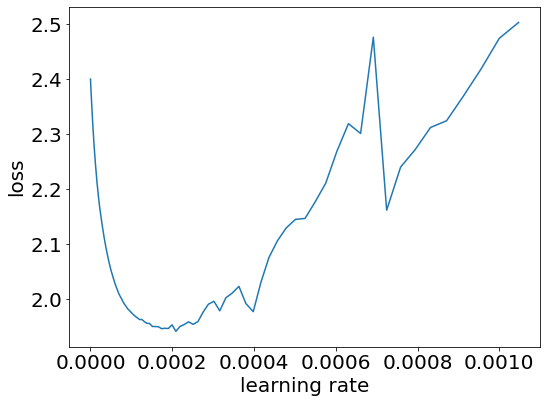

In [0]:
from matplotlib.pyplot import figure
figure(figsize=(8,6))
plt.rcParams.update({'figure.autolayout': True, 'font.size':20})
plt.plot(r.history['lr'], r.history['val_loss'])
plt.xlabel('learning rate')
plt.ylabel('loss')
plt.show()

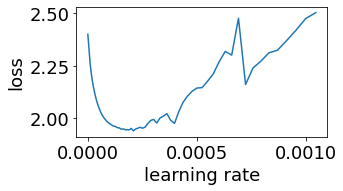

In [0]:
from matplotlib.pyplot import figure
figure(figsize=(5,3))
plt.rcParams.update({'figure.autolayout': True, 'font.size':18})
plt.plot(r.history['lr'], r.history['val_loss'])
plt.xlabel('learning rate')
plt.ylabel('loss')
plt.show()

In [0]:
# minimal validation loss
min(r.history['val_loss'])

1.9410785587740615

In [0]:
# find the learning rate which has the lowest validation loss
idx = r.history['val_loss'].index(min(r.history['val_loss']))
r.history['lr'][idx]

0.00020892962

#### LSTM

In [0]:
def lstm(texts, mydata, embedding_matrix, num_words):

  VALIDATION_SPLIT = 0.1   
  BATCH_SIZE = 32   # number of training samples to work through
  EPOCHS = 200   # number of complete passes through the training dataset
  LEARNING_RATE = 0.0002
  N_SPLITS = 7

  kfold = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state = 7)
  scores_lstm = pd.DataFrame(columns = ['accuracy','precision', 'recall', 'f1', 'cohen_kappa_score', 'auc'])  # performance matrix
  labels = mydata['positivity'].values


  METRICS = [
      'accuracy',
      'mae'
  ]


  print('Building Bi-LSTM model...')
  for train, test in kfold.split(texts, labels):
    
    # transfer multi-class to binary classes
    labels_train = pd.get_dummies(labels[train])
    labels_test = pd.get_dummies(labels[test])

    # using list of zeros to represents missing classes
    m = sum(labels_train.columns)-sum(labels_test.columns)
    print(m)
    if m > 0:
      n = int(m)-2
      labels_test.insert(n, m, 0)
    elif m < 0:
      n = abs(int(m))-2
      labels_train.insert(n, abs(m), 0)

    # build model
    model = tf.keras.Sequential([
       tf.keras.layers.Embedding(num_words, EMBEDDING_DIM, input_length=MAX_SEQUENCE_LENGTH, weights=[embedding_matrix], trainable=True),
       tf.keras.layers.LSTM(32, return_sequences=True),
       tf.keras.layers.GlobalMaxPooling1D(),
       tf.keras.layers.Dense(16, activation='sigmoid'),
       tf.keras.layers.Dense(8, activation='softmax')
    ])

    model.compile(
      loss = 'categorical_crossentropy',
      optimizer = tf.keras.optimizers.Adam(learning_rate = LEARNING_RATE),
      metrics = METRICS,
  
    )

    # Training model:
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5, restore_best_weights=True) # use early stop to avoid overfitting

    print('Training model...')
    r = model.fit(
      texts[train],
      labels_train,
      batch_size = BATCH_SIZE,
      epochs = EPOCHS,
      validation_split = VALIDATION_SPLIT,
      verbose = 0,
      callbacks=[es]

    )

    model.summary()

  # plot loss
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['val_loss'], label='val_loss')
    plt.plot(r.history['val_mae'], label='val_mae')
    plt.xlabel('epochs') 
    plt.ylim(-0.5, 2.5)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()

  # plot accuracy
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'upper right')
    plt.show()

    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()


    # predict on testing set
    predictions_lstm = model.predict(texts[test])
    #scores = model.evaluate(x = texts[test], y = labels_test)    
    labels_test = labels_test.to_numpy()

    # confusion matrix
    cnf_matrix = confusion_matrix(labels_test.argmax(axis=1), predictions_lstm.argmax(axis=1))
    report = metrics.classification_report(labels_test.argmax(axis=1), predictions_lstm.argmax(axis=1), output_dict=True)
    df = pd.DataFrame(report)

    ck = cohen_kappa_score(labels_test.argmax(axis=1), predictions_lstm.argmax(axis=1))
    
    #auc
    y_true = pd.get_dummies(labels[test])
    y_true = y_true.to_numpy()
    
    if m <= 0:
      y_pred = predictions_lstm
    else:
      y_pred = np.delete(predictions_lstm, n, 1)
    
    auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='weighted')
    
    scores_lstm = scores_lstm.append({'accuracy': df['accuracy'][0], 'precision': df['weighted avg'][0], 
                                      'recall': df['weighted avg'][1], 'f1': df['weighted avg'][2], 
                                      'cohen_kappa_score': ck,'auc': auc },  ignore_index=True)

  return scores_lstm

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_15 (Embedding)     (None, 432, 300)          4872000   
_________________________________________________________________
lstm_15 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_15 (Glo (None, 32)                0         
_________________________________________________________________
dense_30 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_31 (Dense)             (None, 8)                 136       
Total params: 4,915,288
Trainable params: 4,915,288
Non-trainable params: 0
_________________________________________________________________


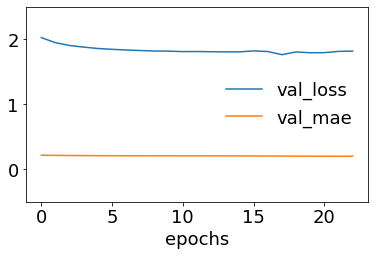

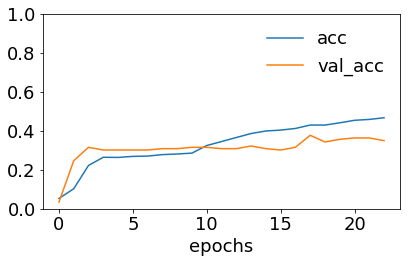

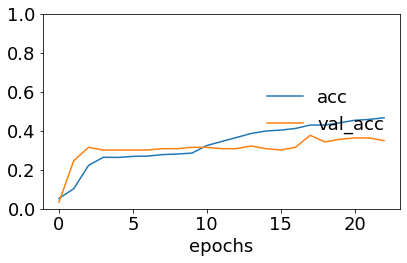

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00027: early stopping
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_16 (Embedding)     (None, 432, 300)          4872000   
_________________________________________________________________
lstm_16 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_16 (Glo (None, 32)                0         
_________________________________________________________________
dense_32 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_33 (Dense)             (None, 8)                 136       
Total params: 4,915,288
Trainable params: 4,915,288
Non-trainable params: 0
_________________________________________________________________


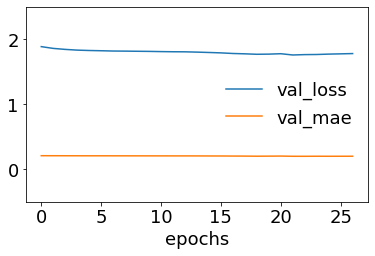

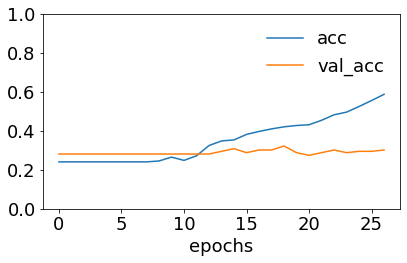

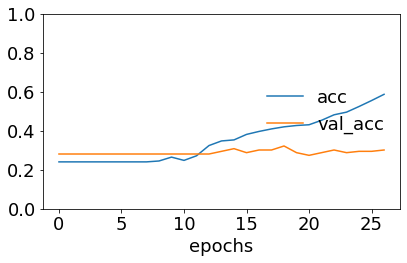

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_17 (Embedding)     (None, 432, 300)          4872000   
_________________________________________________________________
lstm_17 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_17 (Glo (None, 32)                0         
_________________________________________________________________
dense_34 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_35 (Dense)             (None, 8)                 136       
Total params: 4,915,288
Trainable params: 4,915,288
Non-trainable params: 0
_________________________________________________________________


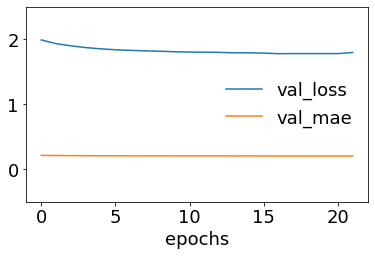

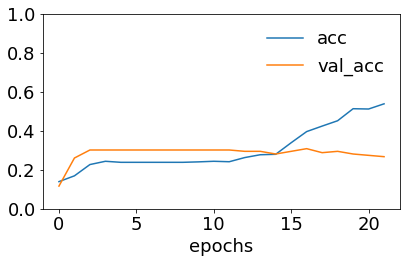

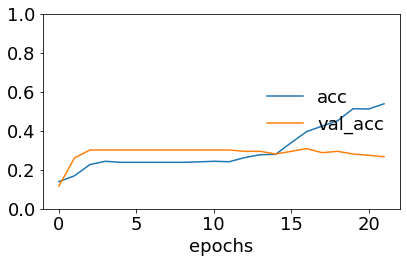

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_18 (Embedding)     (None, 432, 300)          4872000   
_________________________________________________________________
lstm_18 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_18 (Glo (None, 32)                0         
_________________________________________________________________
dense_36 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_37 (Dense)             (None, 8)                 136       
Total params: 4,915,288
Trainable params: 4,915,288
Non-trainable params: 0
_________________________________________________________________


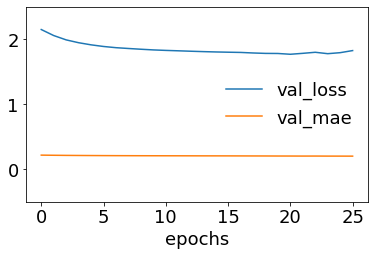

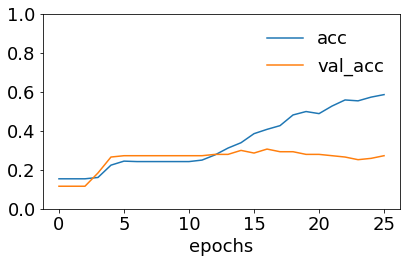

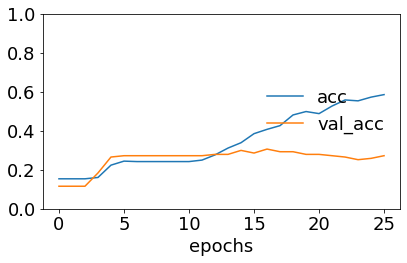

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00027: early stopping
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_19 (Embedding)     (None, 432, 300)          4872000   
_________________________________________________________________
lstm_19 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_19 (Glo (None, 32)                0         
_________________________________________________________________
dense_38 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_39 (Dense)             (None, 8)                 136       
Total params: 4,915,288
Trainable params: 4,915,288
Non-trainable params: 0
_________________________________________________________________


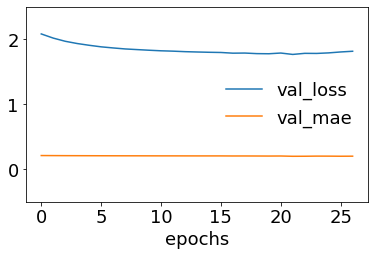

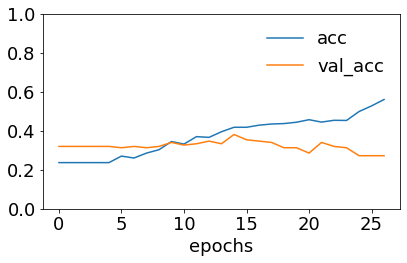

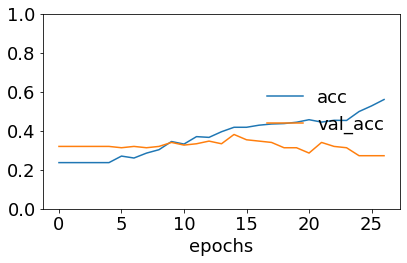

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00034: early stopping
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_20 (Embedding)     (None, 432, 300)          4872000   
_________________________________________________________________
lstm_20 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_20 (Glo (None, 32)                0         
_________________________________________________________________
dense_40 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_41 (Dense)             (None, 8)                 136       
Total params: 4,915,288
Trainable params: 4,915,288
Non-trainable params: 0
_________________________________________________________________


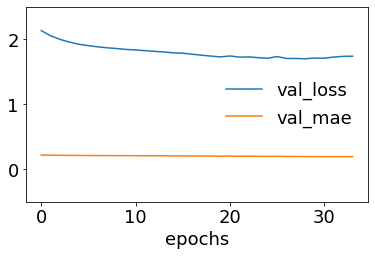

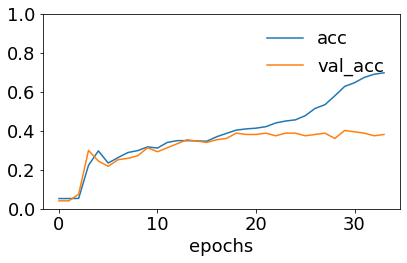

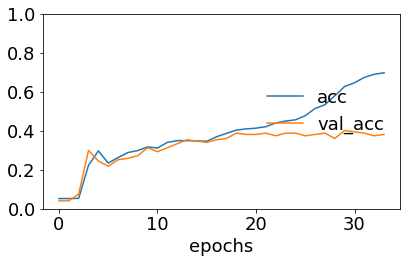

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00032: early stopping
Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_21 (Embedding)     (None, 432, 300)          4872000   
_________________________________________________________________
lstm_21 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_21 (Glo (None, 32)                0         
_________________________________________________________________
dense_42 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_43 (Dense)             (None, 8)                 136       
Total params: 4,915,288
Trainable params: 4,915,288
Non-trainable params: 0
_________________________________________________________________


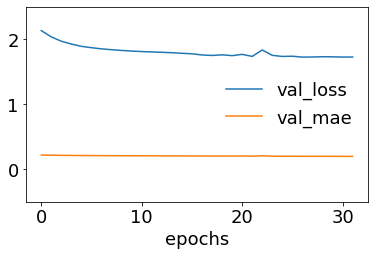

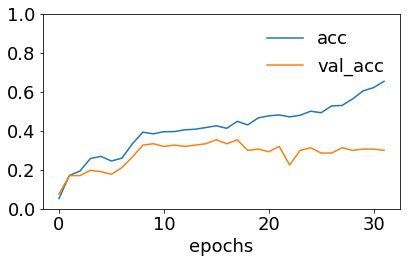

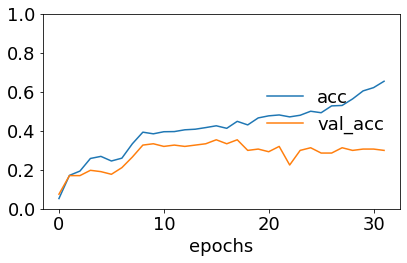

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_1 = lstm(texts1, data_1, embedding_matrix_1, num1) # 20% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_22 (Embedding)     (None, 432, 300)          5821500   
_________________________________________________________________
lstm_22 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_22 (Glo (None, 32)                0         
_________________________________________________________________
dense_44 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_45 (Dense)             (None, 8)                 136       
Total params: 5,864,788
Trainable params: 5,864,788
Non-trainable params: 0
____________________________________________

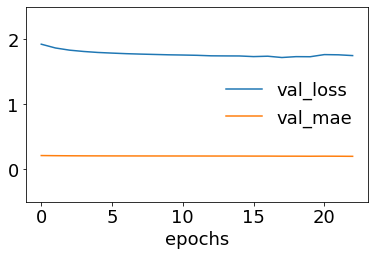

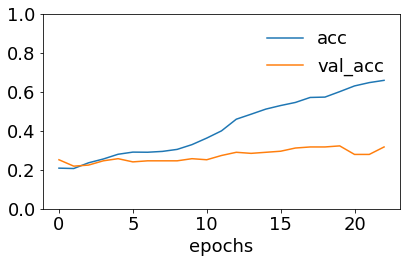

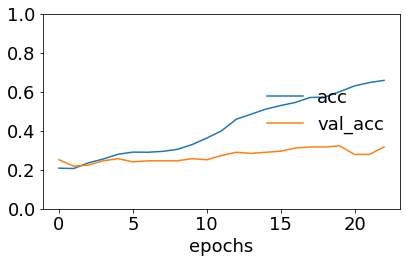

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_23 (Embedding)     (None, 432, 300)          5821500   
_________________________________________________________________
lstm_23 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_23 (Glo (None, 32)                0         
_________________________________________________________________
dense_46 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_47 (Dense)             (None, 8)                 136       
Total params: 5,864,788
Trainable params: 5,864,788
Non-trainable params: 0
_________________________________________________________________


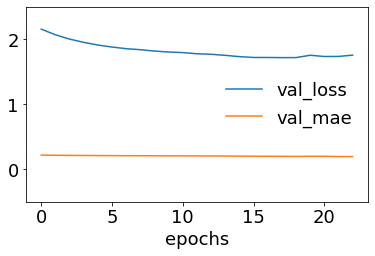

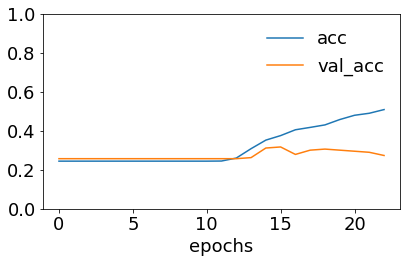

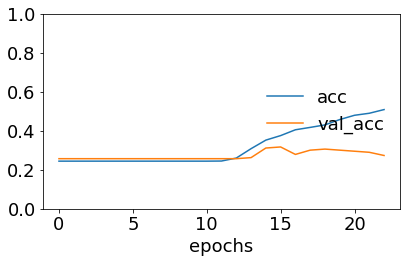

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_24 (Embedding)     (None, 432, 300)          5821500   
_________________________________________________________________
lstm_24 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_24 (Glo (None, 32)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_49 (Dense)             (None, 8)                 136       
Total params: 5,864,788
Trainable params: 5,864,788
Non-trainable params: 0
_________________________________________________________________


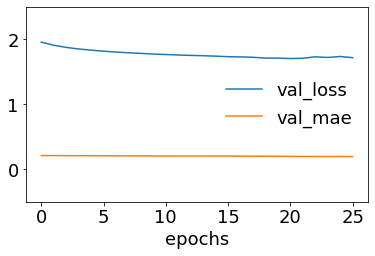

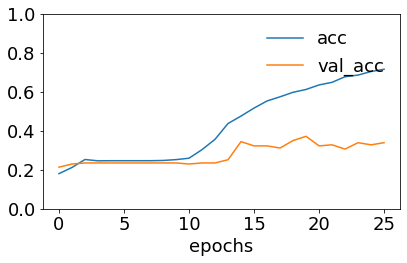

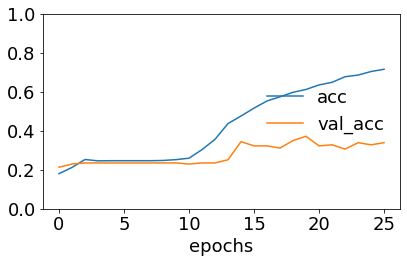

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_25 (Embedding)     (None, 432, 300)          5821500   
_________________________________________________________________
lstm_25 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_25 (Glo (None, 32)                0         
_________________________________________________________________
dense_50 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_51 (Dense)             (None, 8)                 136       
Total params: 5,864,788
Trainable params: 5,864,788
Non-trainable params: 0
_________________________________________________________________


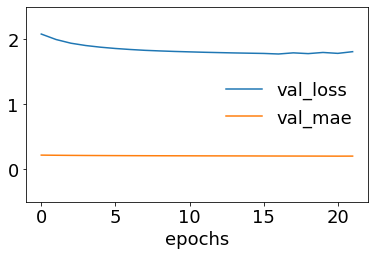

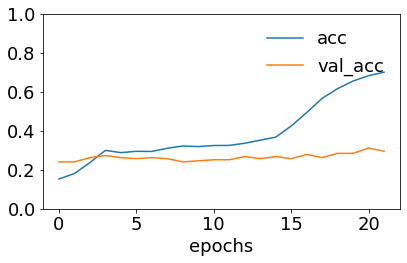

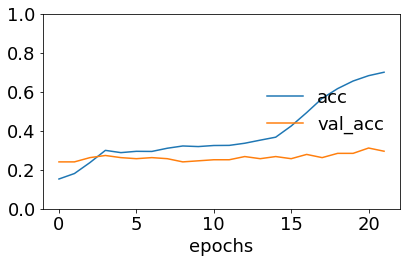

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_26 (Embedding)     (None, 432, 300)          5821500   
_________________________________________________________________
lstm_26 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_26 (Glo (None, 32)                0         
_________________________________________________________________
dense_52 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_53 (Dense)             (None, 8)                 136       
Total params: 5,864,788
Trainable params: 5,864,788
Non-trainable params: 0
_________________________________________________________________


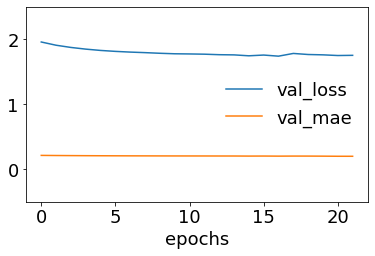

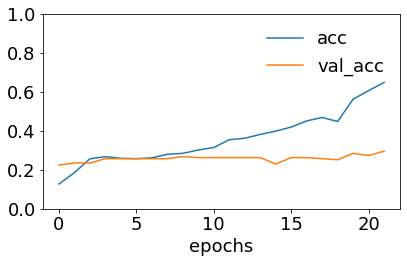

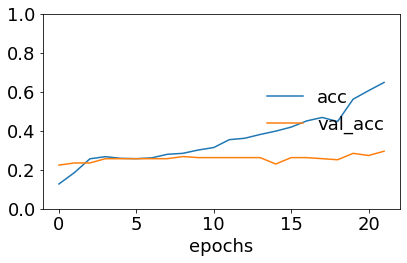

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_27 (Embedding)     (None, 432, 300)          5821500   
_________________________________________________________________
lstm_27 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_27 (Glo (None, 32)                0         
_________________________________________________________________
dense_54 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_55 (Dense)             (None, 8)                 136       
Total params: 5,864,788
Trainable params: 5,864,788
Non-trainable params: 0
_________________________________________________________________


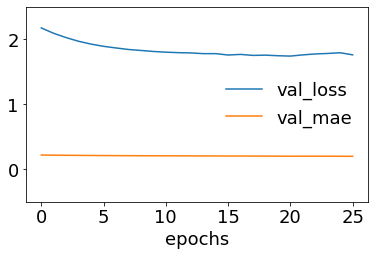

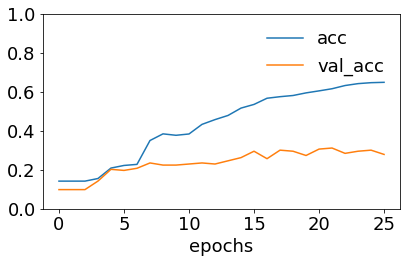

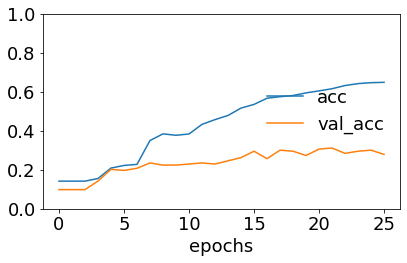

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00031: early stopping
Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_28 (Embedding)     (None, 432, 300)          5821500   
_________________________________________________________________
lstm_28 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_28 (Glo (None, 32)                0         
_________________________________________________________________
dense_56 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_57 (Dense)             (None, 8)                 136       
Total params: 5,864,788
Trainable params: 5,864,788
Non-trainable params: 0
_________________________________________________________________


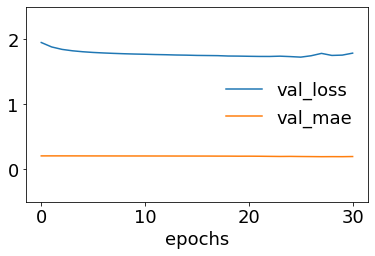

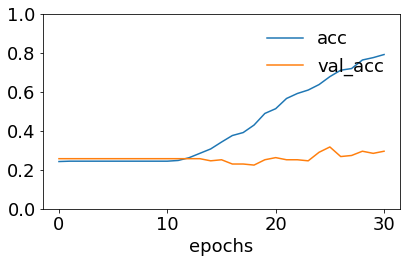

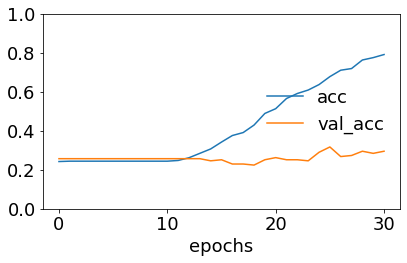

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_2 = lstm(texts2, data_2, embedding_matrix_2, num2) # 50% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_29 (Embedding)     (None, 432, 300)          6372900   
_________________________________________________________________
lstm_29 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_29 (Glo (None, 32)                0         
_________________________________________________________________
dense_58 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_59 (Dense)             (None, 8)                 136       
Total params: 6,416,188
Trainable params: 6,416,188
Non-trainable params: 0
____________________________________________

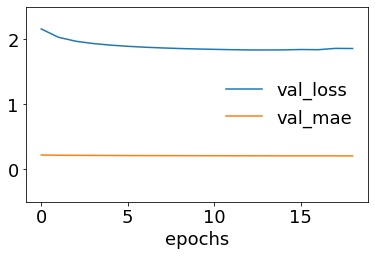

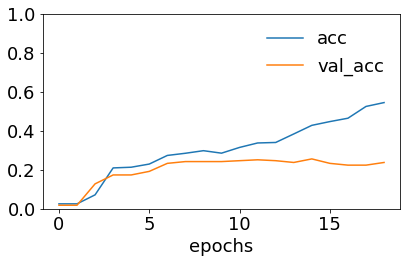

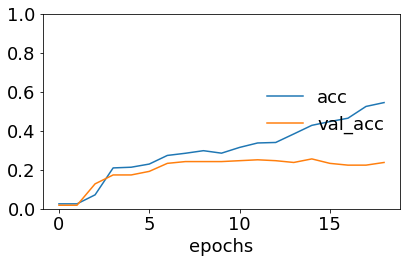

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_30 (Embedding)     (None, 432, 300)          6372900   
_________________________________________________________________
lstm_30 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_30 (Glo (None, 32)                0         
_________________________________________________________________
dense_60 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_61 (Dense)             (None, 8)                 136       
Total params: 6,416,188
Trainable params: 6,416,188
Non-trainable params: 0
_________________________________________________________________


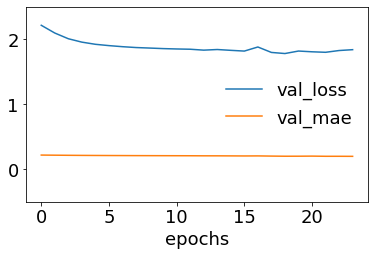

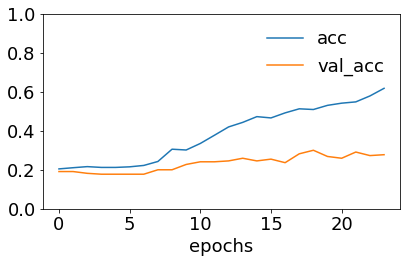

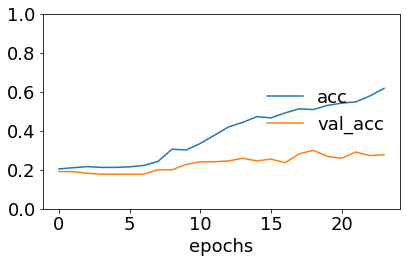

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00025: early stopping
Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_31 (Embedding)     (None, 432, 300)          6372900   
_________________________________________________________________
lstm_31 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_31 (Glo (None, 32)                0         
_________________________________________________________________
dense_62 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_63 (Dense)             (None, 8)                 136       
Total params: 6,416,188
Trainable params: 6,416,188
Non-trainable params: 0
_________________________________________________________________


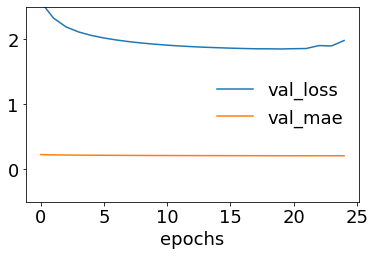

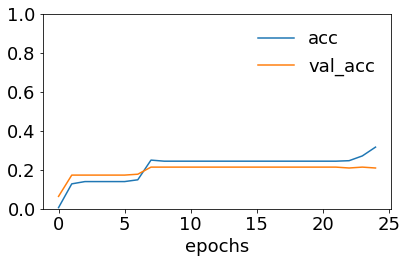

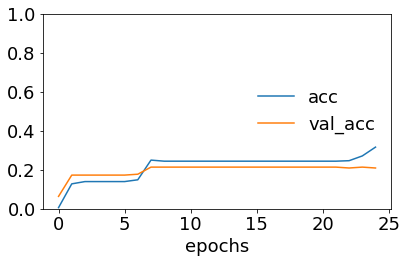

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_32 (Embedding)     (None, 432, 300)          6372900   
_________________________________________________________________
lstm_32 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_32 (Glo (None, 32)                0         
_________________________________________________________________
dense_64 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_65 (Dense)             (None, 8)                 136       
Total params: 6,416,188
Trainable params: 6,416,188
Non-trainable params: 0
_________________________________________________________________


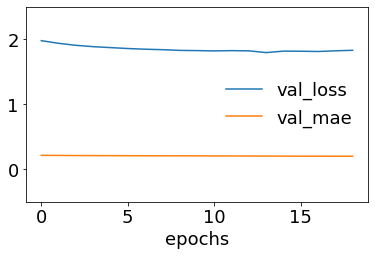

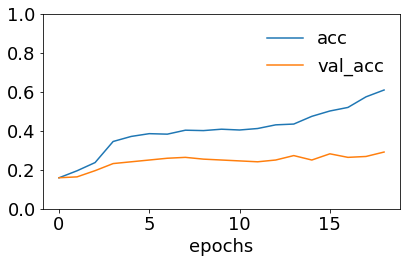

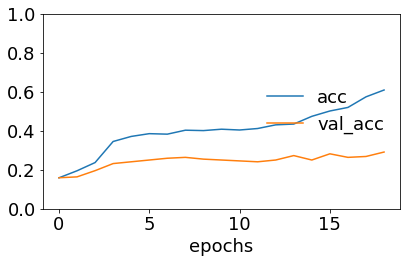

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_33 (Embedding)     (None, 432, 300)          6372900   
_________________________________________________________________
lstm_33 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_33 (Glo (None, 32)                0         
_________________________________________________________________
dense_66 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_67 (Dense)             (None, 8)                 136       
Total params: 6,416,188
Trainable params: 6,416,188
Non-trainable params: 0
_________________________________________________________________


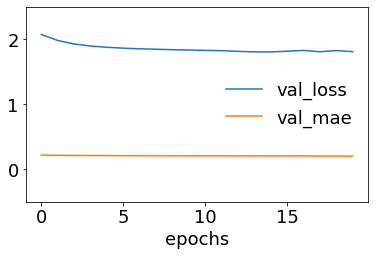

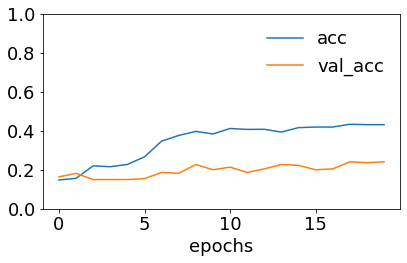

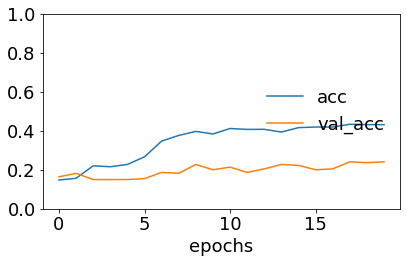

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_34 (Embedding)     (None, 432, 300)          6372900   
_________________________________________________________________
lstm_34 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_34 (Glo (None, 32)                0         
_________________________________________________________________
dense_68 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_69 (Dense)             (None, 8)                 136       
Total params: 6,416,188
Trainable params: 6,416,188
Non-trainable params: 0
_________________________________________________________________


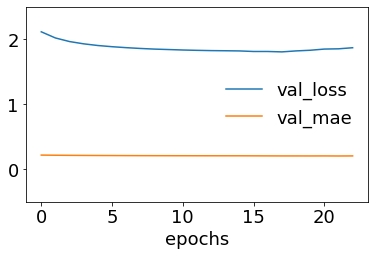

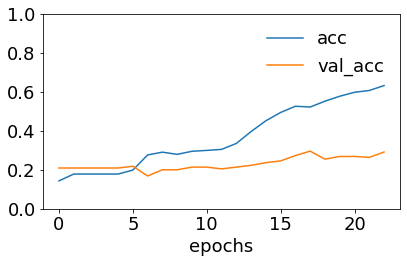

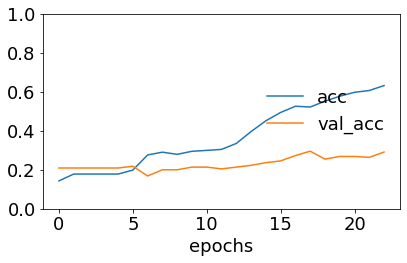

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "sequential_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_35 (Embedding)     (None, 432, 300)          6372900   
_________________________________________________________________
lstm_35 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_35 (Glo (None, 32)                0         
_________________________________________________________________
dense_70 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_71 (Dense)             (None, 8)                 136       
Total params: 6,416,188
Trainable params: 6,416,188
Non-trainable params: 0
_________________________________________________________________


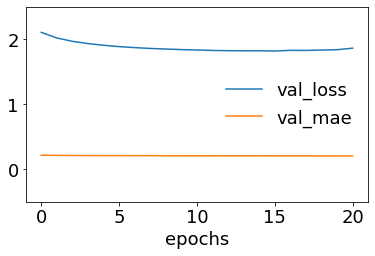

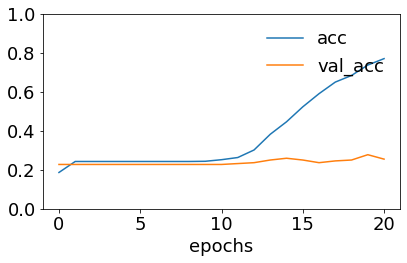

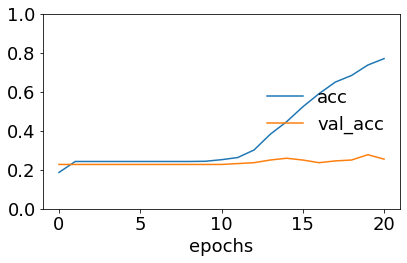

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_3 = lstm(texts3, data_3, embedding_matrix_3, num3)  # 80% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "sequential_36"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_36 (Embedding)     (None, 432, 300)          6682500   
_________________________________________________________________
lstm_36 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_36 (Glo (None, 32)                0         
_________________________________________________________________
dense_72 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_73 (Dense)             (None, 8)                 136       
Total params: 6,725,788
Trainable params: 6,725,788
Non-trainable params: 0
____________________________________________

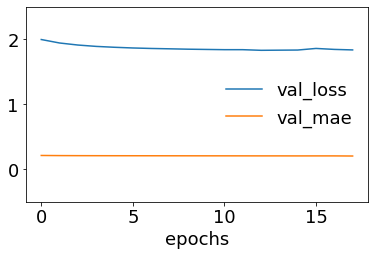

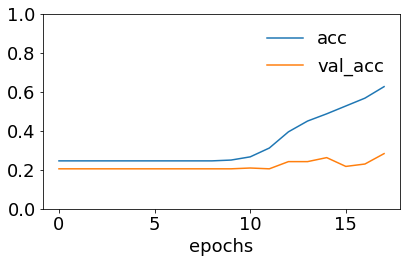

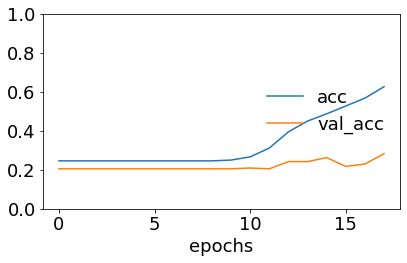

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_37 (Embedding)     (None, 432, 300)          6682500   
_________________________________________________________________
lstm_37 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_37 (Glo (None, 32)                0         
_________________________________________________________________
dense_74 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_75 (Dense)             (None, 8)                 136       
Total params: 6,725,788
Trainable params: 6,725,788
Non-trainable params: 0
_________________________________________________________________


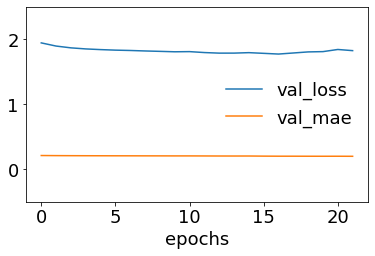

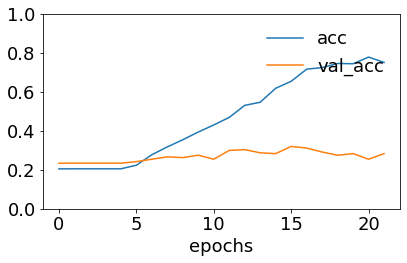

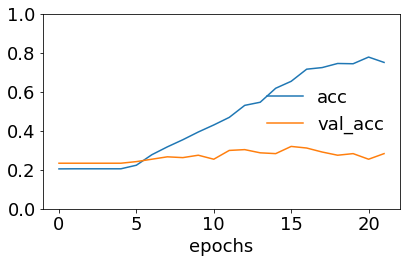

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_38 (Embedding)     (None, 432, 300)          6682500   
_________________________________________________________________
lstm_38 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_38 (Glo (None, 32)                0         
_________________________________________________________________
dense_76 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_77 (Dense)             (None, 8)                 136       
Total params: 6,725,788
Trainable params: 6,725,788
Non-trainable params: 0
_________________________________________________________________


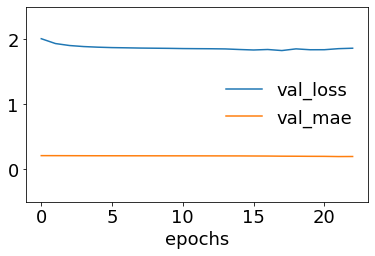

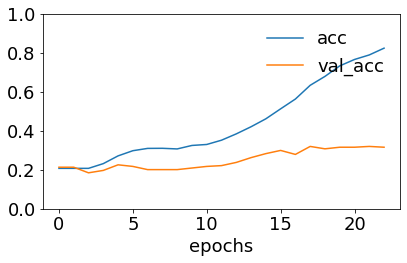

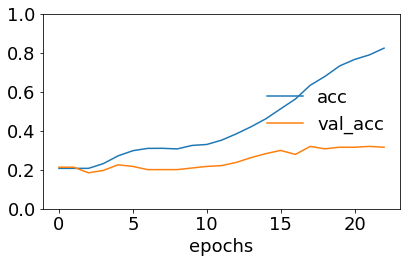

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_39 (Embedding)     (None, 432, 300)          6682500   
_________________________________________________________________
lstm_39 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_39 (Glo (None, 32)                0         
_________________________________________________________________
dense_78 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_79 (Dense)             (None, 8)                 136       
Total params: 6,725,788
Trainable params: 6,725,788
Non-trainable params: 0
_________________________________________________________________


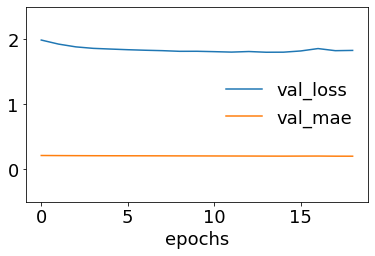

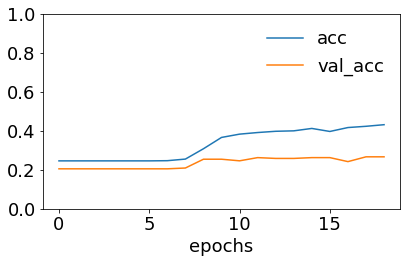

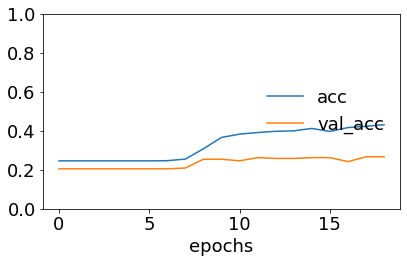

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_40 (Embedding)     (None, 432, 300)          6682500   
_________________________________________________________________
lstm_40 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_40 (Glo (None, 32)                0         
_________________________________________________________________
dense_80 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_81 (Dense)             (None, 8)                 136       
Total params: 6,725,788
Trainable params: 6,725,788
Non-trainable params: 0
_________________________________________________________________


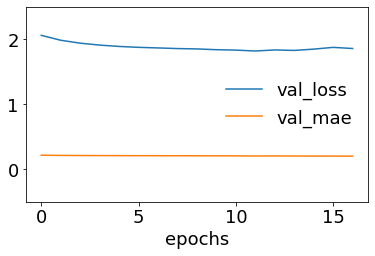

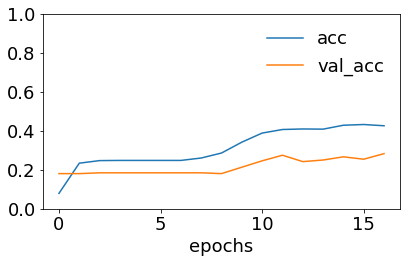

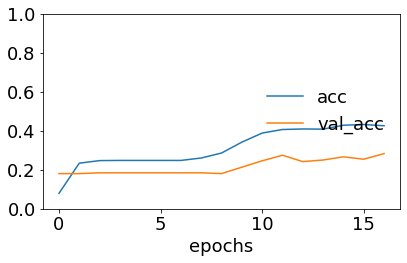

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_41 (Embedding)     (None, 432, 300)          6682500   
_________________________________________________________________
lstm_41 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_41 (Glo (None, 32)                0         
_________________________________________________________________
dense_82 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_83 (Dense)             (None, 8)                 136       
Total params: 6,725,788
Trainable params: 6,725,788
Non-trainable params: 0
_________________________________________________________________


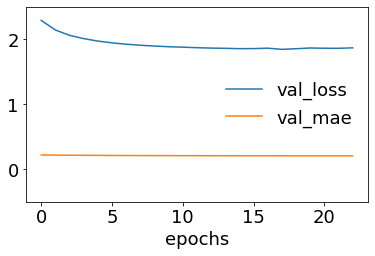

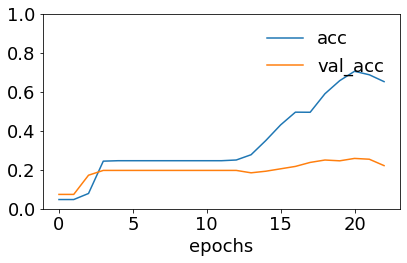

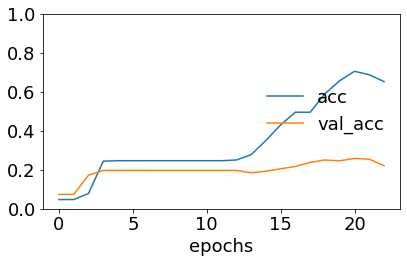

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "sequential_42"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_42 (Embedding)     (None, 432, 300)          6682500   
_________________________________________________________________
lstm_42 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_42 (Glo (None, 32)                0         
_________________________________________________________________
dense_84 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_85 (Dense)             (None, 8)                 136       
Total params: 6,725,788
Trainable params: 6,725,788
Non-trainable params: 0
_________________________________________________________________


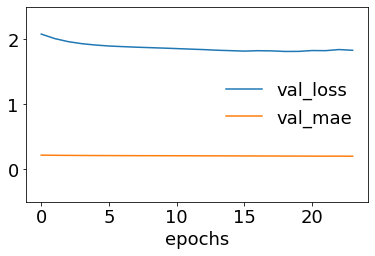

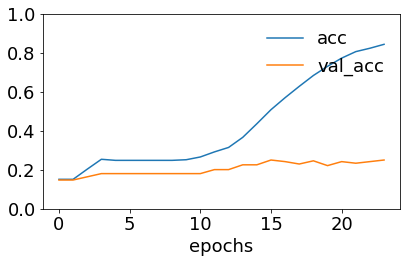

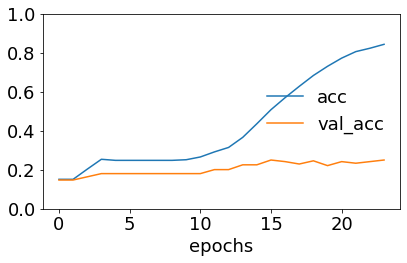

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_4 = lstm(texts4, data_4, embedding_matrix_4, num4)  # 100% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "sequential_43"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_43 (Embedding)     (None, 432, 300)          6878400   
_________________________________________________________________
lstm_43 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_43 (Glo (None, 32)                0         
_________________________________________________________________
dense_86 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_87 (Dense)             (None, 8)                 136       
Total params: 6,921,688
Trainable params: 6,921,688
Non-trainable params: 0
____________________________________________

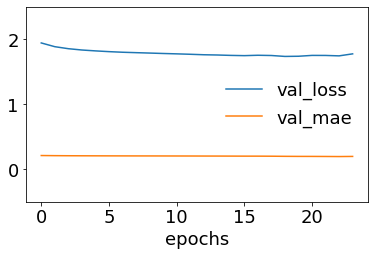

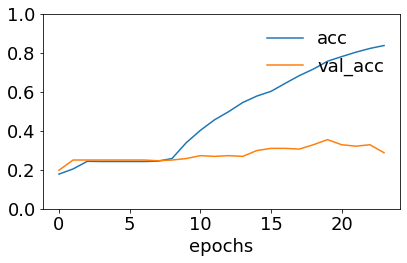

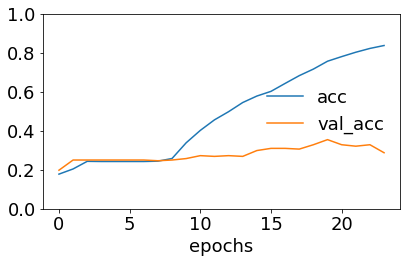

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_44 (Embedding)     (None, 432, 300)          6878400   
_________________________________________________________________
lstm_44 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_44 (Glo (None, 32)                0         
_________________________________________________________________
dense_88 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_89 (Dense)             (None, 8)                 136       
Total params: 6,921,688
Trainable params: 6,921,688
Non-trainable params: 0
_________________________________________________________________


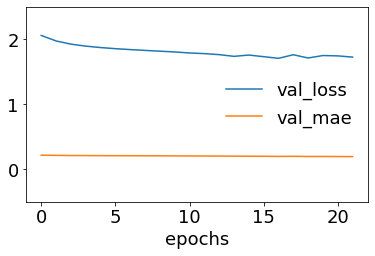

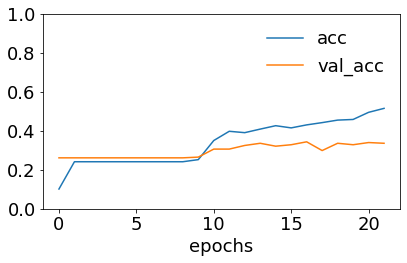

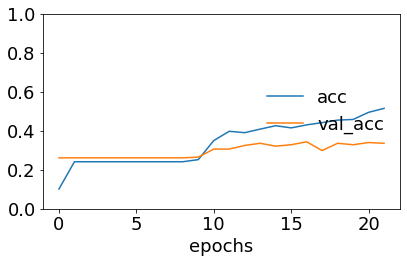

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_45 (Embedding)     (None, 432, 300)          6878400   
_________________________________________________________________
lstm_45 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_45 (Glo (None, 32)                0         
_________________________________________________________________
dense_90 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_91 (Dense)             (None, 8)                 136       
Total params: 6,921,688
Trainable params: 6,921,688
Non-trainable params: 0
_________________________________________________________________


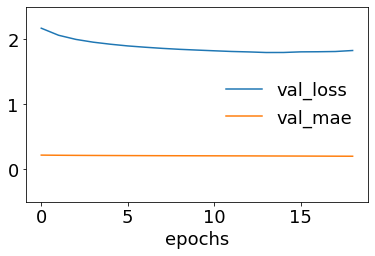

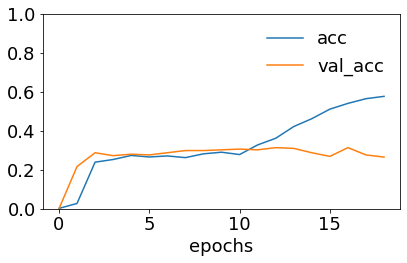

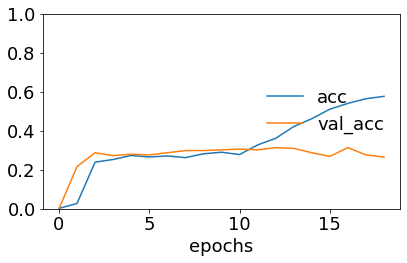

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_46 (Embedding)     (None, 432, 300)          6878400   
_________________________________________________________________
lstm_46 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_46 (Glo (None, 32)                0         
_________________________________________________________________
dense_92 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_93 (Dense)             (None, 8)                 136       
Total params: 6,921,688
Trainable params: 6,921,688
Non-trainable params: 0
_________________________________________________________________


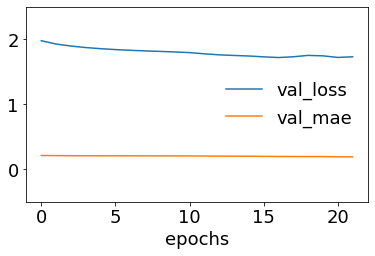

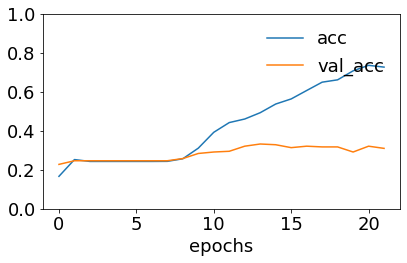

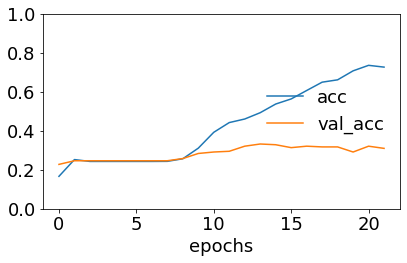

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_47 (Embedding)     (None, 432, 300)          6878400   
_________________________________________________________________
lstm_47 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_47 (Glo (None, 32)                0         
_________________________________________________________________
dense_94 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_95 (Dense)             (None, 8)                 136       
Total params: 6,921,688
Trainable params: 6,921,688
Non-trainable params: 0
_________________________________________________________________


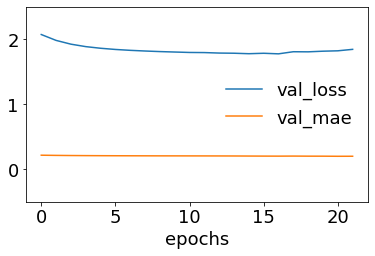

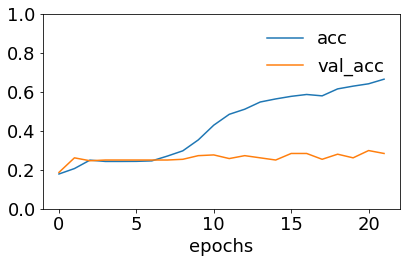

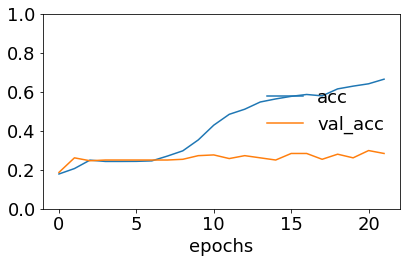

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_48 (Embedding)     (None, 432, 300)          6878400   
_________________________________________________________________
lstm_48 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_48 (Glo (None, 32)                0         
_________________________________________________________________
dense_96 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_97 (Dense)             (None, 8)                 136       
Total params: 6,921,688
Trainable params: 6,921,688
Non-trainable params: 0
_________________________________________________________________


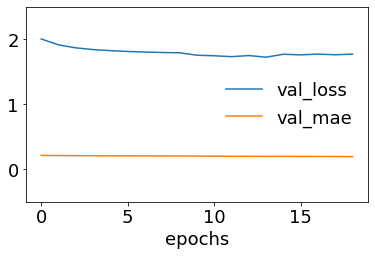

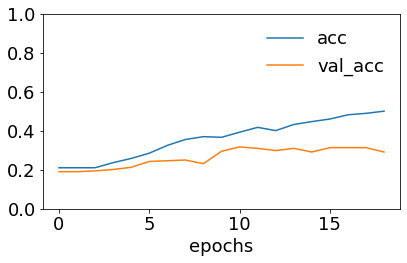

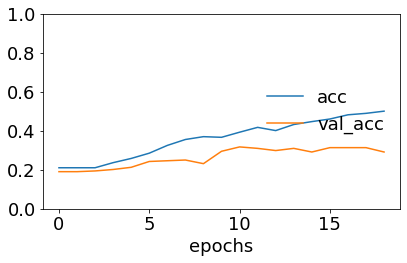

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_49 (Embedding)     (None, 432, 300)          6878400   
_________________________________________________________________
lstm_49 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_49 (Glo (None, 32)                0         
_________________________________________________________________
dense_98 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_99 (Dense)             (None, 8)                 136       
Total params: 6,921,688
Trainable params: 6,921,688
Non-trainable params: 0
_________________________________________________________________


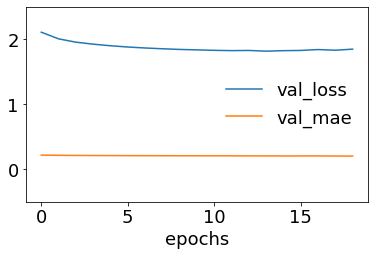

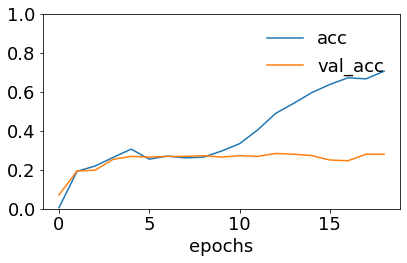

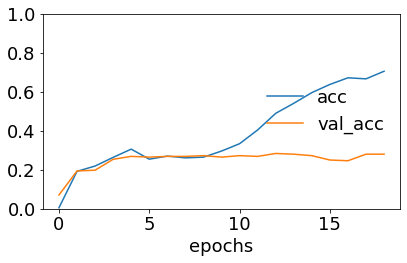

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_5 = lstm(texts5, data_5, embedding_matrix_5, num5)  # 120% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_50 (Embedding)     (None, 432, 300)          7125000   
_________________________________________________________________
lstm_50 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_50 (Glo (None, 32)                0         
_________________________________________________________________
dense_100 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_101 (Dense)            (None, 8)                 136       
Total params: 7,168,288
Trainable params: 7,168,288
Non-trainable params: 0
____________________________________________

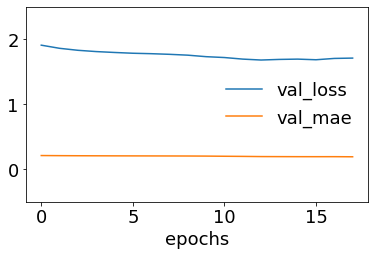

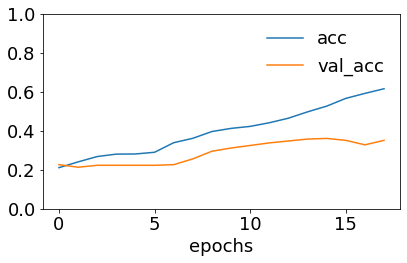

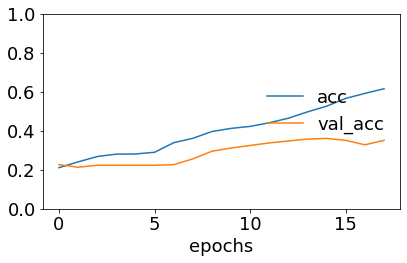

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_51 (Embedding)     (None, 432, 300)          7125000   
_________________________________________________________________
lstm_51 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_51 (Glo (None, 32)                0         
_________________________________________________________________
dense_102 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_103 (Dense)            (None, 8)                 136       
Total params: 7,168,288
Trainable params: 7,168,288
Non-trainable params: 0
_________________________________________________________________


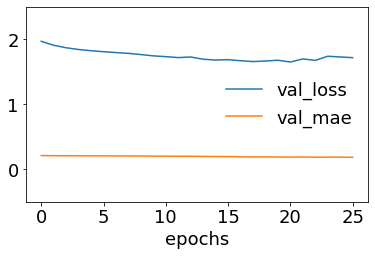

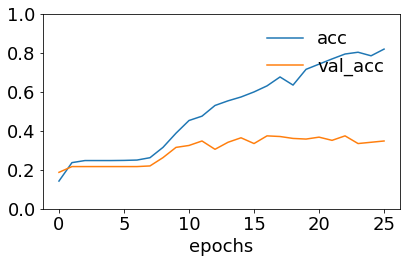

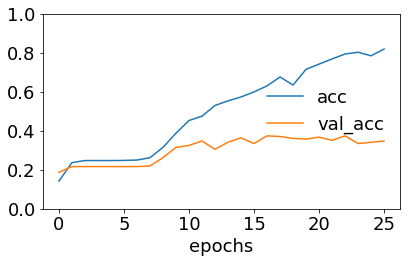

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_52 (Embedding)     (None, 432, 300)          7125000   
_________________________________________________________________
lstm_52 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_52 (Glo (None, 32)                0         
_________________________________________________________________
dense_104 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_105 (Dense)            (None, 8)                 136       
Total params: 7,168,288
Trainable params: 7,168,288
Non-trainable params: 0
_________________________________________________________________


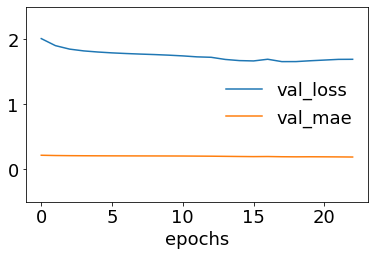

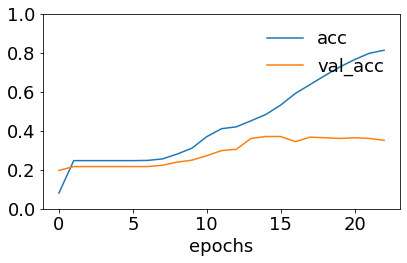

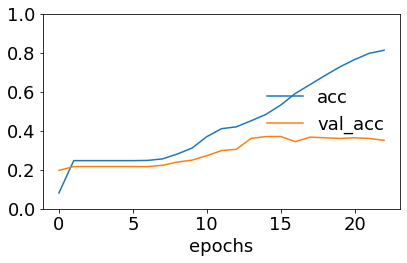

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_53 (Embedding)     (None, 432, 300)          7125000   
_________________________________________________________________
lstm_53 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_53 (Glo (None, 32)                0         
_________________________________________________________________
dense_106 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_107 (Dense)            (None, 8)                 136       
Total params: 7,168,288
Trainable params: 7,168,288
Non-trainable params: 0
_________________________________________________________________


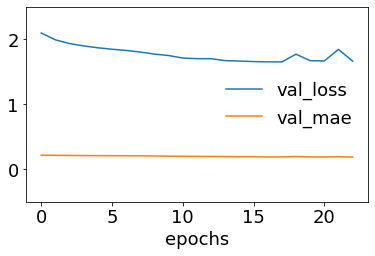

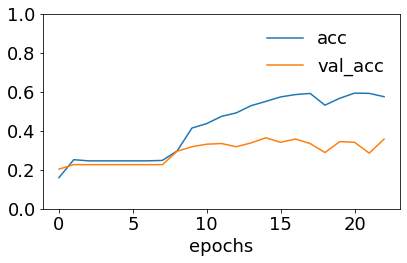

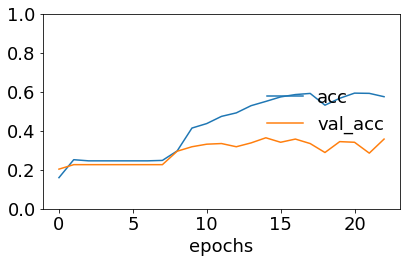

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "sequential_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_54 (Embedding)     (None, 432, 300)          7125000   
_________________________________________________________________
lstm_54 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_54 (Glo (None, 32)                0         
_________________________________________________________________
dense_108 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_109 (Dense)            (None, 8)                 136       
Total params: 7,168,288
Trainable params: 7,168,288
Non-trainable params: 0
_________________________________________________________________


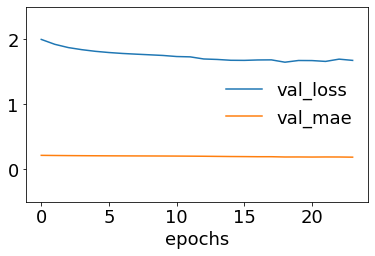

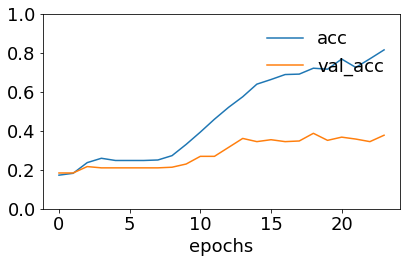

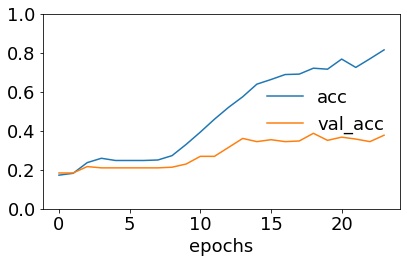

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_55 (Embedding)     (None, 432, 300)          7125000   
_________________________________________________________________
lstm_55 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_55 (Glo (None, 32)                0         
_________________________________________________________________
dense_110 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_111 (Dense)            (None, 8)                 136       
Total params: 7,168,288
Trainable params: 7,168,288
Non-trainable params: 0
_________________________________________________________________


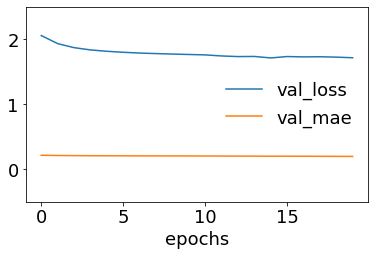

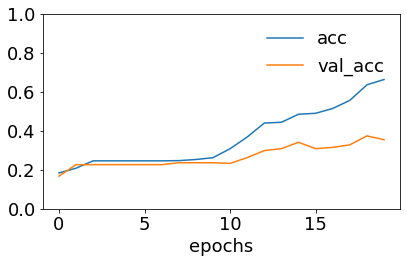

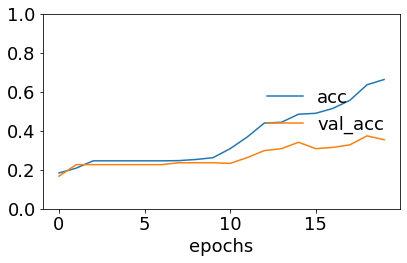

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00025: early stopping
Model: "sequential_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_56 (Embedding)     (None, 432, 300)          7125000   
_________________________________________________________________
lstm_56 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_56 (Glo (None, 32)                0         
_________________________________________________________________
dense_112 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_113 (Dense)            (None, 8)                 136       
Total params: 7,168,288
Trainable params: 7,168,288
Non-trainable params: 0
_________________________________________________________________


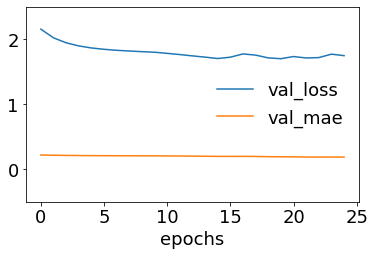

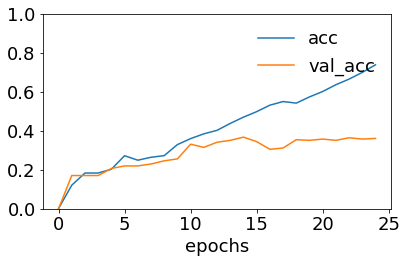

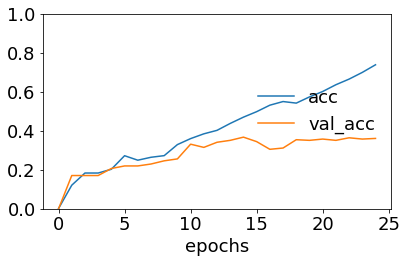

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_6 = lstm(texts6, data_6, embedding_matrix_6, num6)  # 150% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_57"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_57 (Embedding)     (None, 432, 300)          7303800   
_________________________________________________________________
lstm_57 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_57 (Glo (None, 32)                0         
_________________________________________________________________
dense_114 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_115 (Dense)            (None, 8)                 136       
Total params: 7,347,088
Trainable params: 7,347,088
Non-trainable params: 0
____________________________________________

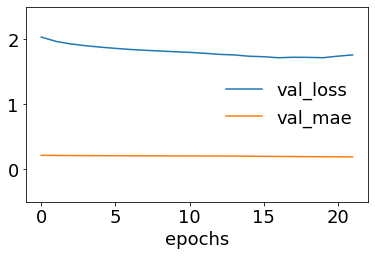

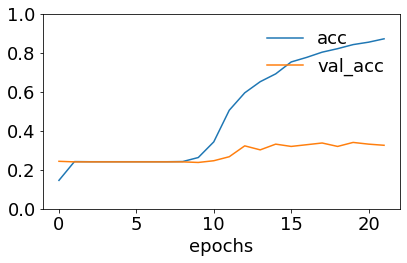

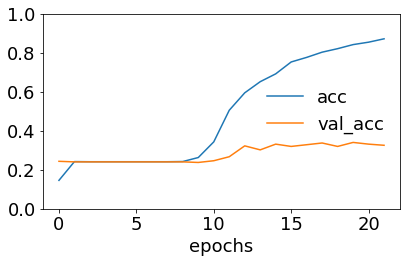

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_58"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_58 (Embedding)     (None, 432, 300)          7303800   
_________________________________________________________________
lstm_58 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_58 (Glo (None, 32)                0         
_________________________________________________________________
dense_116 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_117 (Dense)            (None, 8)                 136       
Total params: 7,347,088
Trainable params: 7,347,088
Non-trainable params: 0
_________________________________________________________________


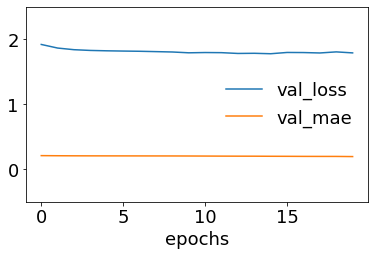

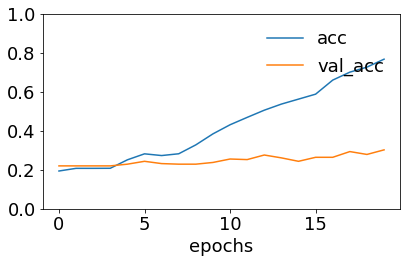

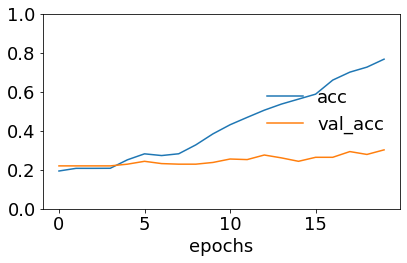

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "sequential_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_59 (Embedding)     (None, 432, 300)          7303800   
_________________________________________________________________
lstm_59 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_59 (Glo (None, 32)                0         
_________________________________________________________________
dense_118 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_119 (Dense)            (None, 8)                 136       
Total params: 7,347,088
Trainable params: 7,347,088
Non-trainable params: 0
_________________________________________________________________


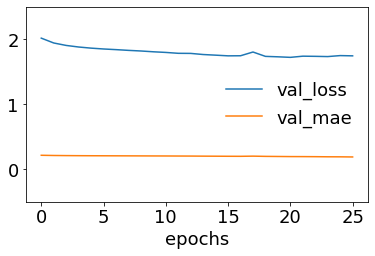

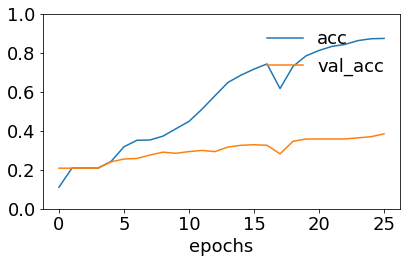

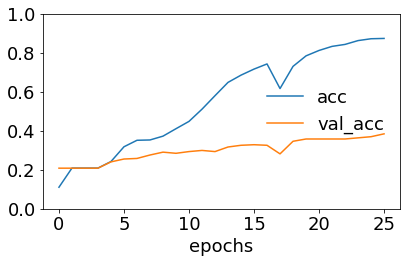

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "sequential_60"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_60 (Embedding)     (None, 432, 300)          7303800   
_________________________________________________________________
lstm_60 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_60 (Glo (None, 32)                0         
_________________________________________________________________
dense_120 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_121 (Dense)            (None, 8)                 136       
Total params: 7,347,088
Trainable params: 7,347,088
Non-trainable params: 0
_________________________________________________________________


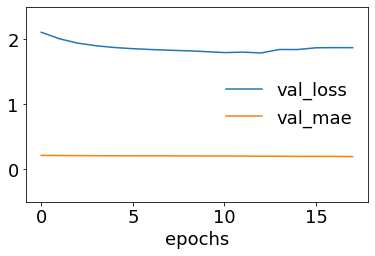

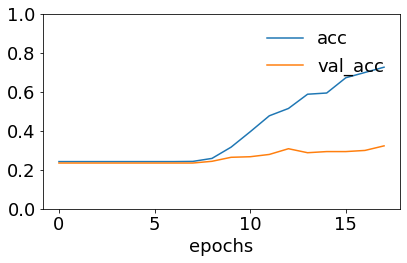

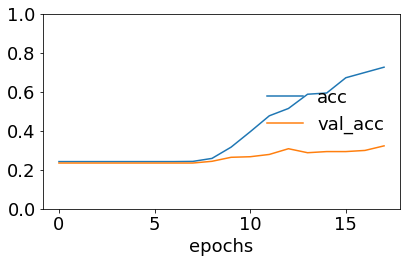

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_61 (Embedding)     (None, 432, 300)          7303800   
_________________________________________________________________
lstm_61 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_61 (Glo (None, 32)                0         
_________________________________________________________________
dense_122 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_123 (Dense)            (None, 8)                 136       
Total params: 7,347,088
Trainable params: 7,347,088
Non-trainable params: 0
_________________________________________________________________


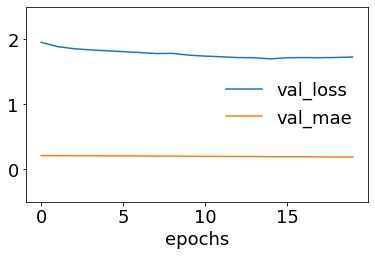

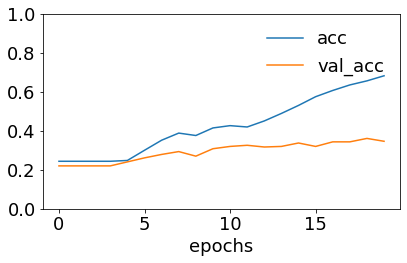

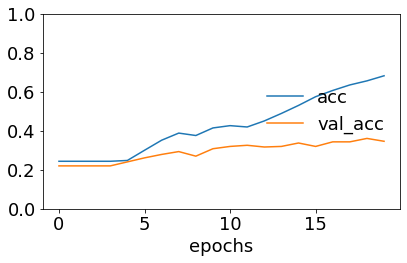

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "sequential_62"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_62 (Embedding)     (None, 432, 300)          7303800   
_________________________________________________________________
lstm_62 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_62 (Glo (None, 32)                0         
_________________________________________________________________
dense_124 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_125 (Dense)            (None, 8)                 136       
Total params: 7,347,088
Trainable params: 7,347,088
Non-trainable params: 0
_________________________________________________________________


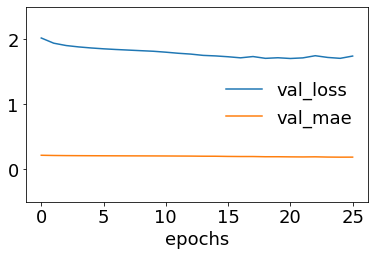

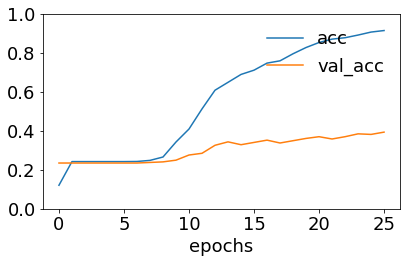

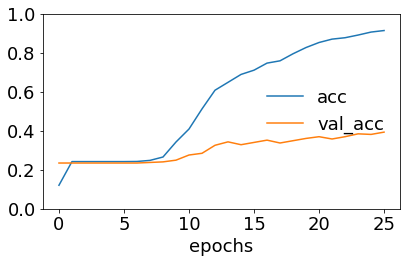

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_63"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_63 (Embedding)     (None, 432, 300)          7303800   
_________________________________________________________________
lstm_63 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_63 (Glo (None, 32)                0         
_________________________________________________________________
dense_126 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_127 (Dense)            (None, 8)                 136       
Total params: 7,347,088
Trainable params: 7,347,088
Non-trainable params: 0
_________________________________________________________________


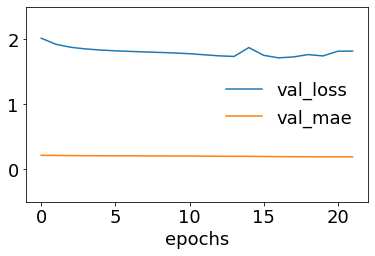

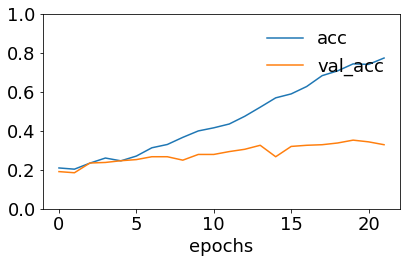

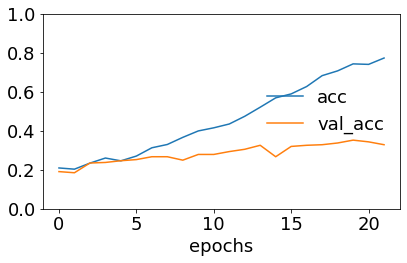

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_7 = lstm(texts7, data_7, embedding_matrix_7, num7)  # 180% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "sequential_64"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_64 (Embedding)     (None, 432, 300)          6690900   
_________________________________________________________________
lstm_64 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_64 (Glo (None, 32)                0         
_________________________________________________________________
dense_128 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_129 (Dense)            (None, 8)                 136       
Total params: 6,734,188
Trainable params: 6,734,188
Non-trainable params: 0
____________________________________________

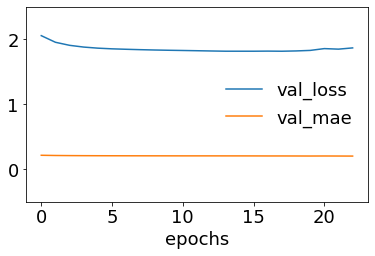

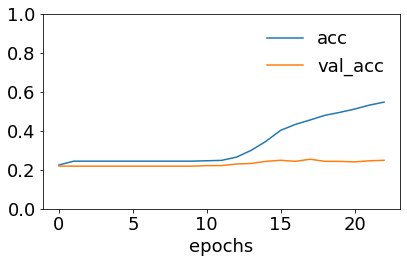

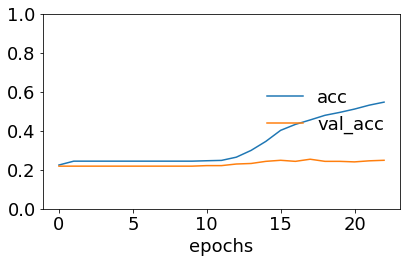

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "sequential_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_65 (Embedding)     (None, 432, 300)          6690900   
_________________________________________________________________
lstm_65 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_65 (Glo (None, 32)                0         
_________________________________________________________________
dense_130 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_131 (Dense)            (None, 8)                 136       
Total params: 6,734,188
Trainable params: 6,734,188
Non-trainable params: 0
_________________________________________________________________


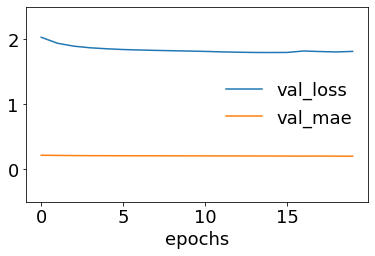

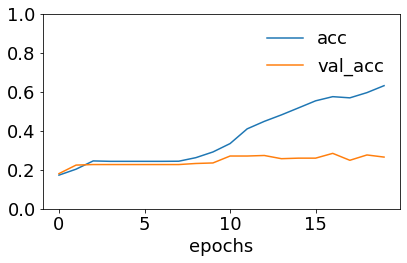

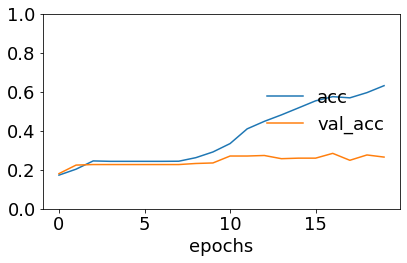

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00016: early stopping
Model: "sequential_66"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_66 (Embedding)     (None, 432, 300)          6690900   
_________________________________________________________________
lstm_66 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_66 (Glo (None, 32)                0         
_________________________________________________________________
dense_132 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_133 (Dense)            (None, 8)                 136       
Total params: 6,734,188
Trainable params: 6,734,188
Non-trainable params: 0
_________________________________________________________________


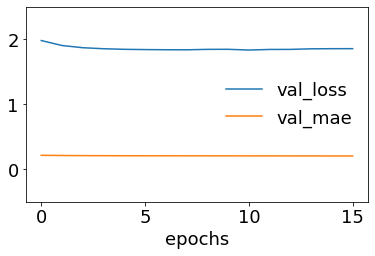

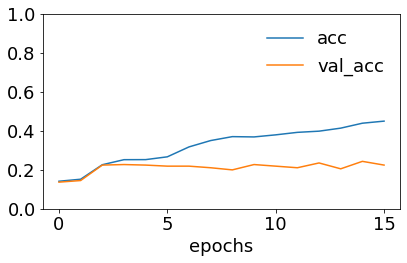

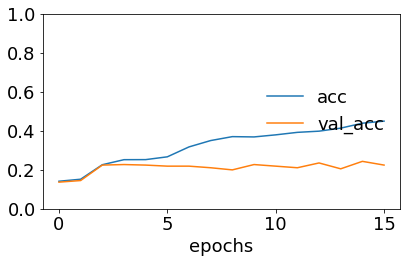

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "sequential_67"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_67 (Embedding)     (None, 432, 300)          6690900   
_________________________________________________________________
lstm_67 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_67 (Glo (None, 32)                0         
_________________________________________________________________
dense_134 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_135 (Dense)            (None, 8)                 136       
Total params: 6,734,188
Trainable params: 6,734,188
Non-trainable params: 0
_________________________________________________________________


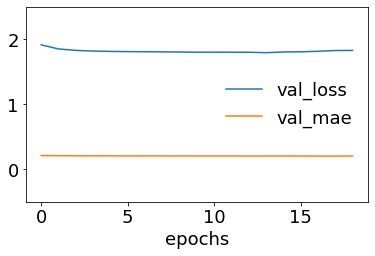

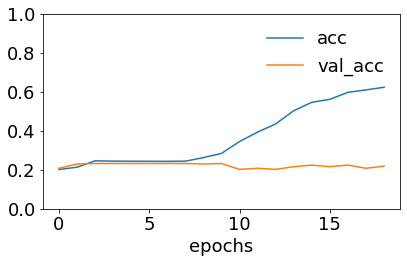

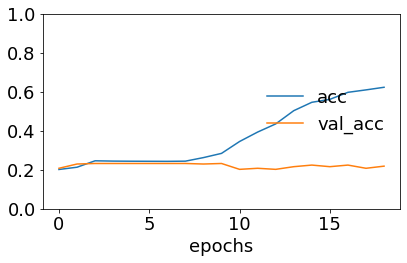

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


9.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00016: early stopping
Model: "sequential_68"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_68 (Embedding)     (None, 432, 300)          6690900   
_________________________________________________________________
lstm_68 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_68 (Glo (None, 32)                0         
_________________________________________________________________
dense_136 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_137 (Dense)            (None, 8)                 136       
Total params: 6,734,188
Trainable params: 6,734,188
Non-trainable params: 0
_________________________________________________________________


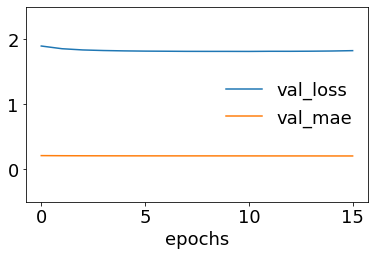

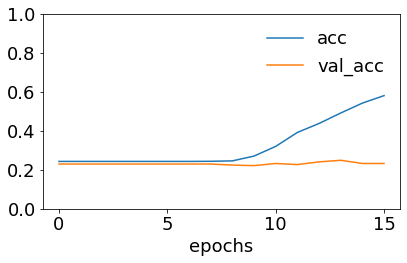

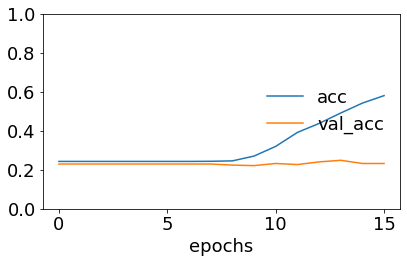

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "sequential_69"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_69 (Embedding)     (None, 432, 300)          6690900   
_________________________________________________________________
lstm_69 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_69 (Glo (None, 32)                0         
_________________________________________________________________
dense_138 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_139 (Dense)            (None, 8)                 136       
Total params: 6,734,188
Trainable params: 6,734,188
Non-trainable params: 0
_________________________________________________________________


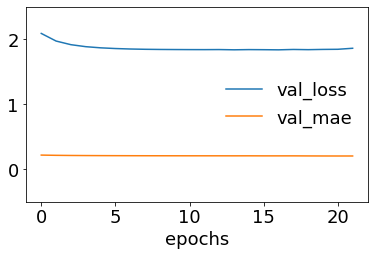

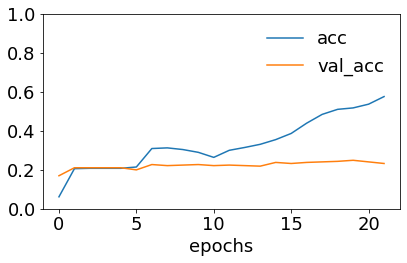

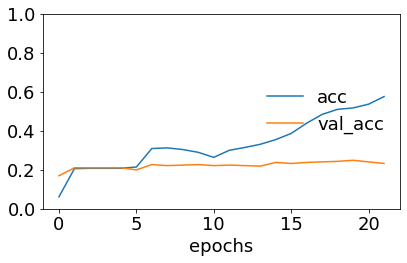

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0
Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "sequential_70"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_70 (Embedding)     (None, 432, 300)          6690900   
_________________________________________________________________
lstm_70 (LSTM)               (None, 432, 32)           42624     
_________________________________________________________________
global_max_pooling1d_70 (Glo (None, 32)                0         
_________________________________________________________________
dense_140 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_141 (Dense)            (None, 8)                 136       
Total params: 6,734,188
Trainable params: 6,734,188
Non-trainable params: 0
_________________________________________________________________


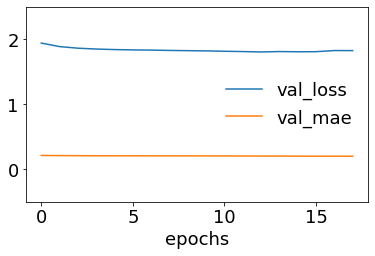

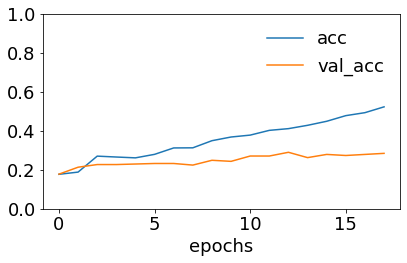

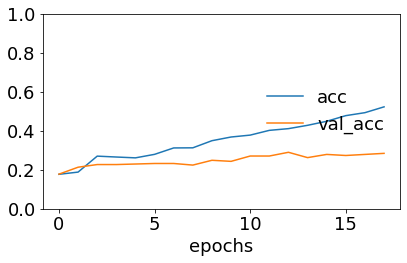

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_8 = lstm(texts8, data_8, embedding_matrix_8, num8)  # 200% data augmentation

In [0]:
print('20% augmentation')
print(scores_lstm_1.mean())
print('\n50% augmentation')
print(scores_lstm_2.mean())
print('\n80% augmentation')
print(scores_lstm_3.mean())
print('\n100% augmentation')
print(scores_lstm_4.mean())
print('\n120% augmentation')
print(scores_lstm_5.mean())
print('\n150% augmentation')
print(scores_lstm_6.mean())
print('\n180% augmentation')
print(scores_lstm_7.mean())
print('\n200% augmentation')
print(scores_lstm_8.mean())

20% augmentation
accuracy             0.288157
precision            0.173825
recall               0.288157
f1                   0.182651
cohen_kappa_score    0.071633
auc                  0.571065
dtype: float64

50% augmentation
accuracy             0.253534
precision            0.187598
recall               0.253534
f1                   0.179864
cohen_kappa_score    0.035662
auc                  0.551400
dtype: float64

80% augmentation
accuracy             0.264089
precision            0.160943
recall               0.264089
f1                   0.170393
cohen_kappa_score    0.054769
auc                  0.568295
dtype: float64

100% augmentation
accuracy             0.282383
precision            0.206851
recall               0.282383
f1                   0.200744
cohen_kappa_score    0.079534
auc                  0.594432
dtype: float64

120% augmentation
accuracy             0.290663
precision            0.198756
recall               0.290663
f1                   0.212988
cohen_kap

#### LSTM + tf-idf

In [0]:
def tfidf(texts, data_cleaned):
  
  word_vectorizer = TfidfVectorizer(
      max_features=500)

  word_vectorizer.fit(data_cleaned['texts'])
  tf_idf = word_vectorizer.transform(data_cleaned['texts'])
  tf_idf = tf_idf.toarray()
  texts_tf= np.concatenate([texts, tf_idf], axis = 1)
  return tf_idf, texts_tf

In [0]:
# TF-IDF vector using 20% to 200% data augmentation (20%, 50%, 80%, 100%, 120%, 150%, 180%, 200%)
[tf1, texts_tf1] = tfidf(texts1, data_1)
[tf2, texts_tf2] = tfidf(texts2, data_2)
[tf3, texts_tf3] = tfidf(texts3, data_3)
[tf4, texts_tf4] = tfidf(texts4, data_4)
[tf5, texts_tf5] = tfidf(texts5, data_5)
[tf6, texts_tf6] = tfidf(texts6, data_6)
[tf7, texts_tf7] = tfidf(texts7, data_7)
[tf8, texts_tf8] = tfidf(texts8, data_8)

In [0]:
def lstm_tf(texts_tf, data_cleaned, embedding_matrix, num_words):
  # some configuration
  VALIDATION_SPLIT = 0.1   
  BATCH_SIZE = 32   # number of training samples to work through
  EPOCHS = 200   # number of complete passes through the training dataset
  LEARNING_RATE = 0.0002
  N_SPLITS = 7


  print('Building Bi-LSTM model...')
  kfold = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state = 9)
  scores_lstm_tf = pd.DataFrame(columns = ['accuracy','precision', 'recall', 'f1', 'cohen_kappa_score','auc'])
  labels = data_cleaned['positivity'].values
  METRICS = [
        'accuracy',
        'mae'       
  ]



  embedding_layer = tf.keras.layers.Embedding(
    num_words,
    EMBEDDING_DIM,
    weights=[embedding_matrix],
    input_length=MAX_SEQUENCE_LENGTH,
    trainable=True
  )


  for train, test in kfold.split(texts_tf, labels):
  
    x_train = texts_tf[train]
    x_test = texts_tf[test]
    x_train_1 = x_train[:, : MAX_SEQUENCE_LENGTH] # training set for word embeddings using GloVe
    x_train_2 = x_train[:, MAX_SEQUENCE_LENGTH:] # training set for tfidf feature
    x_test_1 = x_test[:, :MAX_SEQUENCE_LENGTH] # testing set for word embedding using GloVe
    x_test_2 = x_test[:, MAX_SEQUENCE_LENGTH:] # testing set for tfidf feature

  # transfer multi-class to binary classes
    y_train = pd.get_dummies(labels[train])
    y_test = pd.get_dummies(labels[test])
  
  # using list of zeros to represents missing classes
    m = sum(y_train.columns)-sum(y_test.columns)
    print(m)    
    if m > 0:
      n = int(m)-2
      print(y_test)
      y_test.insert(n, m, 0)
    elif m < 0:
      n = abs(int(m))-2
      y_train.insert(n, abs(m), 0)

    input_1 = tf.keras.Input(shape=(MAX_SEQUENCE_LENGTH,)) # input layer for LSTM
    x = embedding_layer(input_1)
    x = tf.keras.layers.LSTM(32)(x)   # LSTM layer on embedding layer

    input_2 = tf.keras.Input(shape=(500,))  # input layer for TF-IDF vector
    tf_vec = tf.keras.layers.LayerNormalization()(input_2)  # TF-IDF layer
    tf_vec = tf.keras.layers.Dense(32, activation = 'relu')(tf_vec)
    concat_layer = tf.keras.layers.Concatenate()([x, tf_vec])  # concatenate LSTM and TF-IDF layer

    dense_layer = tf.keras.layers.Dense(16, activation='sigmoid')(concat_layer)
    output = tf.keras.layers.Dense(8, activation='softmax')(dense_layer)
    model = tf.keras.models.Model([input_1, input_2], output)

    
    model.compile(
      loss = 'categorical_crossentropy',
      optimizer = tf.keras.optimizers.Adam(learning_rate = LEARNING_RATE),
      metrics = METRICS,
    
    )


  # Training model:
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5, restore_best_weights=True)  # early stopping to avoid overfitting

    print('Training model...')
    r = model.fit(
      [x_train_1, x_train_2],
      y_train,
      batch_size = BATCH_SIZE,
      epochs = EPOCHS,
      validation_split = VALIDATION_SPLIT,
      verbose = 0,
      callbacks=[es]
    )


    model.summary()

  # plot loss
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['val_loss'], label='val_loss')
    plt.plot(r.history['val_mae'], label='val_mae')
    plt.xlabel('epochs') 
    plt.ylim(-0.5, 2.5)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()

  # plot accuracy
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'upper right')
    plt.show()

    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()

  # predict on testing set
    predictions_lstm_tf = model.predict([x_test_1, x_test_2])
    scores = model.evaluate(x = [x_test_1, x_test_2], y=y_test)    
    y_test = y_test.to_numpy()

  # confusion matrix
    cnf_matrix = confusion_matrix(y_test.argmax(axis=1), predictions_lstm_tf.argmax(axis=1))
    report = metrics.classification_report(y_test.argmax(axis=1), predictions_lstm_tf.argmax(axis=1), output_dict=True)
    df = pd.DataFrame(report)
    ck = cohen_kappa_score(y_test.argmax(axis=1), predictions_lstm_tf.argmax(axis=1))

  # auc
    y_true = pd.get_dummies(labels[test])
    y_true = y_true.to_numpy()
    
    if m <= 0:
      y_pred = predictions_lstm_tf
    else:
      y_pred = np.delete(predictions_lstm_tf, n, 1)
    
    auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='weighted')

    scores_lstm_tf = scores_lstm_tf.append({'accuracy': df['accuracy'][0], 'precision': df['weighted avg'][0], 
                                            'recall': df['weighted avg'][1], 'f1': df['weighted avg'][2], 
                                            'cohen_kappa_score': ck, 'auc': auc },  ignore_index=True)
  return scores_lstm_tf

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00031: early stopping
Model: "model_22"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_45 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_46 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_76 (Embedding)        (None, 432, 300)     4872000     input_45[0][0]                   
__________________________________________________________________________________________________
layer_normalization_22 (LayerNo (None, 500)          1000        input_46[0][0]          

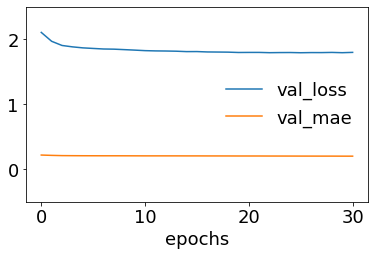

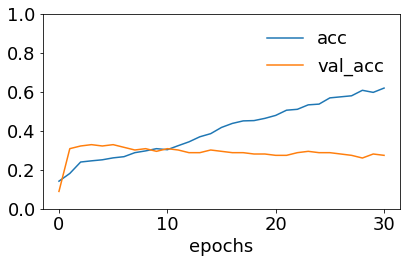

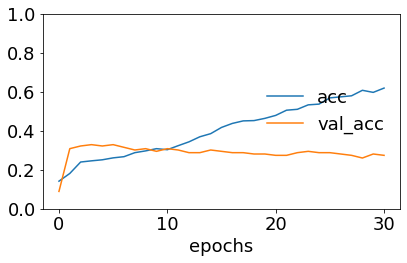

244/244 [==============================] - 0s 415us/sample - loss: 1.7920 - accuracy: 0.3320 - mae: 0.2033
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00030: early stopping
Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_47 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_48 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_76 (Embedding)        (None, 432, 300)     4872000     input_47[0][0]                   
__________________________________________________________________________________________________
layer_normalization_23 (LayerNo (None, 500)          1000        input_48[0][0]          

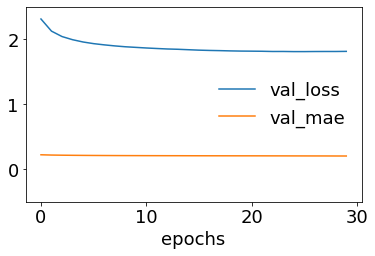

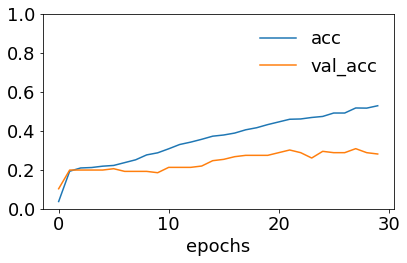

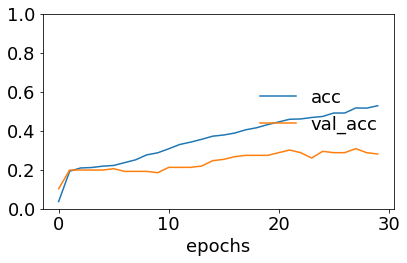

244/244 [==============================] - 0s 402us/sample - loss: 1.7968 - accuracy: 0.3115 - mae: 0.2040
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "model_24"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_49 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_50 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_76 (Embedding)        (None, 432, 300)     4872000     input_49[0][0]                   
__________________________________________________________________________________________________
layer_normalization_24 (LayerNo (None, 500)          1000        input_50[0][0]          

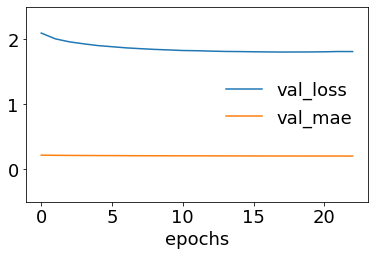

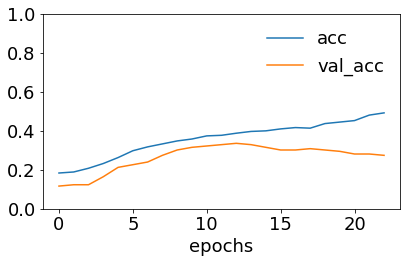

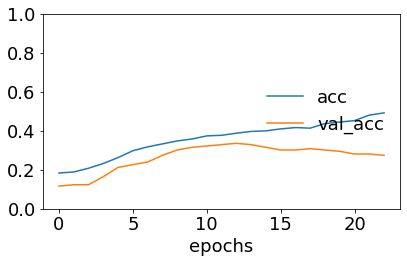

244/244 [==============================] - 0s 419us/sample - loss: 1.8300 - accuracy: 0.2295 - mae: 0.2054
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    0    0    1
1      0    0    0    0    0    1    0
2      0    0    0    0    1    0    0
3      0    0    0    0    1    0    0
4      0    0    0    1    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
238    0    0    0    1    0    0    0
239    0    0    0    1    0    0    0
240    0    1    0    0    0    0    0
241    0    1    0    0    0    0    0
242    0    0    0    0    1    0    0

[243 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00036: early stopping
Model: "model_25"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_51 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_52 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_76 (Embedding)        (None, 432, 300)     4872000     input_51[0][0]                   
__________________________________________________________________________________________________
layer_normalization_25 (LayerNo (None, 500)          1000        input_52[0][0]          

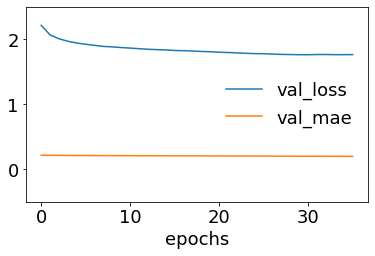

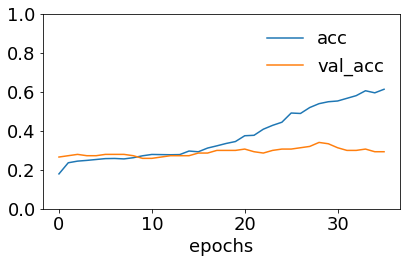

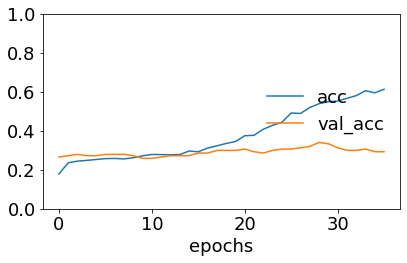

243/243 [==============================] - 1s 2ms/sample - loss: 1.7698 - accuracy: 0.3169 - mae: 0.2011
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    0    1    0
1      0    0    1    0    0    0    0
2      0    1    0    0    0    0    0
3      0    1    0    0    0    0    0
4      0    0    0    0    1    0    0
..   ...  ...  ...  ...  ...  ...  ...
238    0    0    0    1    0    0    0
239    0    0    0    0    0    1    0
240    0    1    0    0    0    0    0
241    0    0    0    1    0    0    0
242    0    0    0    0    0    1    0

[243 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00025: early stopping
Model: "model_26"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_53 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_54 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_76 (Embedding)        (None, 432, 300)     4872000     input_53[0][0]                   
__________________________________________________________________________________________________
layer_normalization_26 (LayerNo (None, 500)          1000        input_54[0][0]          

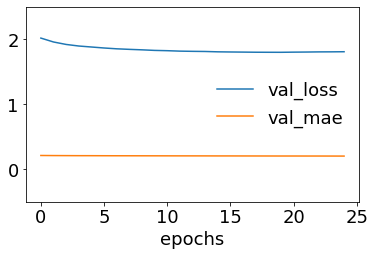

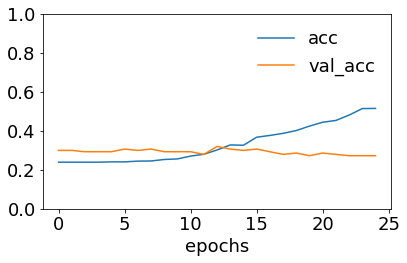

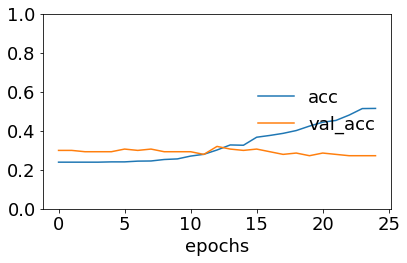

243/243 [==============================] - 1s 2ms/sample - loss: 1.7761 - accuracy: 0.2798 - mae: 0.2038
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    1    0    0
1      0    0    0    0    1    0    0
2      0    0    1    0    0    0    0
3      0    0    0    0    1    0    0
4      0    0    0    0    1    0    0
..   ...  ...  ...  ...  ...  ...  ...
238    0    1    0    0    0    0    0
239    0    0    0    1    0    0    0
240    0    0    0    0    0    1    0
241    0    0    1    0    0    0    0
242    0    1    0    0    0    0    0

[243 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "model_27"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_55 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_56 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_76 (Embedding)        (None, 432, 300)     4872000     input_55[0][0]                   
__________________________________________________________________________________________________
layer_normalization_27 (LayerNo (None, 500)          1000        input_56[0][0]          

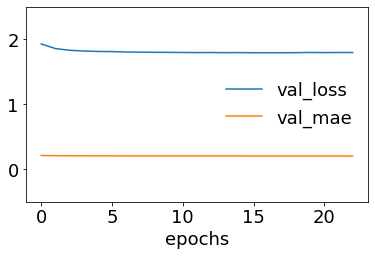

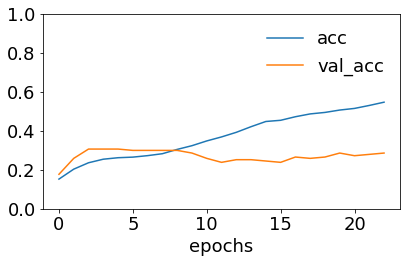

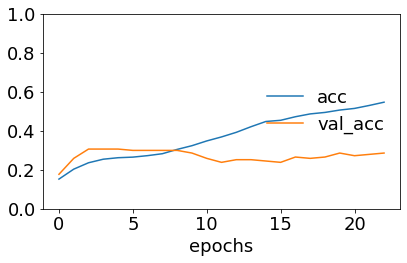

243/243 [==============================] - 1s 2ms/sample - loss: 1.8160 - accuracy: 0.2551 - mae: 0.2058
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    1    0    0    0
1      0    0    0    1    0    0    0
2      0    0    0    0    1    0    0
3      0    0    0    0    1    0    0
4      0    0    0    0    1    0    0
..   ...  ...  ...  ...  ...  ...  ...
238    0    0    0    0    1    0    0
239    0    0    1    0    0    0    0
240    0    1    0    0    0    0    0
241    0    0    0    1    0    0    0
242    0    1    0    0    0    0    0

[243 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "model_28"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_57 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_58 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_76 (Embedding)        (None, 432, 300)     4872000     input_57[0][0]                   
__________________________________________________________________________________________________
layer_normalization_28 (LayerNo (None, 500)          1000        input_58[0][0]          

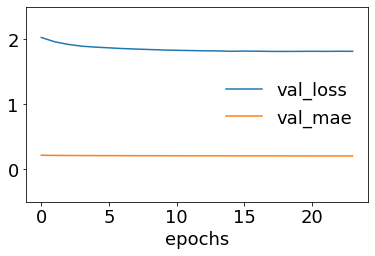

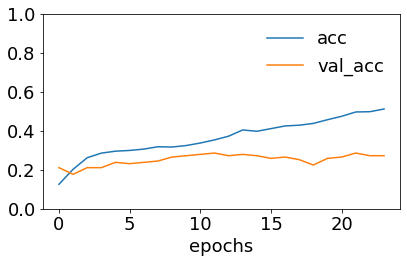

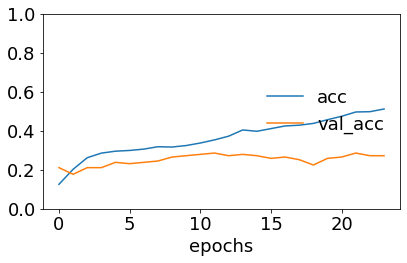

243/243 [==============================] - 1s 2ms/sample - loss: 1.8128 - accuracy: 0.2675 - mae: 0.2055


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_tf_1 = lstm_tf(texts_tf1, data_1, embedding_matrix_1, num1)  # 20% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00027: early stopping
Model: "model_29"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_59 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_60 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_77 (Embedding)        (None, 432, 300)     5821500     input_59[0][0]                   
__________________________________________________________________________________________________
layer_normalization_29 (LayerNo (None, 500)          1000        input_60[0][0]          

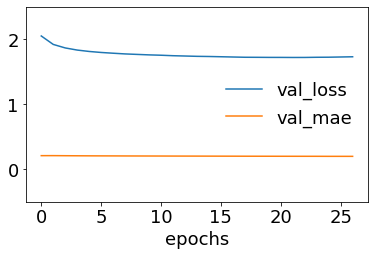

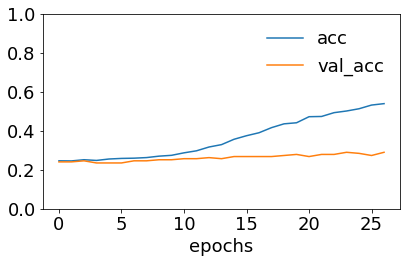

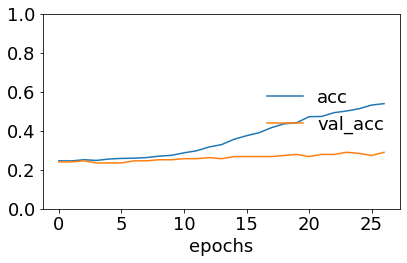

305/305 [==============================] - 0s 406us/sample - loss: 1.7783 - accuracy: 0.2918 - mae: 0.2014
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "model_30"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_61 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_62 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_77 (Embedding)        (None, 432, 300)     5821500     input_61[0][0]                   
__________________________________________________________________________________________________
layer_normalization_30 (LayerNo (None, 500)          1000        input_62[0][0]          

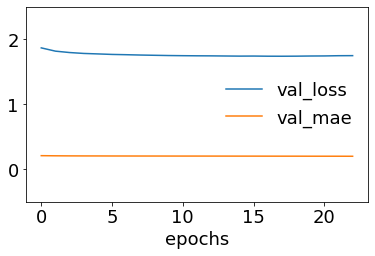

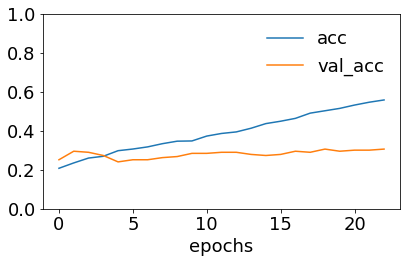

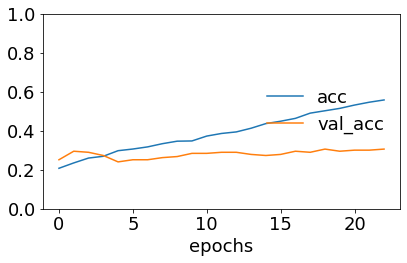

305/305 [==============================] - 0s 416us/sample - loss: 1.7967 - accuracy: 0.2328 - mae: 0.2041
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    1    0    0    0    0
1      0    0    0    1    0    0    0
2      0    0    0    0    1    0    0
3      0    0    0    0    1    0    0
4      0    1    0    0    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
299    0    0    0    0    0    0    1
300    0    0    0    0    1    0    0
301    0    1    0    0    0    0    0
302    0    1    0    0    0    0    0
303    0    0    0    0    0    1    0

[304 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "model_31"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_63 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_64 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_77 (Embedding)        (None, 432, 300)     5821500     input_63[0][0]                   
__________________________________________________________________________________________________
layer_normalization_31 (LayerNo (None, 500)          1000        input_64[0][0]          

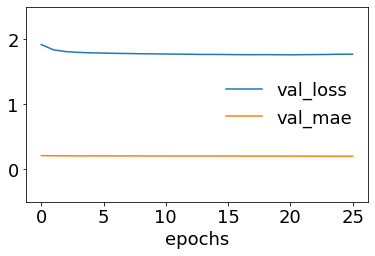

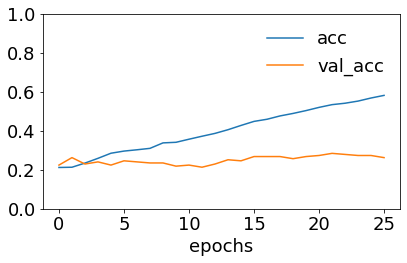

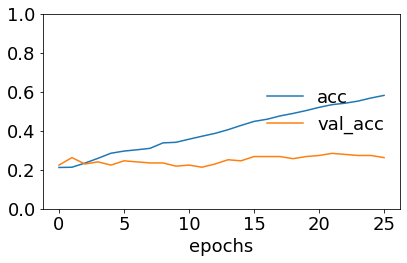

304/304 [==============================] - 1s 2ms/sample - loss: 1.7738 - accuracy: 0.2928 - mae: 0.2023
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    0    1    0
1      0    1    0    0    0    0    0
2      0    0    0    0    1    0    0
3      0    0    0    0    0    0    1
4      0    0    0    0    1    0    0
..   ...  ...  ...  ...  ...  ...  ...
299    0    0    1    0    0    0    0
300    0    0    1    0    0    0    0
301    0    0    0    0    1    0    0
302    0    1    0    0    0    0    0
303    0    0    0    1    0    0    0

[304 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00032: early stopping
Model: "model_32"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_65 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_66 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_77 (Embedding)        (None, 432, 300)     5821500     input_65[0][0]                   
__________________________________________________________________________________________________
layer_normalization_32 (LayerNo (None, 500)          1000        input_66[0][0]          

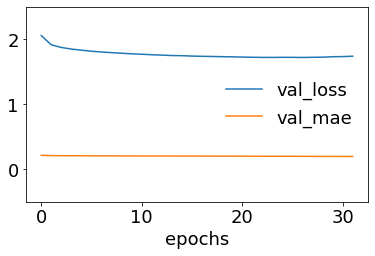

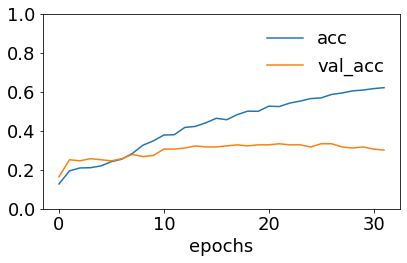

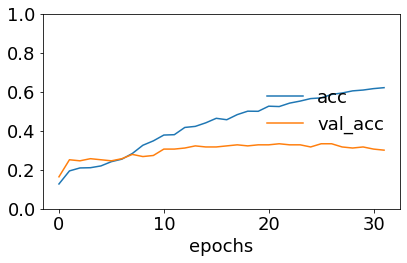

304/304 [==============================] - 1s 2ms/sample - loss: 1.7822 - accuracy: 0.2961 - mae: 0.2002
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    1    0    0    0
1      0    1    0    0    0    0    0
2      0    1    0    0    0    0    0
3      0    1    0    0    0    0    0
4      0    1    0    0    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
299    0    0    1    0    0    0    0
300    0    0    0    0    1    0    0
301    0    0    1    0    0    0    0
302    0    0    0    0    1    0    0
303    0    0    0    0    1    0    0

[304 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "model_33"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_67 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_68 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_77 (Embedding)        (None, 432, 300)     5821500     input_67[0][0]                   
__________________________________________________________________________________________________
layer_normalization_33 (LayerNo (None, 500)          1000        input_68[0][0]          

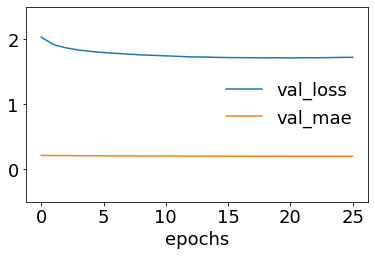

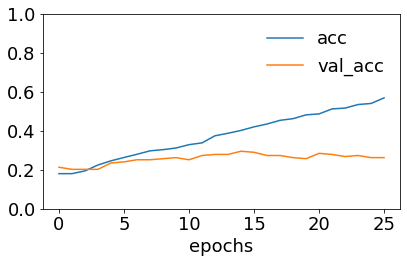

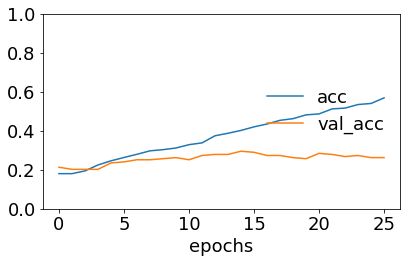

304/304 [==============================] - 1s 2ms/sample - loss: 1.7610 - accuracy: 0.2928 - mae: 0.2013
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    0    1    0
1      0    0    0    0    0    0    1
2      0    0    1    0    0    0    0
3      0    1    0    0    0    0    0
4      0    0    0    1    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
299    0    0    1    0    0    0    0
300    0    0    1    0    0    0    0
301    0    1    0    0    0    0    0
302    0    0    0    0    1    0    0
303    0    0    1    0    0    0    0

[304 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "model_34"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_69 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_70 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_77 (Embedding)        (None, 432, 300)     5821500     input_69[0][0]                   
__________________________________________________________________________________________________
layer_normalization_34 (LayerNo (None, 500)          1000        input_70[0][0]          

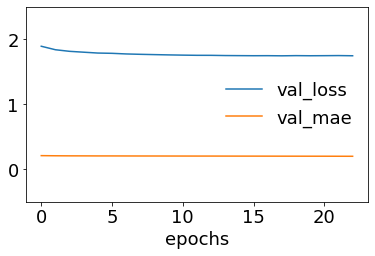

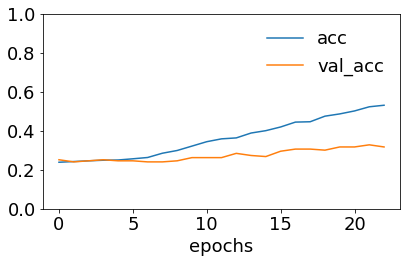

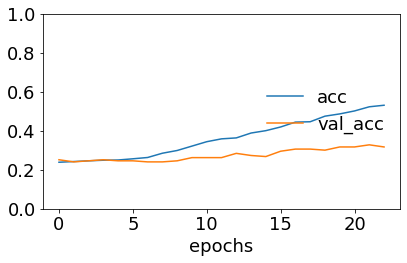

304/304 [==============================] - 1s 2ms/sample - loss: 1.7771 - accuracy: 0.2303 - mae: 0.2024
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00027: early stopping
Model: "model_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_71 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_72 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_77 (Embedding)        (None, 432, 300)     5821500     input_71[0][0]                   
__________________________________________________________________________________________________
layer_normalization_35 (LayerNo (None, 500)          1000        input_72[0][0]          

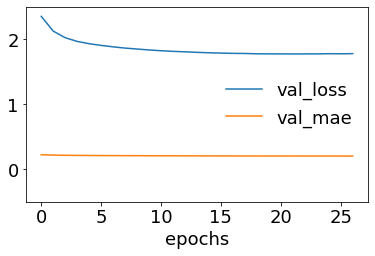

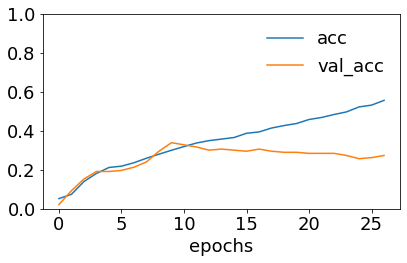

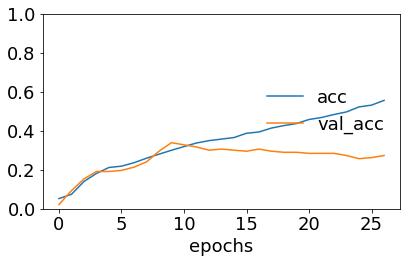

304/304 [==============================] - 0s 431us/sample - loss: 1.8098 - accuracy: 0.2796 - mae: 0.2048


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_tf_2 = lstm_tf(texts_tf2, data_2, embedding_matrix_2, num2)  # 50% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "model_36"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_73 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_74 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_78 (Embedding)        (None, 432, 300)     6372900     input_73[0][0]                   
__________________________________________________________________________________________________
layer_normalization_36 (LayerNo (None, 500)          1000        input_74[0][0]          

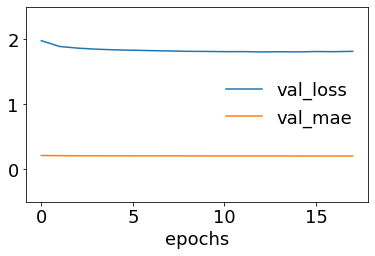

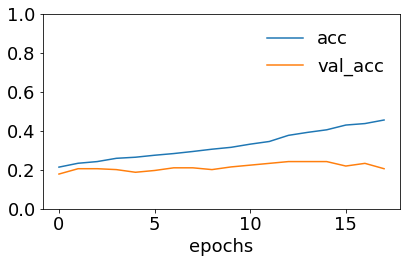

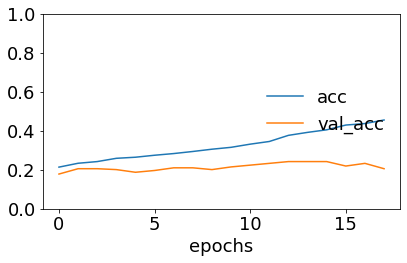

366/366 [==============================] - 0s 421us/sample - loss: 1.7818 - accuracy: 0.2842 - mae: 0.2034
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    1    0    0    0
1      0    0    0    0    0    1    0
2      0    0    0    0    0    1    0
3      0    1    0    0    0    0    0
4      0    0    0    0    0    1    0
..   ...  ...  ...  ...  ...  ...  ...
360    0    0    0    1    0    0    0
361    0    0    0    0    1    0    0
362    0    0    0    1    0    0    0
363    0    0    1    0    0    0    0
364    0    0    0    0    1    0    0

[365 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "model_37"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_75 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_76 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_78 (Embedding)        (None, 432, 300)     6372900     input_75[0][0]                   
__________________________________________________________________________________________________
layer_normalization_37 (LayerNo (None, 500)          1000        input_76[0][0]          

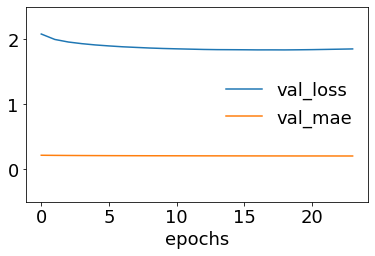

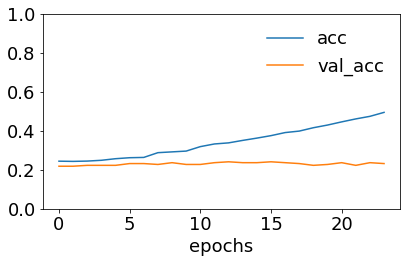

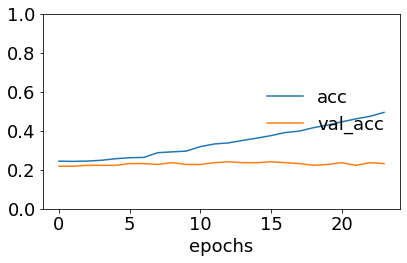

365/365 [==============================] - 1s 1ms/sample - loss: 1.7830 - accuracy: 0.2795 - mae: 0.2027
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    1    0    0    0    0
1      0    0    1    0    0    0    0
2      0    0    1    0    0    0    0
3      0    0    0    0    1    0    0
4      0    0    0    0    0    1    0
..   ...  ...  ...  ...  ...  ...  ...
360    0    0    0    1    0    0    0
361    0    0    0    1    0    0    0
362    0    1    0    0    0    0    0
363    0    0    0    0    1    0    0
364    0    0    0    1    0    0    0

[365 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "model_38"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_77 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_78 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_78 (Embedding)        (None, 432, 300)     6372900     input_77[0][0]                   
__________________________________________________________________________________________________
layer_normalization_38 (LayerNo (None, 500)          1000        input_78[0][0]          

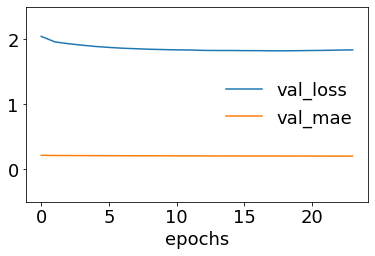

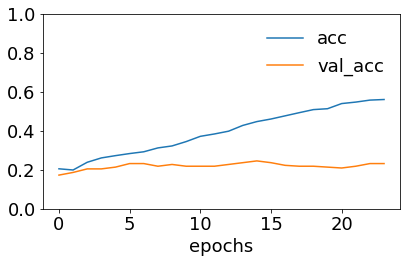

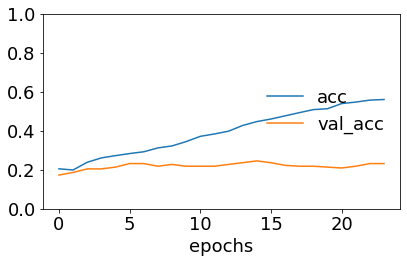

365/365 [==============================] - 1s 2ms/sample - loss: 1.8259 - accuracy: 0.2301 - mae: 0.2039
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    1    0    0
1      0    0    0    1    0    0    0
2      0    0    0    0    0    0    1
3      0    0    0    0    1    0    0
4      1    0    0    0    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
360    0    0    1    0    0    0    0
361    0    0    0    0    0    1    0
362    0    0    0    0    1    0    0
363    0    0    0    0    1    0    0
364    0    0    0    0    0    1    0

[365 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "model_39"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_79 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_80 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_78 (Embedding)        (None, 432, 300)     6372900     input_79[0][0]                   
__________________________________________________________________________________________________
layer_normalization_39 (LayerNo (None, 500)          1000        input_80[0][0]          

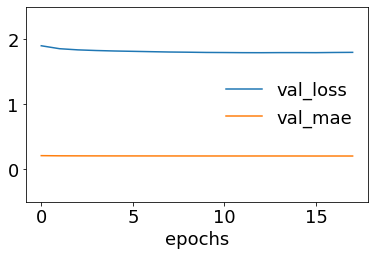

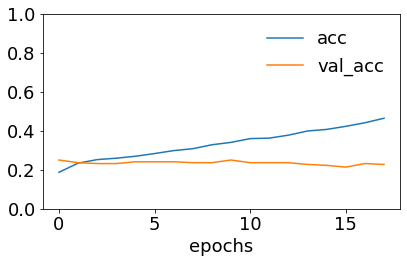

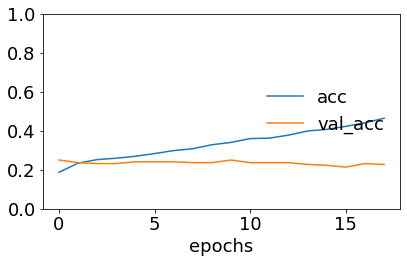

365/365 [==============================] - 1s 2ms/sample - loss: 1.7934 - accuracy: 0.2685 - mae: 0.2044
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "model_40"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_81 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_82 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_78 (Embedding)        (None, 432, 300)     6372900     input_81[0][0]                   
__________________________________________________________________________________________________
layer_normalization_40 (LayerNo (None, 500)          1000        input_82[0][0]          

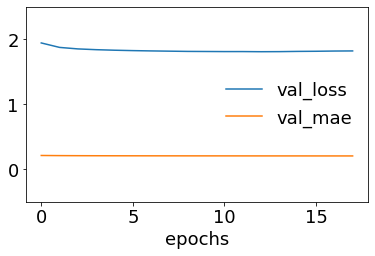

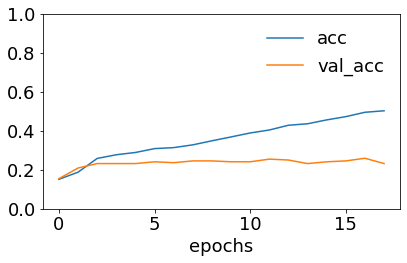

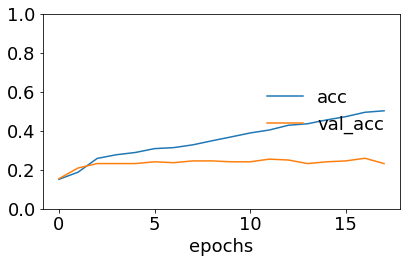

365/365 [==============================] - 0s 419us/sample - loss: 1.8055 - accuracy: 0.2411 - mae: 0.2053
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "model_41"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_83 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_84 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_78 (Embedding)        (None, 432, 300)     6372900     input_83[0][0]                   
__________________________________________________________________________________________________
layer_normalization_41 (LayerNo (None, 500)          1000        input_84[0][0]          

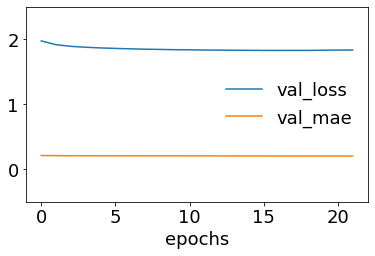

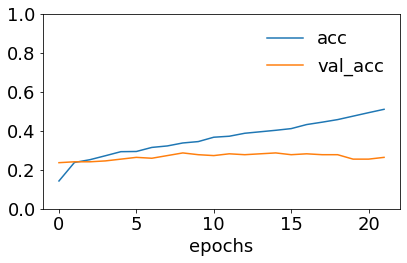

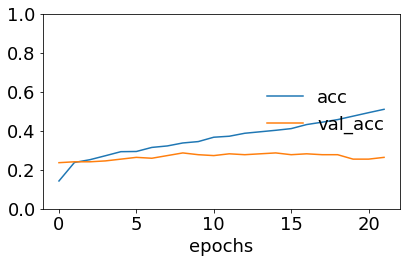

365/365 [==============================] - 0s 414us/sample - loss: 1.8138 - accuracy: 0.2658 - mae: 0.2046
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_42"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_85 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_86 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_78 (Embedding)        (None, 432, 300)     6372900     input_85[0][0]                   
__________________________________________________________________________________________________
layer_normalization_42 (LayerNo (None, 500)          1000        input_86[0][0]          

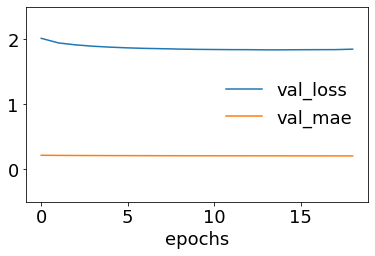

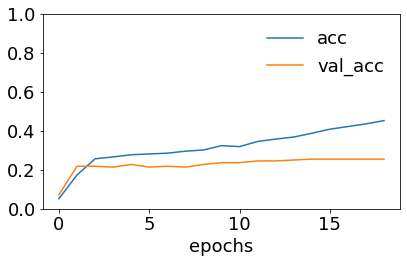

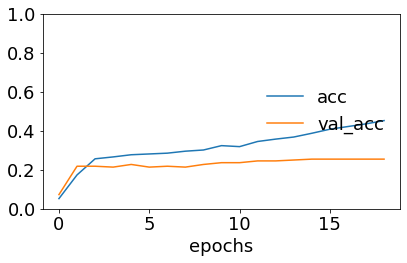

365/365 [==============================] - 0s 398us/sample - loss: 1.7973 - accuracy: 0.2658 - mae: 0.2051


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_tf_3 = lstm_tf(texts_tf3, data_3, embedding_matrix_3, num3)   # 80% data augmentation

Building Bi-LSTM model...
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    1    0    0    0
1      0    0    0    0    0    1    0
2      0    1    0    0    0    0    0
3      0    0    0    1    0    0    0
4      0    0    0    0    1    0    0
..   ...  ...  ...  ...  ...  ...  ...
401    0    0    1    0    0    0    0
402    0    0    0    0    1    0    0
403    0    0    1    0    0    0    0
404    0    0    0    1    0    0    0
405    0    0    1    0    0    0    0

[406 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_43"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_87 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_88 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_79 (Embedding)        (None, 432, 300)     6682500     input_87[0][0]                   
__________________________________________________________________________________________________
layer_normalization_43 (LayerNo (None, 500)          1000        input_88[0][0]          

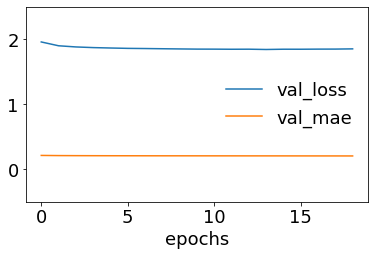

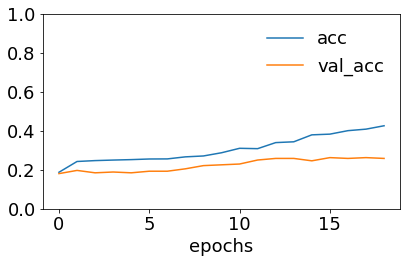

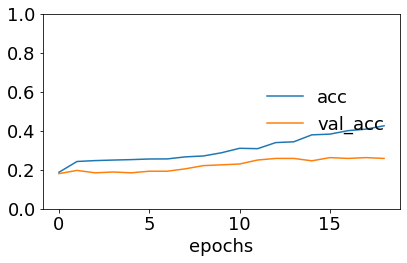

406/406 [==============================] - 1s 1ms/sample - loss: 1.7993 - accuracy: 0.2660 - mae: 0.2052
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "model_44"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_89 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_90 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_79 (Embedding)        (None, 432, 300)     6682500     input_89[0][0]                   
__________________________________________________________________________________________________
layer_normalization_44 (LayerNo (None, 500)          1000        input_90[0][0]          

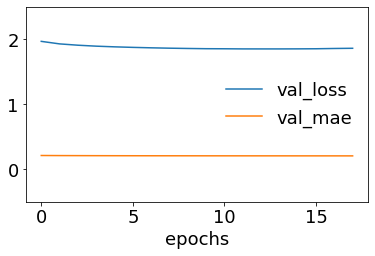

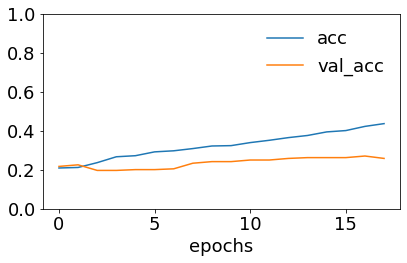

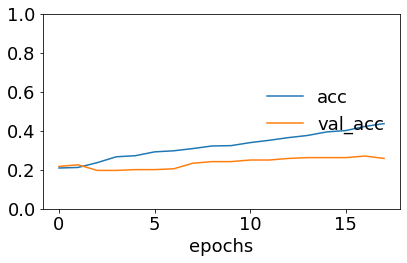

406/406 [==============================] - 0s 392us/sample - loss: 1.7885 - accuracy: 0.2660 - mae: 0.2044
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_45"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_91 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_92 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_79 (Embedding)        (None, 432, 300)     6682500     input_91[0][0]                   
__________________________________________________________________________________________________
layer_normalization_45 (LayerNo (None, 500)          1000        input_92[0][0]          

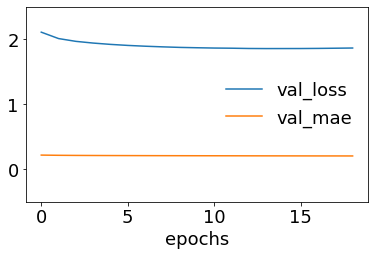

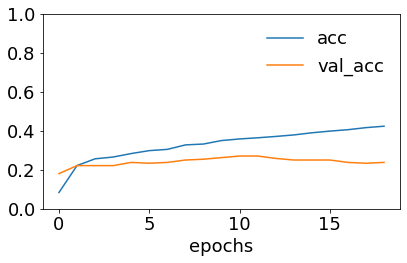

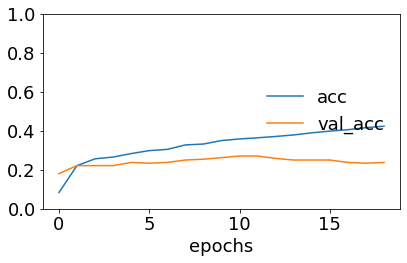

406/406 [==============================] - 0s 380us/sample - loss: 1.8148 - accuracy: 0.2537 - mae: 0.2054
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "model_46"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_93 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_94 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_79 (Embedding)        (None, 432, 300)     6682500     input_93[0][0]                   
__________________________________________________________________________________________________
layer_normalization_46 (LayerNo (None, 500)          1000        input_94[0][0]          

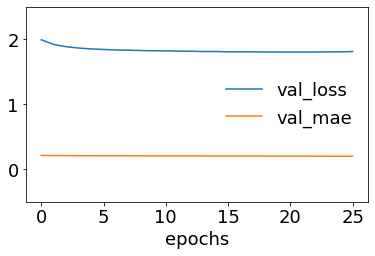

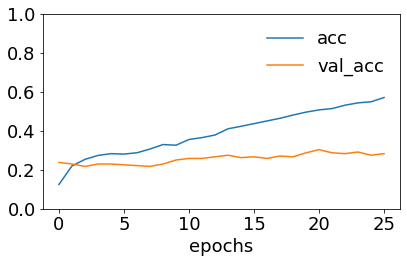

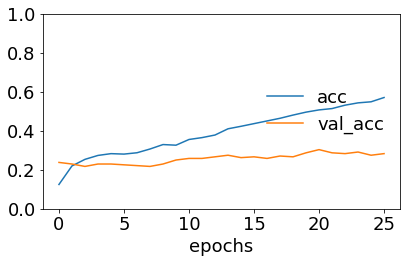

406/406 [==============================] - 0s 406us/sample - loss: 1.8342 - accuracy: 0.2414 - mae: 0.2040
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00026: early stopping
Model: "model_47"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_95 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_96 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_79 (Embedding)        (None, 432, 300)     6682500     input_95[0][0]                   
__________________________________________________________________________________________________
layer_normalization_47 (LayerNo (None, 500)          1000        input_96[0][0]          

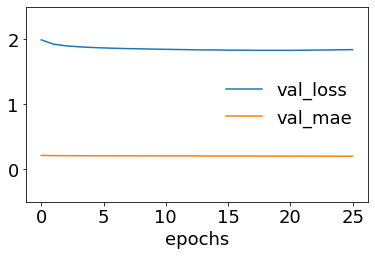

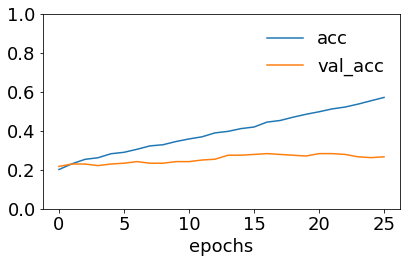

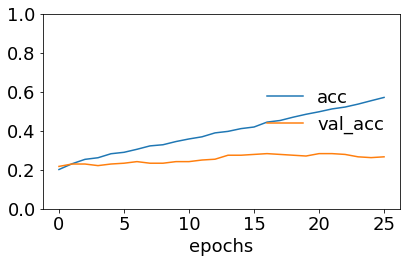

406/406 [==============================] - 0s 400us/sample - loss: 1.8021 - accuracy: 0.2537 - mae: 0.2022
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    1    0    0    0    0    0
1      0    1    0    0    0    0    0
2      0    0    0    0    1    0    0
3      0    1    0    0    0    0    0
4      0    0    0    0    0    1    0
..   ...  ...  ...  ...  ...  ...  ...
400    0    0    0    0    0    0    1
401    0    0    0    1    0    0    0
402    0    0    0    0    1    0    0
403    0    0    0    0    0    1    0
404    0    0    1    0    0    0    0

[405 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "model_48"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_97 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_98 (InputLayer)           [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_79 (Embedding)        (None, 432, 300)     6682500     input_97[0][0]                   
__________________________________________________________________________________________________
layer_normalization_48 (LayerNo (None, 500)          1000        input_98[0][0]          

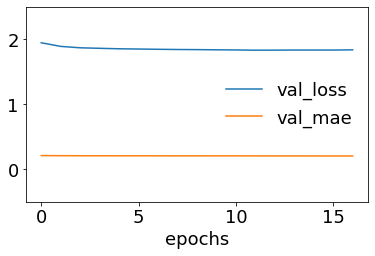

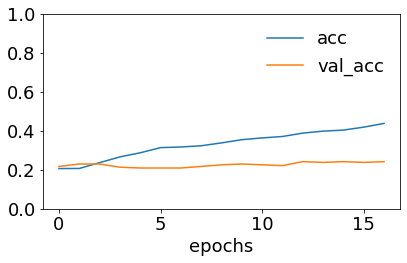

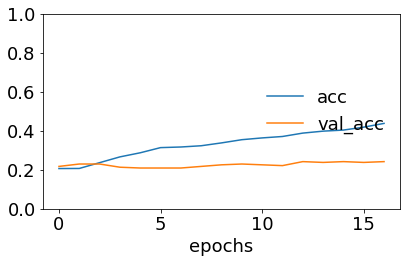

405/405 [==============================] - 1s 1ms/sample - loss: 1.7870 - accuracy: 0.2716 - mae: 0.2043
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    0    1    0
1      0    0    1    0    0    0    0
2      0    0    1    0    0    0    0
3      0    0    0    0    0    1    0
4      1    0    0    0    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
400    0    1    0    0    0    0    0
401    0    0    0    0    0    0    1
402    0    1    0    0    0    0    0
403    0    1    0    0    0    0    0
404    0    0    0    1    0    0    0

[405 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "model_49"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_99 (InputLayer)           [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_100 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_79 (Embedding)        (None, 432, 300)     6682500     input_99[0][0]                   
__________________________________________________________________________________________________
layer_normalization_49 (LayerNo (None, 500)          1000        input_100[0][0]         

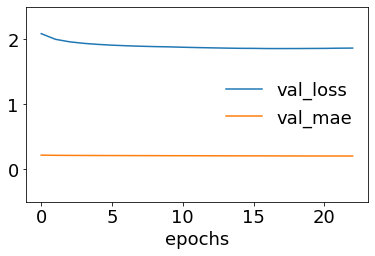

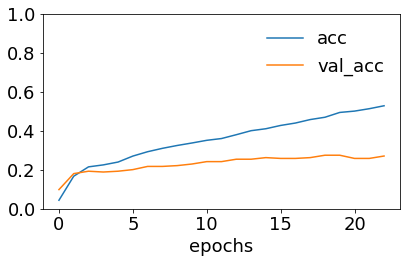

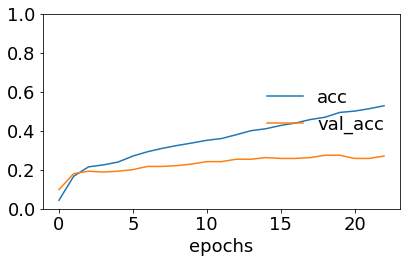

405/405 [==============================] - 1s 1ms/sample - loss: 1.7875 - accuracy: 0.2914 - mae: 0.2033


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_tf_4 = lstm_tf(texts_tf4, data_4, embedding_matrix_4, num4)  # 100% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00015: early stopping
Model: "model_50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_101 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_102 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_80 (Embedding)        (None, 432, 300)     6878400     input_101[0][0]                  
__________________________________________________________________________________________________
layer_normalization_50 (LayerNo (None, 500)          1000        input_102[0][0]         

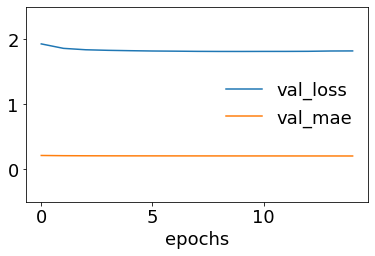

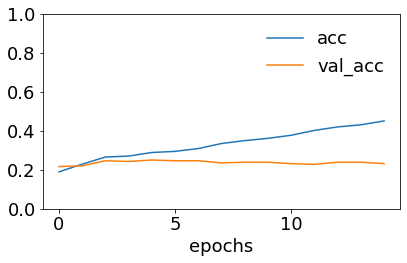

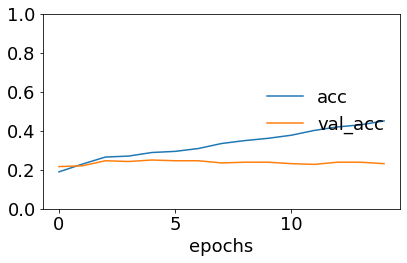

447/447 [==============================] - 0s 393us/sample - loss: 1.7964 - accuracy: 0.2707 - mae: 0.2044
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "model_51"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_103 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_104 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_80 (Embedding)        (None, 432, 300)     6878400     input_103[0][0]                  
__________________________________________________________________________________________________
layer_normalization_51 (LayerNo (None, 500)          1000        input_104[0][0]         

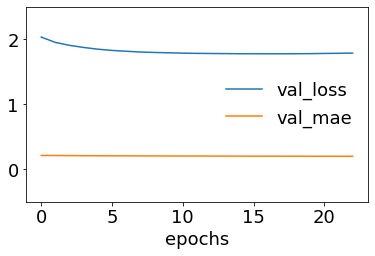

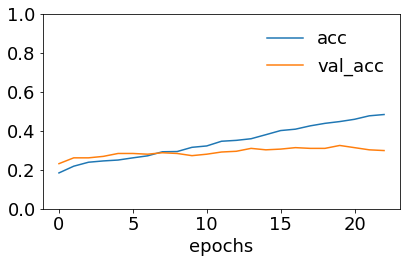

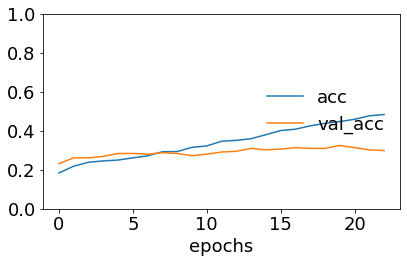

447/447 [==============================] - 0s 388us/sample - loss: 1.8234 - accuracy: 0.2819 - mae: 0.2031
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    1    0    0
1      0    0    0    0    1    0    0
2      0    1    0    0    0    0    0
3      0    0    0    0    1    0    0
4      0    0    1    0    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
441    0    0    0    1    0    0    0
442    0    1    0    0    0    0    0
443    0    0    1    0    0    0    0
444    0    0    0    1    0    0    0
445    0    0    1    0    0    0    0

[446 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00015: early stopping
Model: "model_52"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_105 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_106 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_80 (Embedding)        (None, 432, 300)     6878400     input_105[0][0]                  
__________________________________________________________________________________________________
layer_normalization_52 (LayerNo (None, 500)          1000        input_106[0][0]         

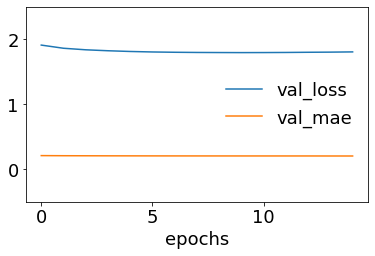

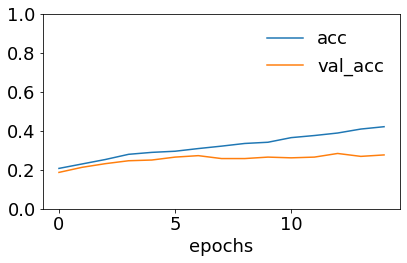

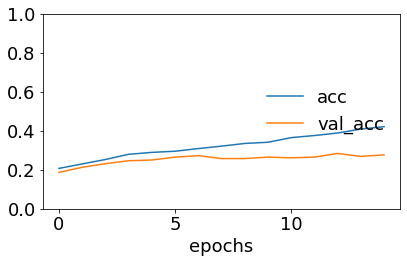

446/446 [==============================] - 1s 1ms/sample - loss: 1.8040 - accuracy: 0.2489 - mae: 0.2053
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    1    0    0
1      0    0    1    0    0    0    0
2      0    0    0    0    0    1    0
3      0    1    0    0    0    0    0
4      0    0    0    1    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
441    0    0    0    0    0    1    0
442    0    0    0    0    1    0    0
443    0    1    0    0    0    0    0
444    0    1    0    0    0    0    0
445    0    0    0    0    0    0    1

[446 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "model_53"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_107 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_108 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_80 (Embedding)        (None, 432, 300)     6878400     input_107[0][0]                  
__________________________________________________________________________________________________
layer_normalization_53 (LayerNo (None, 500)          1000        input_108[0][0]         

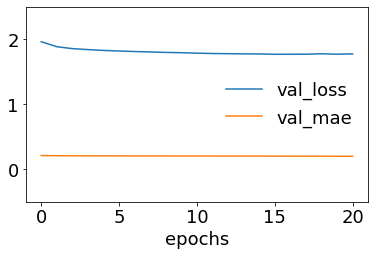

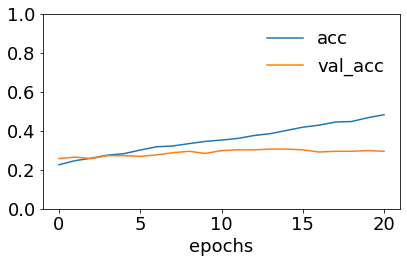

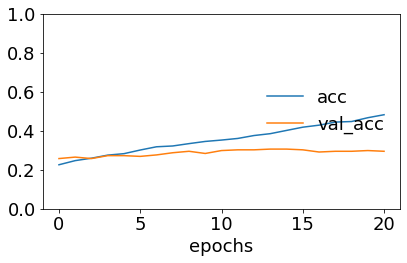

446/446 [==============================] - 1s 1ms/sample - loss: 1.7994 - accuracy: 0.2489 - mae: 0.2038
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "model_54"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_109 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_110 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_80 (Embedding)        (None, 432, 300)     6878400     input_109[0][0]                  
__________________________________________________________________________________________________
layer_normalization_54 (LayerNo (None, 500)          1000        input_110[0][0]         

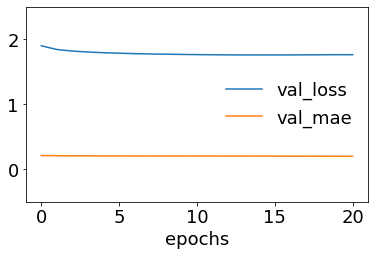

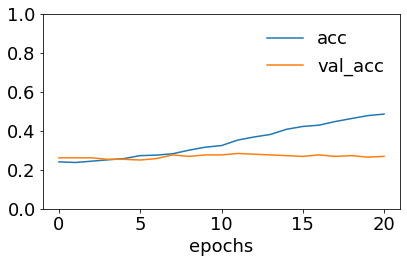

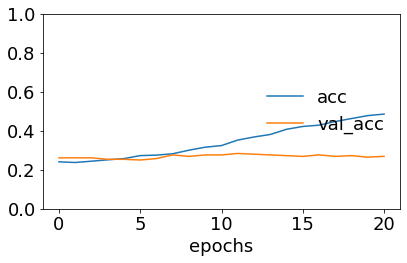

446/446 [==============================] - 0s 385us/sample - loss: 1.8002 - accuracy: 0.2646 - mae: 0.2038
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00024: early stopping
Model: "model_55"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_111 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_112 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_80 (Embedding)        (None, 432, 300)     6878400     input_111[0][0]                  
__________________________________________________________________________________________________
layer_normalization_55 (LayerNo (None, 500)          1000        input_112[0][0]         

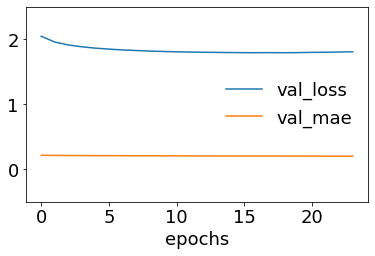

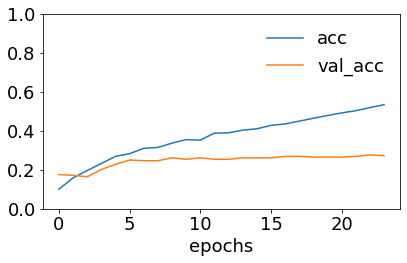

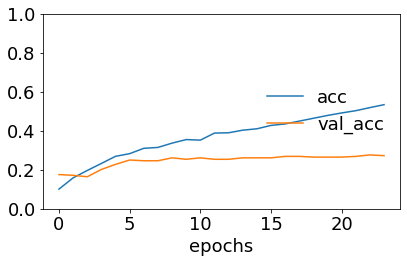

446/446 [==============================] - 0s 406us/sample - loss: 1.7887 - accuracy: 0.2422 - mae: 0.2032
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "model_56"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_113 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_114 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_80 (Embedding)        (None, 432, 300)     6878400     input_113[0][0]                  
__________________________________________________________________________________________________
layer_normalization_56 (LayerNo (None, 500)          1000        input_114[0][0]         

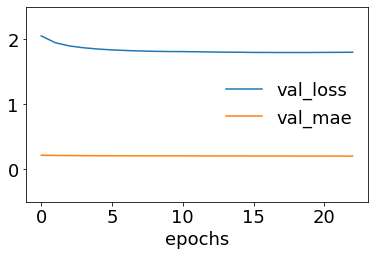

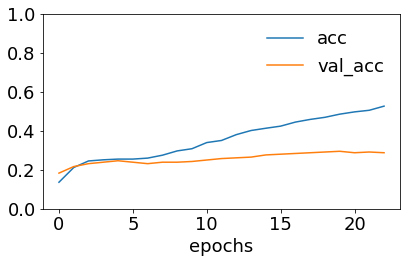

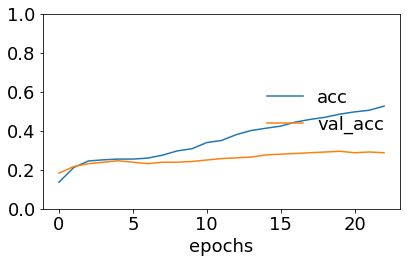

446/446 [==============================] - 0s 390us/sample - loss: 1.7893 - accuracy: 0.2691 - mae: 0.2037


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_tf_5 = lstm_tf(texts_tf5, data_5, embedding_matrix_5, num5)  # 120% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "model_57"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_115 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_116 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_81 (Embedding)        (None, 432, 300)     7125000     input_115[0][0]                  
__________________________________________________________________________________________________
layer_normalization_57 (LayerNo (None, 500)          1000        input_116[0][0]         

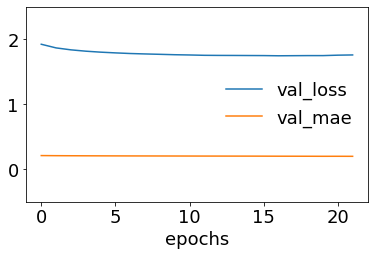

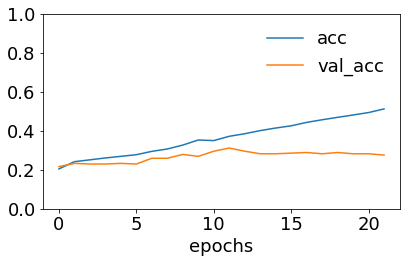

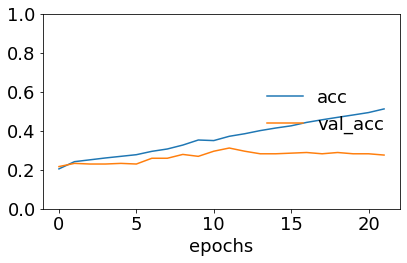

508/508 [==============================] - 0s 397us/sample - loss: 1.7844 - accuracy: 0.2520 - mae: 0.2026
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    1    0    0    0
1      0    0    1    0    0    0    0
2      0    0    0    0    0    0    1
3      0    1    0    0    0    0    0
4      0    0    0    0    0    0    1
..   ...  ...  ...  ...  ...  ...  ...
502    0    0    0    0    0    1    0
503    0    0    0    1    0    0    0
504    1    0    0    0    0    0    0
505    0    0    0    0    1    0    0
506    0    0    0    0    1    0    0

[507 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00025: early stopping
Model: "model_58"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_117 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_118 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_81 (Embedding)        (None, 432, 300)     7125000     input_117[0][0]                  
__________________________________________________________________________________________________
layer_normalization_58 (LayerNo (None, 500)          1000        input_118[0][0]         

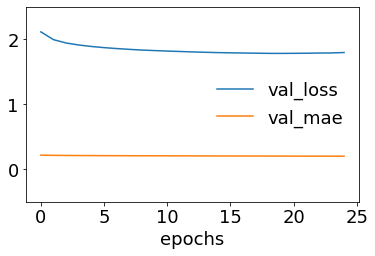

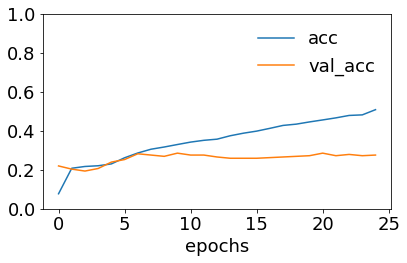

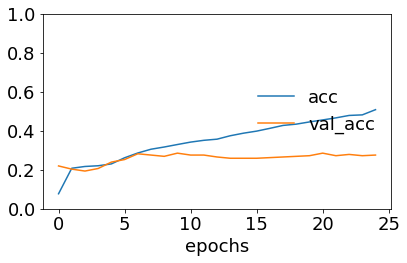

507/507 [==============================] - 1s 1ms/sample - loss: 1.8052 - accuracy: 0.2446 - mae: 0.2038
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    1    0    0    0    0
1      0    0    0    0    0    0    1
2      0    0    0    0    0    1    0
3      0    0    1    0    0    0    0
4      0    0    0    0    1    0    0
..   ...  ...  ...  ...  ...  ...  ...
502    0    0    0    0    0    1    0
503    0    1    0    0    0    0    0
504    0    0    0    0    1    0    0
505    0    0    1    0    0    0    0
506    0    0    0    0    0    1    0

[507 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "model_59"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_119 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_120 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_81 (Embedding)        (None, 432, 300)     7125000     input_119[0][0]                  
__________________________________________________________________________________________________
layer_normalization_59 (LayerNo (None, 500)          1000        input_120[0][0]         

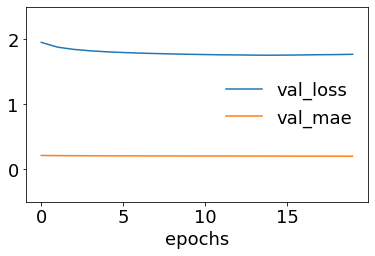

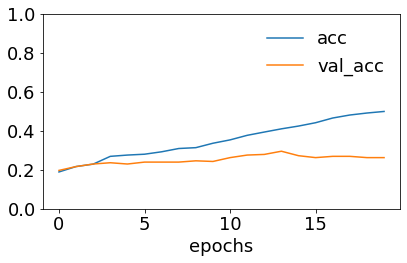

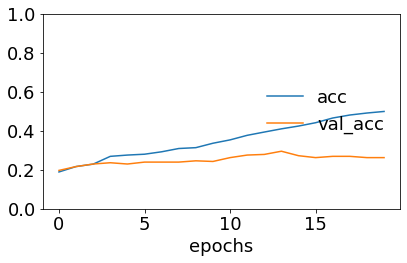

507/507 [==============================] - 1s 1ms/sample - loss: 1.7827 - accuracy: 0.2643 - mae: 0.2040
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_60"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_121 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_122 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_81 (Embedding)        (None, 432, 300)     7125000     input_121[0][0]                  
__________________________________________________________________________________________________
layer_normalization_60 (LayerNo (None, 500)          1000        input_122[0][0]         

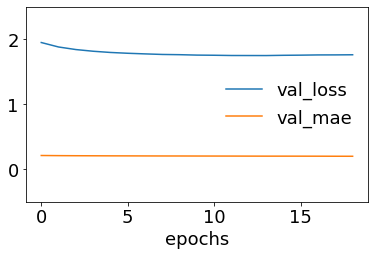

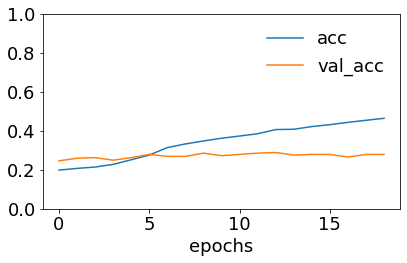

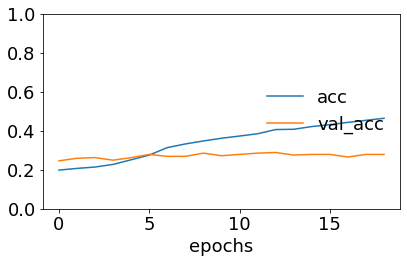

507/507 [==============================] - 0s 407us/sample - loss: 1.7999 - accuracy: 0.2446 - mae: 0.2040
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "model_61"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_123 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_124 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_81 (Embedding)        (None, 432, 300)     7125000     input_123[0][0]                  
__________________________________________________________________________________________________
layer_normalization_61 (LayerNo (None, 500)          1000        input_124[0][0]         

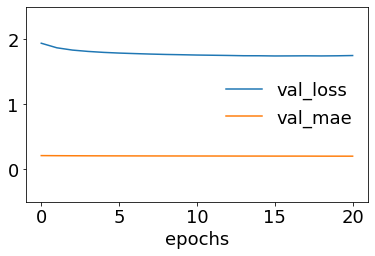

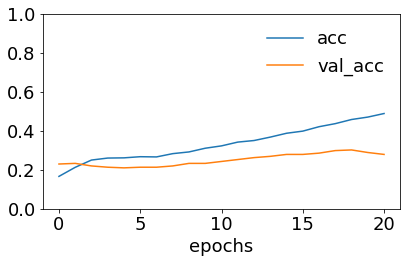

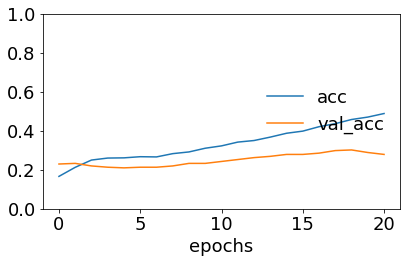

507/507 [==============================] - 0s 390us/sample - loss: 1.7837 - accuracy: 0.2722 - mae: 0.2034
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_62"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_125 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_126 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_81 (Embedding)        (None, 432, 300)     7125000     input_125[0][0]                  
__________________________________________________________________________________________________
layer_normalization_62 (LayerNo (None, 500)          1000        input_126[0][0]         

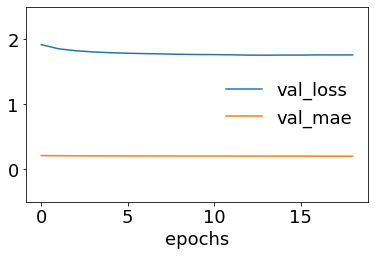

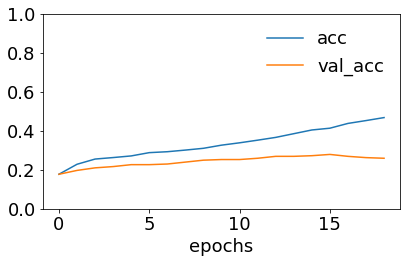

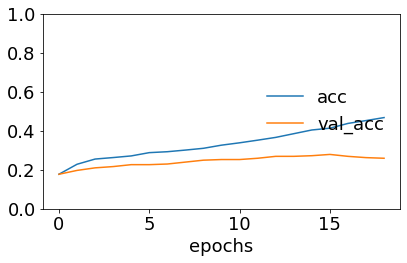

507/507 [==============================] - 0s 378us/sample - loss: 1.7566 - accuracy: 0.2860 - mae: 0.2019
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00023: early stopping
Model: "model_63"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_127 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_128 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_81 (Embedding)        (None, 432, 300)     7125000     input_127[0][0]                  
__________________________________________________________________________________________________
layer_normalization_63 (LayerNo (None, 500)          1000        input_128[0][0]         

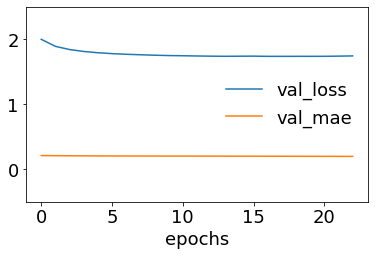

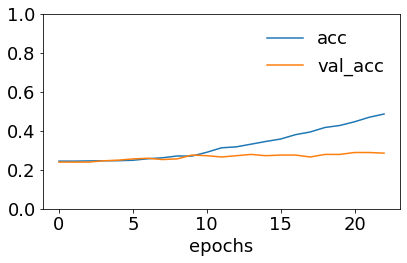

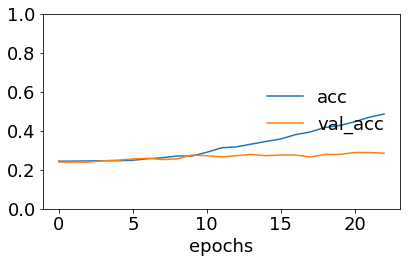

507/507 [==============================] - 0s 389us/sample - loss: 1.7905 - accuracy: 0.2643 - mae: 0.2024


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_tf_6 = lstm_tf(texts_tf6, data_6, embedding_matrix_6, num6)  # 150% data augmentation

Building Bi-LSTM model...
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    1    0    0    0
1      0    0    0    1    0    0    0
2      0    0    1    0    0    0    0
3      0    0    0    0    1    0    0
4      0    0    1    0    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
563    0    1    0    0    0    0    0
564    0    0    0    0    1    0    0
565    0    0    1    0    0    0    0
566    0    0    1    0    0    0    0
567    0    0    0    1    0    0    0

[568 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_67"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_135 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_136 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_83 (Embedding)        (None, 432, 300)     7303800     input_135[0][0]                  
__________________________________________________________________________________________________
layer_normalization_67 (LayerNo (None, 500)          1000        input_136[0][0]         

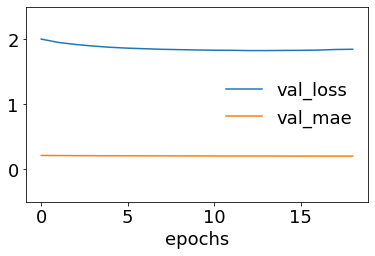

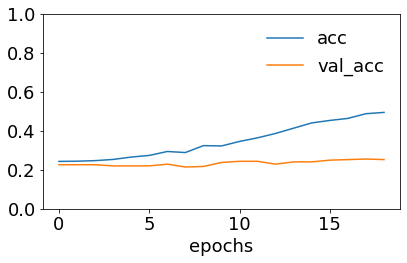

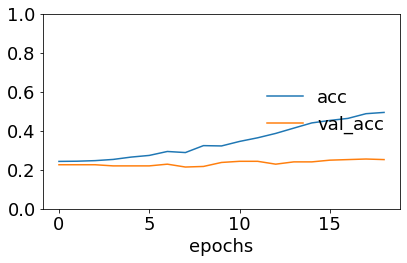

568/568 [==============================] - 1s 1ms/sample - loss: 1.7774 - accuracy: 0.2958 - mae: 0.2025
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_68"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_137 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_138 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_83 (Embedding)        (None, 432, 300)     7303800     input_137[0][0]                  
__________________________________________________________________________________________________
layer_normalization_68 (LayerNo (None, 500)          1000        input_138[0][0]         

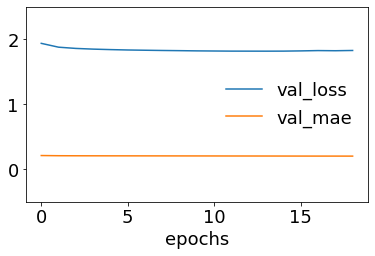

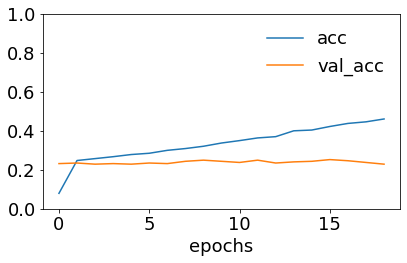

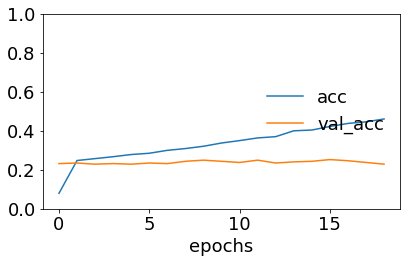

568/568 [==============================] - 0s 402us/sample - loss: 1.7984 - accuracy: 0.2746 - mae: 0.2036
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00016: early stopping
Model: "model_69"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_139 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_140 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_83 (Embedding)        (None, 432, 300)     7303800     input_139[0][0]                  
__________________________________________________________________________________________________
layer_normalization_69 (LayerNo (None, 500)          1000        input_140[0][0]         

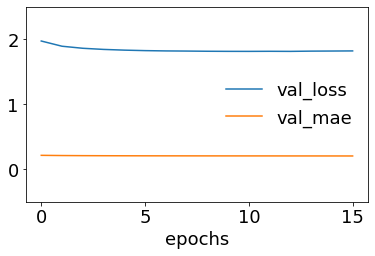

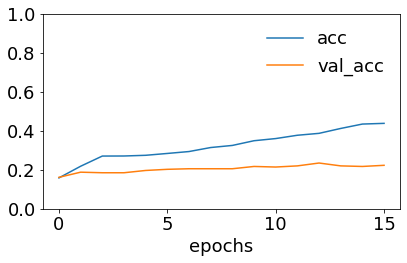

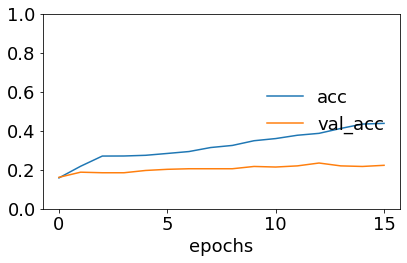

568/568 [==============================] - 0s 392us/sample - loss: 1.7998 - accuracy: 0.2606 - mae: 0.2050
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00020: early stopping
Model: "model_70"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_141 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_142 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_83 (Embedding)        (None, 432, 300)     7303800     input_141[0][0]                  
__________________________________________________________________________________________________
layer_normalization_70 (LayerNo (None, 500)          1000        input_142[0][0]         

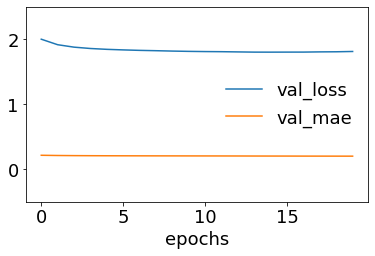

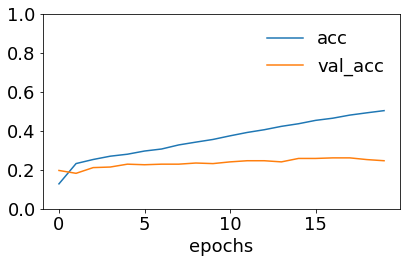

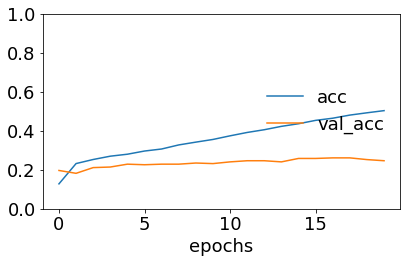

568/568 [==============================] - 0s 386us/sample - loss: 1.7699 - accuracy: 0.2782 - mae: 0.2022
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00022: early stopping
Model: "model_71"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_143 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_144 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_83 (Embedding)        (None, 432, 300)     7303800     input_143[0][0]                  
__________________________________________________________________________________________________
layer_normalization_71 (LayerNo (None, 500)          1000        input_144[0][0]         

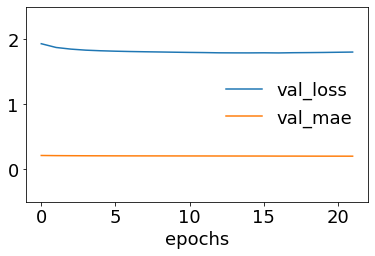

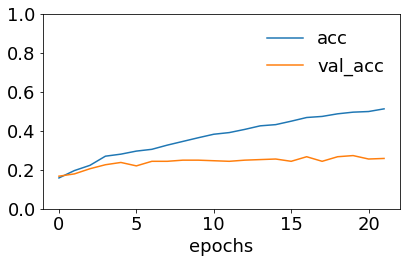

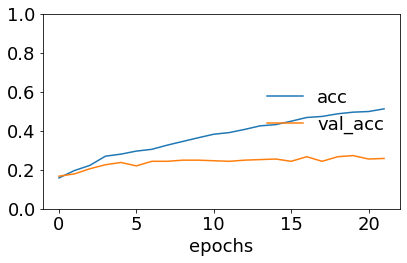

568/568 [==============================] - 0s 386us/sample - loss: 1.7441 - accuracy: 0.2817 - mae: 0.2004
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00025: early stopping
Model: "model_72"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_145 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_146 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_83 (Embedding)        (None, 432, 300)     7303800     input_145[0][0]                  
__________________________________________________________________________________________________
layer_normalization_72 (LayerNo (None, 500)          1000        input_146[0][0]         

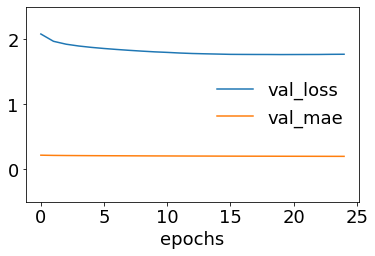

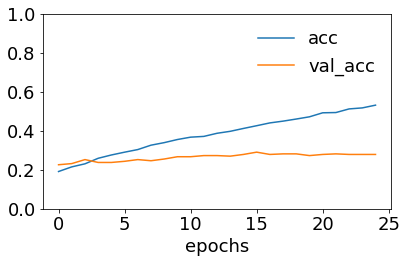

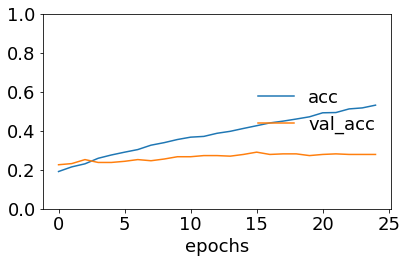

568/568 [==============================] - 0s 403us/sample - loss: 1.7684 - accuracy: 0.2852 - mae: 0.1998
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00015: early stopping
Model: "model_73"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_147 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_148 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_83 (Embedding)        (None, 432, 300)     7303800     input_147[0][0]                  
__________________________________________________________________________________________________
layer_normalization_73 (LayerNo (None, 500)          1000        input_148[0][0]         

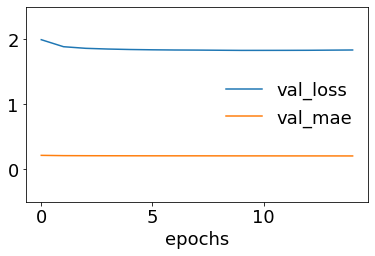

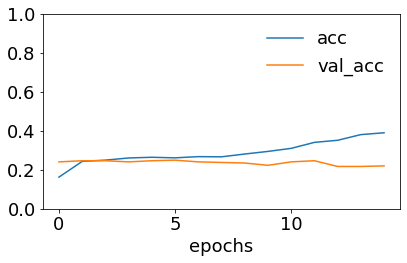

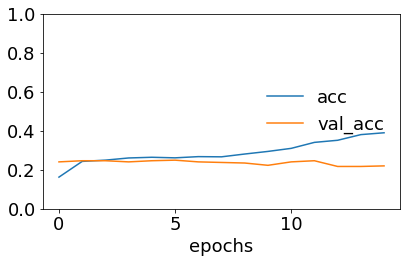

568/568 [==============================] - 0s 398us/sample - loss: 1.8120 - accuracy: 0.2465 - mae: 0.2059


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_tf_7 = lstm_tf(texts_tf7, data_7, embedding_matrix_7, num7)  # 180% data augmentation

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Training model...
Restoring model weights from the end of the best epoch
Epoch 00019: early stopping
Model: "model_74"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_149 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_150 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_84 (Embedding)        (None, 432, 300)     6690900     input_149[0][0]                  
__________________________________________________________________________________________________
layer_normalization_74 (LayerNo (None, 500)          1000        input_150[0][0]         

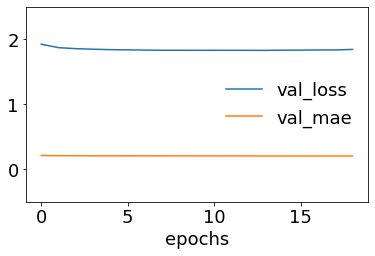

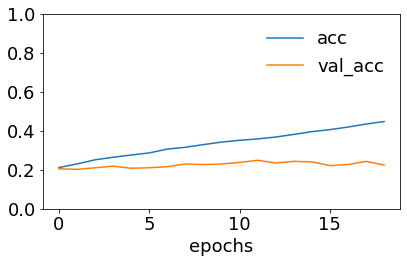

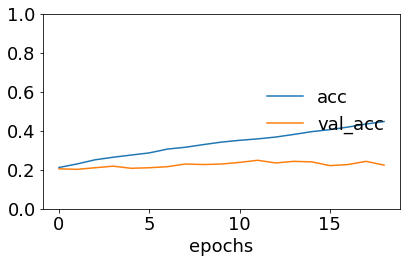

609/609 [==============================] - 0s 405us/sample - loss: 1.7956 - accuracy: 0.2709 - mae: 0.2033
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00015: early stopping
Model: "model_75"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_151 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_152 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_84 (Embedding)        (None, 432, 300)     6690900     input_151[0][0]                  
__________________________________________________________________________________________________
layer_normalization_75 (LayerNo (None, 500)          1000        input_152[0][0]         

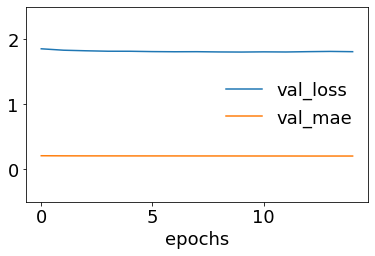

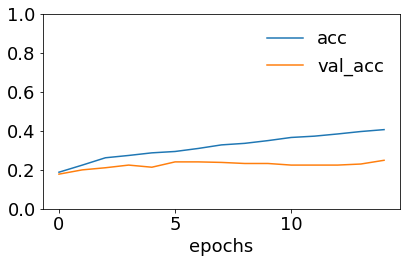

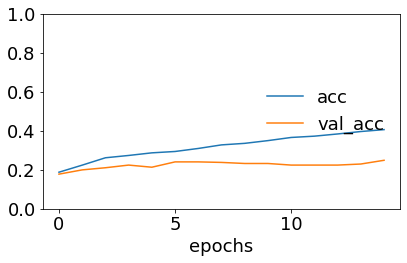

609/609 [==============================] - 0s 398us/sample - loss: 1.7875 - accuracy: 0.2742 - mae: 0.2036
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00021: early stopping
Model: "model_76"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_153 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_154 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_84 (Embedding)        (None, 432, 300)     6690900     input_153[0][0]                  
__________________________________________________________________________________________________
layer_normalization_76 (LayerNo (None, 500)          1000        input_154[0][0]         

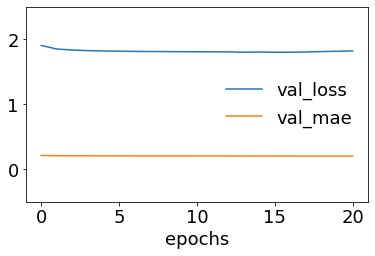

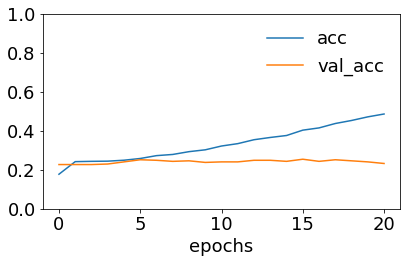

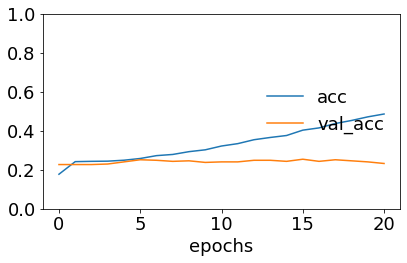

609/609 [==============================] - 0s 397us/sample - loss: 1.7947 - accuracy: 0.2496 - mae: 0.2042
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00017: early stopping
Model: "model_77"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_155 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_156 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_84 (Embedding)        (None, 432, 300)     6690900     input_155[0][0]                  
__________________________________________________________________________________________________
layer_normalization_77 (LayerNo (None, 500)          1000        input_156[0][0]         

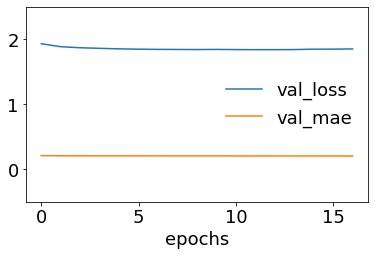

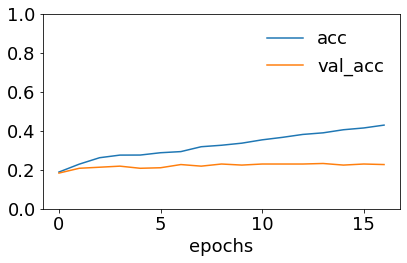

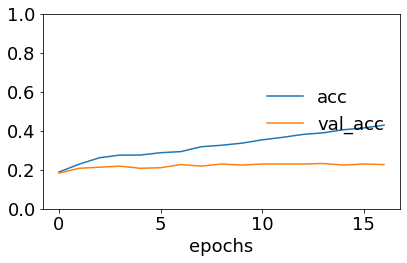

609/609 [==============================] - 0s 445us/sample - loss: 1.7898 - accuracy: 0.2578 - mae: 0.2035
9.0
     2.0  3.0  4.0  5.0  6.0  7.0  8.0
0      0    0    0    0    0    0    1
1      0    1    0    0    0    0    0
2      0    0    0    0    1    0    0
3      0    1    0    0    0    0    0
4      0    1    0    0    0    0    0
..   ...  ...  ...  ...  ...  ...  ...
603    0    0    1    0    0    0    0
604    0    0    1    0    0    0    0
605    0    0    1    0    0    0    0
606    0    0    0    1    0    0    0
607    0    0    0    0    1    0    0

[608 rows x 7 columns]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "model_78"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_157 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_158 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_84 (Embedding)        (None, 432, 300)     6690900     input_157[0][0]                  
__________________________________________________________________________________________________
layer_normalization_78 (LayerNo (None, 500)          1000        input_158[0][0]         

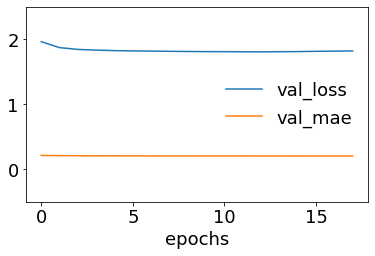

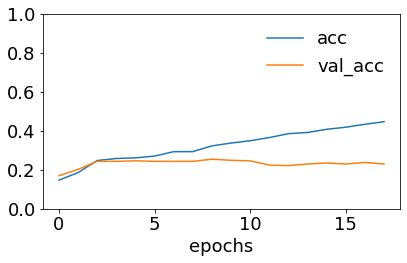

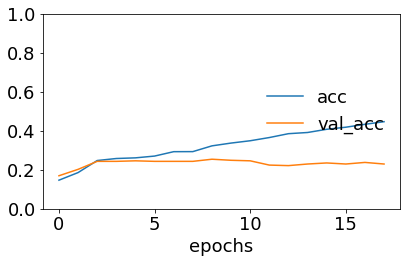

608/608 [==============================] - 1s 1ms/sample - loss: 1.8017 - accuracy: 0.2319 - mae: 0.2045
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "model_79"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_159 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_160 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_84 (Embedding)        (None, 432, 300)     6690900     input_159[0][0]                  
__________________________________________________________________________________________________
layer_normalization_79 (LayerNo (None, 500)          1000        input_160[0][0]         

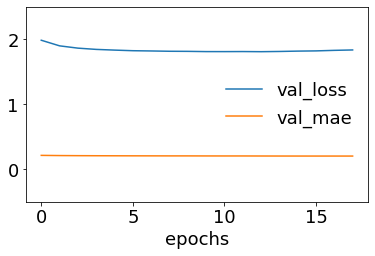

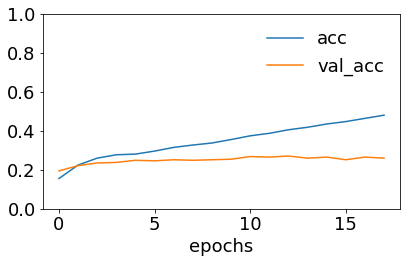

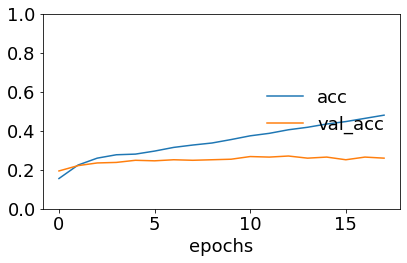

608/608 [==============================] - 1s 1ms/sample - loss: 1.8100 - accuracy: 0.2418 - mae: 0.2045
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Restoring model weights from the end of the best epoch
Epoch 00018: early stopping
Model: "model_80"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_161 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
input_162 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
embedding_84 (Embedding)        (None, 432, 300)     6690900     input_161[0][0]                  
__________________________________________________________________________________________________
layer_normalization_80 (LayerNo (None, 500)          1000        input_162[0][0]         

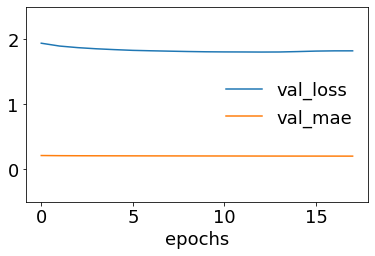

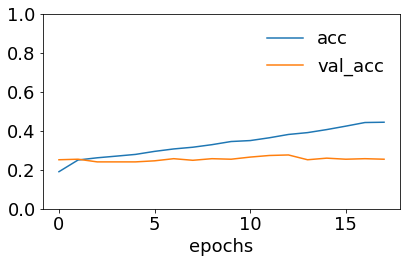

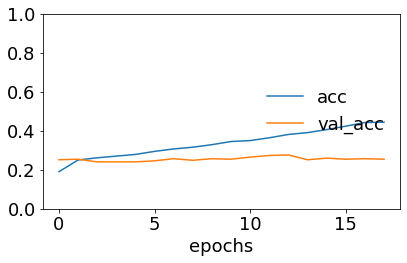

608/608 [==============================] - 1s 1ms/sample - loss: 1.7912 - accuracy: 0.2500 - mae: 0.2036


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
scores_lstm_tf_8 = lstm_tf(texts_tf8, data_8, embedding_matrix_8, num8)  # 200% data augmentation

In [0]:
scores_lstm_7

,accuracy,precision,recall,f1,cohen_kappa_score,auc
0,0.323944,0.304547,0.323944,0.287531,0.144266,0.646915
1,0.230634,0.204682,0.230634,0.176741,0.036301,0.591895
2,0.322183,0.303698,0.322183,0.286800,0.144063,0.640227
3,0.258803,0.200977,0.258803,0.186962,0.055815,0.570304
4,0.332746,0.269326,0.332746,0.253619,0.142889,0.631214
5,0.286972,0.237573,0.286972,0.250406,0.101041,0.622178
6,0.341549,0.334881,0.341549,0.290208,0.163423,0.647426


In [0]:
print('20% augmentation')
print(scores_lstm_tf_1.mean())
print('\n50% augmentation')
print(scores_lstm_tf_2.mean())
print('\n80% augmentation')
print(scores_lstm_tf_3.mean())
print('\n100% augmentation')
print(scores_lstm_tf_4.mean())
print('\n120% augmentation')
print(scores_lstm_tf_5.mean())
print('\n150% augmentation')
print(scores_lstm_tf_6.mean())
print('\n180% augmentation')
print(scores_lstm_tf_7.mean())
print('\n200% augmentation')
print(scores_lstm_tf_8.mean())

20% augmentation
accuracy             0.284613
precision            0.242425
recall               0.284613
f1                   0.229892
cohen_kappa_score    0.084777
auc                  0.570504
dtype: float64

50% augmentation
accuracy             0.273720
precision            0.211721
recall               0.273720
f1                   0.221021
cohen_kappa_score    0.069963
auc                  0.572359
dtype: float64

80% augmentation
accuracy             0.262120
precision            0.207929
recall               0.262120
f1                   0.200427
cohen_kappa_score    0.055155
auc                  0.562583
dtype: float64

100% augmentation
accuracy             0.263393
precision            0.222945
recall               0.263393
f1                   0.198158
cohen_kappa_score    0.056233
auc                  0.555248
dtype: float64

120% augmentation
accuracy             0.260874
precision            0.191900
recall               0.260874
f1                   0.193759
cohen_kap

#### 1D CNN + LSTM +TF-IDF

In [0]:
def lstm_cnn_tf(texts_tf, data_cleaned, embedding_matrix, num_words):
  # some configuration
  VALIDATION_SPLIT = 0.1   
  BATCH_SIZE = 32   # number of training samples to work through
  EPOCHS = 200   # number of complete passes through the training dataset
  LEARNING_RATE = 0.0002
  N_SPLITS = 7


  print('Building Bi-LSTM model...')
  kfold = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state = 9)
  scores_lstm_cnn_tf = pd.DataFrame(columns = ['accuracy','precision', 'recall', 'f1', 'cohen_kappa_score','auc'])
  labels = data_cleaned['positivity'].values
  METRICS = ['accuracy', 'mae']

  embedding_layer = tf.keras.layers.Embedding(
    num_words,
    EMBEDDING_DIM,
    weights=[embedding_matrix],
    input_length=MAX_SEQUENCE_LENGTH,
    trainable=True
  )


  for train, test in kfold.split(texts_tf, labels):
  
    x_train = texts_tf[train]
    x_test = texts_tf[test]
    x_train_1 = x_train[:, : MAX_SEQUENCE_LENGTH] # training set for word embeddings using GloVe
    x_train_2 = x_train[:, MAX_SEQUENCE_LENGTH:] # training set for tfidf feature
    x_test_1 = x_test[:, :MAX_SEQUENCE_LENGTH] # testing set for word embedding using GloVe
    x_test_2 = x_test[:, MAX_SEQUENCE_LENGTH:] # testing set for tfidf feature

  # transfer multi-class to binary classes
    y_train = pd.get_dummies(labels[train])
    y_test = pd.get_dummies(labels[test])
  
  # using list of zeros to represents missing classes
    m = sum(y_train.columns)-sum(y_test.columns)
    print(m)    
    if m > 0:
      n = int(m)-2
      y_test.insert(n, m, 0)
    elif m < 0:
      n = abs(int(m))-2
      y_train.insert(n, abs(m), 0)

    input_1 = tf.keras.Input(shape=(MAX_SEQUENCE_LENGTH,)) # input layer for LSTM
    x = embedding_layer(input_1)
    x = tf.keras.layers.Conv1D(filters = EMBEDDING_DIM, kernel_size = 3, padding='valid', activation='relu')(x)
    x = tf.keras.layers.LSTM(32)(x)   # LSTM layer on embedding layer

    input_2 = tf.keras.Input(shape=(500,))  # input layer for TF-IDF vector
    tf_vec = tf.keras.layers.LayerNormalization()(input_2)  # TF-IDF layer
    tf_vec = tf.keras.layers.Dense(32, activation = 'relu')(tf_vec)
    concat_layer = tf.keras.layers.Concatenate()([x, tf_vec])  # concatenate LSTM and TF-IDF layer

    dense_layer = tf.keras.layers.Dense(16, activation='sigmoid')(concat_layer)
    output = tf.keras.layers.Dense(8, activation='softmax')(dense_layer)
    
    model = tf.keras.models.Model([input_1, input_2], output)
    model.summary()
    
    model.compile(
      loss = 'categorical_crossentropy',
      optimizer = tf.keras.optimizers.Adam(learning_rate = LEARNING_RATE),
      metrics = METRICS,
    
    )


  # Training model:
    es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5, restore_best_weights=True)  # early stopping to avoid overfitting
  #  mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=0, save_best_only=True)


    print('Training model...')
    r = model.fit(
      [x_train_1, x_train_2],
      y_train,
      batch_size = BATCH_SIZE,
      epochs = EPOCHS,
      validation_split = VALIDATION_SPLIT,
      verbose = 0,
      callbacks=[es]
    )


    model.summary()

  # plot loss and mae
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    fig = plt.figure()
    ax = fig.add_subplot()
    lns1 = ax.plot(r.history['val_loss'], label='val_loss', color = 'tab:blue')
    ax2 = ax.twinx()
    lns2 = ax2.plot(r.history['val_mae'], label='val_mae', color = 'tab:red')

    lns = lns1+lns2
    labs = [l.get_label() for l in lns]
    ax.legend(lns, labs, loc='upper right', frameon=False)
    ax.set_ylim(1.5,2)
    ax.tick_params(axis='y', labelcolor='tab:blue')        
    ax2.set_ylim(0.17, 0.22)
    ax2.tick_params(axis='y', labelcolor='tab:red')     
    plt.show()

  # plot loss
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['val_loss'], label='val_loss')
    plt.plot(r.history['val_mae'], label='val_mae')
    plt.xlabel('epochs') 
    plt.ylim(-0.5, 2.5)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()

  # plot accuracy
    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'upper right')
    plt.show()

    figure(figsize=(6, 4))
    plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
    plt.plot(r.history['accuracy'], label='acc')
    plt.plot(r.history['val_accuracy'], label='val_acc')
    plt.xlabel('epochs') 
    plt.ylim(0, 1)       
    plt.legend(frameon=False, loc = 'center right')
    plt.show()

  # predict on testing set
    predictions_cnn_lstm_tf = model.predict([x_test_1, x_test_2])
    #scores = model.evaluate(x = [x_test_1, x_test_2], y=y_test)   
    y_test = y_test.to_numpy()

  # confusion matrix
    cnf_matrix = confusion_matrix(y_test.argmax(axis=1), predictions_cnn_lstm_tf.argmax(axis=1))
    report = metrics.classification_report(y_test.argmax(axis=1), predictions_cnn_lstm_tf.argmax(axis=1), output_dict=True)
    df = pd.DataFrame(report)
    ck = cohen_kappa_score(y_test.argmax(axis=1), predictions_cnn_lstm_tf.argmax(axis=1))
    print(report)

  # auc
    y_true = pd.get_dummies(labels[test])
    y_true = y_true.to_numpy()
    
    if m <= 0:
      y_pred = predictions_cnn_lstm_tf
    else:
      y_pred = np.delete(predictions_cnn_lstm_tf, n, 1)
    
    auc = roc_auc_score(y_true, y_pred, multi_class='ovo', average='weighted')

    scores_lstm_cnn_tf = scores_lstm_cnn_tf.append({'accuracy': df['accuracy'][0], 'precision': df['weighted avg'][0], 
                                            'recall': df['weighted avg'][1], 'f1': df['weighted avg'][2], 
                                            'cohen_kappa_score': ck, 'auc': auc },  ignore_index=True)
  return scores_lstm_cnn_tf, r

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model_81"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_163 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_85 (Embedding)        (None, 432, 300)     4872000     input_163[0][0]                  
__________________________________________________________________________________________________
input_164 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 430, 300)     270300      embedding_85[0][0]               
___________________________________________________________________________________________

<Figure size 432x288 with 0 Axes>

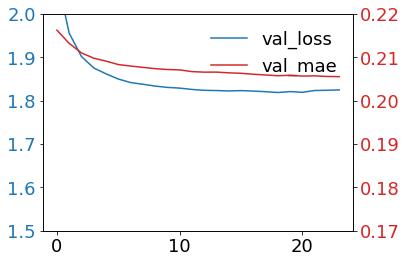

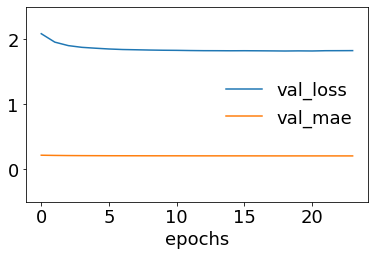

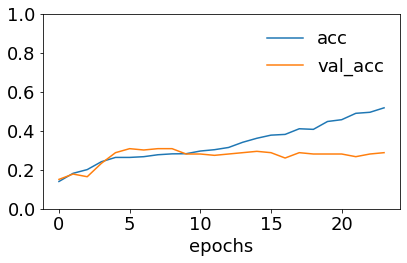

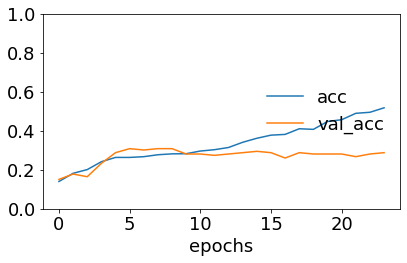

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 5}, '1': {'precision': 0.28488372093023256, 'recall': 0.8166666666666667, 'f1-score': 0.4224137931034483, 'support': 60}, '2': {'precision': 0.05263157894736842, 'recall': 0.022727272727272728, 'f1-score': 0.031746031746031744, 'support': 44}, '3': {'precision': 0.1875, 'recall': 0.08823529411764706, 'f1-score': 0.12, 'support': 34}, '4': {'precision': 0.25, 'recall': 0.10810810810810811, 'f1-score': 0.1509433962264151, 'support': 37}, '5': {'precision': 0.3333333333333333, 'recall': 0.14, 'f1-score': 0.1971830985915493, 'support': 50}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 13}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.26229508196721313, 'macro avg': {'precision': 0.13854357915136678, 'recall': 0.14696716770246182, 'f1-score': 0.11528578995843056, 'support': 244}, 'weighted avg': {'precision': 0.2118872106400198, 'recall': 0.26229508196721313, 'f1

<Figure size 432x288 with 0 Axes>

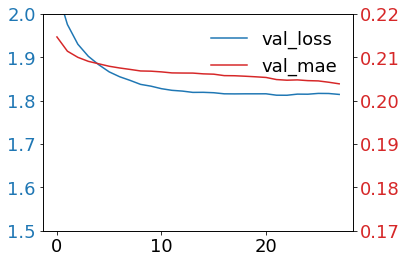

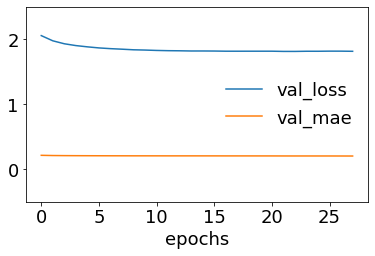

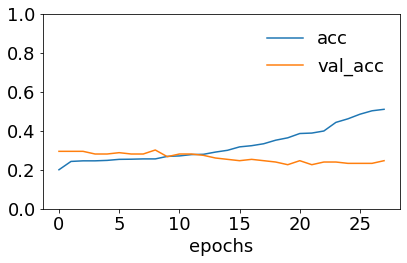

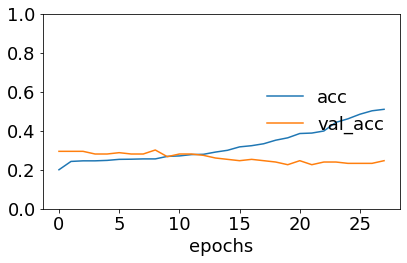

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6}, '1': {'precision': 0.2603550295857988, 'recall': 0.7333333333333333, 'f1-score': 0.38427947598253276, 'support': 60}, '2': {'precision': 0.19148936170212766, 'recall': 0.20454545454545456, 'f1-score': 0.19780219780219782, 'support': 44}, '3': {'precision': 0.4, 'recall': 0.058823529411764705, 'f1-score': 0.10256410256410256, 'support': 34}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 36}, '5': {'precision': 0.4090909090909091, 'recall': 0.17647058823529413, 'f1-score': 0.24657534246575347, 'support': 51}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.26229508196721313, 'macro avg': {'precision': 0.15761691254735447, 'recall': 0.14664661319073083, 'f1-score': 0.11640263985182334, 'support': 244}, 'weighted avg': {'precision': 0.23979700841671273, 'recall': 0.26229508196721313, 'f1-sco

<Figure size 432x288 with 0 Axes>

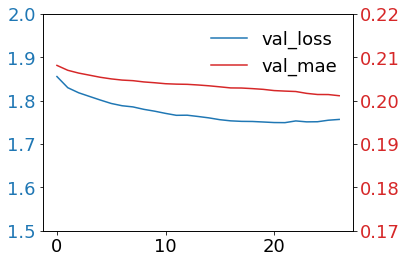

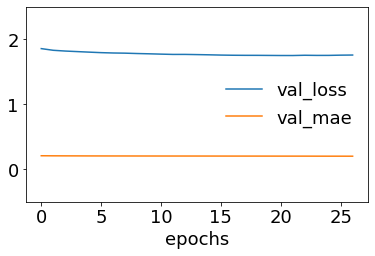

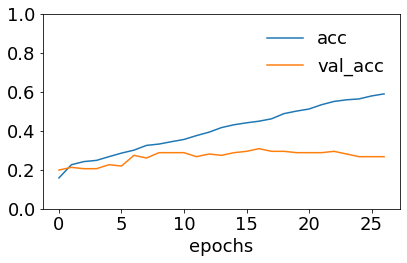

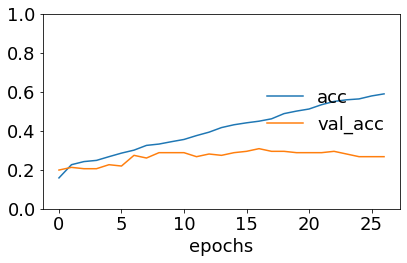

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6}, '1': {'precision': 0.28846153846153844, 'recall': 0.5, 'f1-score': 0.36585365853658536, 'support': 60}, '2': {'precision': 0.17142857142857143, 'recall': 0.13636363636363635, 'f1-score': 0.15189873417721517, 'support': 44}, '3': {'precision': 0.19047619047619047, 'recall': 0.11764705882352941, 'f1-score': 0.14545454545454542, 'support': 34}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 36}, '5': {'precision': 0.26582278481012656, 'recall': 0.4117647058823529, 'f1-score': 0.32307692307692304, 'support': 51}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.25, 'macro avg': {'precision': 0.11452363564705335, 'recall': 0.14572192513368984, 'f1-score': 0.12328548265565863, 'support': 244}, 'weighted avg': {'precision': 0.1839495981641655, 'recall': 0.25, 'f1-score': 0.20515221900971398, 'sup

<Figure size 432x288 with 0 Axes>

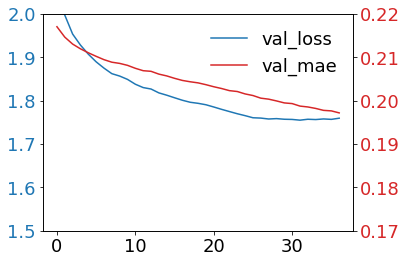

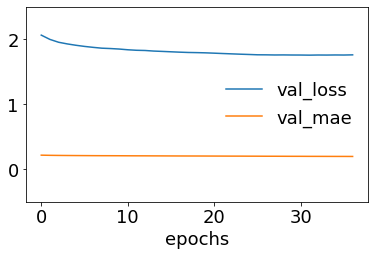

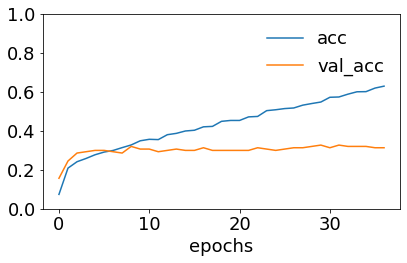

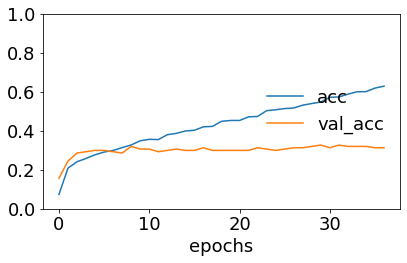

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6}, '1': {'precision': 0.30434782608695654, 'recall': 0.4745762711864407, 'f1-score': 0.37086092715231783, 'support': 59}, '2': {'precision': 0.12903225806451613, 'recall': 0.09090909090909091, 'f1-score': 0.10666666666666667, 'support': 44}, '3': {'precision': 0.3333333333333333, 'recall': 0.02857142857142857, 'f1-score': 0.05263157894736842, 'support': 35}, '4': {'precision': 0.2222222222222222, 'recall': 0.16666666666666666, 'f1-score': 0.1904761904761905, 'support': 36}, '5': {'precision': 0.2777777777777778, 'recall': 0.49019607843137253, 'f1-score': 0.3546099290780142, 'support': 51}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12}, 'accuracy': 0.26337448559670784, 'macro avg': {'precision': 0.18095905964068656, 'recall': 0.17870279082357135, 'f1-score': 0.15360647033150823, 'support': 243}, 'weighted avg': {'precision': 0.23649084126461928, 'recall': 0.26337448559670784, 'f1-score': 0.2195

<Figure size 432x288 with 0 Axes>

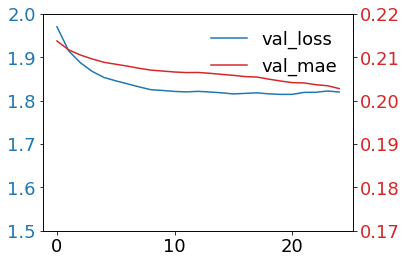

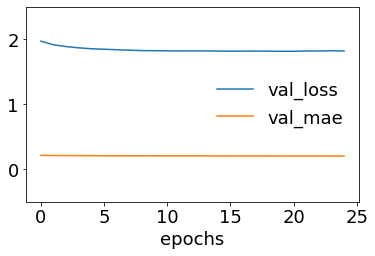

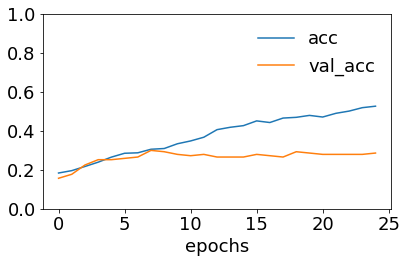

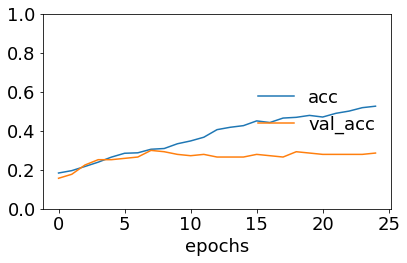

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6}, '1': {'precision': 0.2542372881355932, 'recall': 0.5084745762711864, 'f1-score': 0.3389830508474576, 'support': 59}, '2': {'precision': 0.23809523809523808, 'recall': 0.22727272727272727, 'f1-score': 0.23255813953488372, 'support': 44}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 34}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 36}, '5': {'precision': 0.25609756097560976, 'recall': 0.4117647058823529, 'f1-score': 0.31578947368421056, 'support': 51}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 13}, 'accuracy': 0.25102880658436216, 'macro avg': {'precision': 0.10691858388663444, 'recall': 0.16393028706089524, 'f1-score': 0.12676152343807884, 'support': 243}, 'weighted avg': {'precision': 0.15858916084751676, 'recall': 0.25102880658436216, 'f1-score': 0.1906906226231672, 'support': 243}}
9.0
Model: "model_86"
_________________________________________

<Figure size 432x288 with 0 Axes>

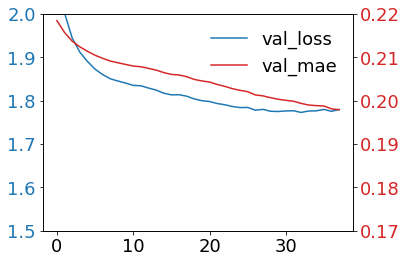

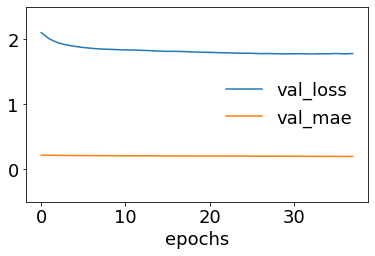

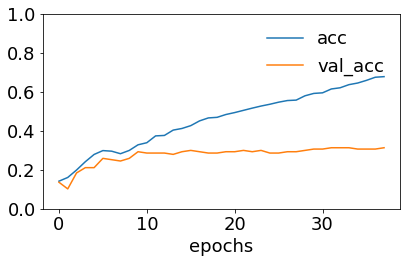

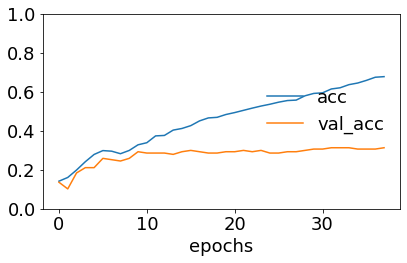

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6}, '1': {'precision': 0.2857142857142857, 'recall': 0.4745762711864407, 'f1-score': 0.356687898089172, 'support': 59}, '2': {'precision': 0.18, 'recall': 0.20930232558139536, 'f1-score': 0.19354838709677422, 'support': 43}, '3': {'precision': 0.5, 'recall': 0.029411764705882353, 'f1-score': 0.05555555555555555, 'support': 34}, '4': {'precision': 0.30434782608695654, 'recall': 0.1891891891891892, 'f1-score': 0.23333333333333334, 'support': 37}, '5': {'precision': 0.3, 'recall': 0.4117647058823529, 'f1-score': 0.34710743801652894, 'support': 51}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 13}, 'accuracy': 0.2716049382716049, 'macro avg': {'precision': 0.22429458740017746, 'recall': 0.1877491795064658, 'f1-score': 0.1694618017273377, 'support': 243}, 'weighted avg': {'precision': 0.280485647828643, 'recall': 0.2716049382716049, 'f1-score': 0.23700357281270634, 'support': 243}}
9.0
Model: "model_87

<Figure size 432x288 with 0 Axes>

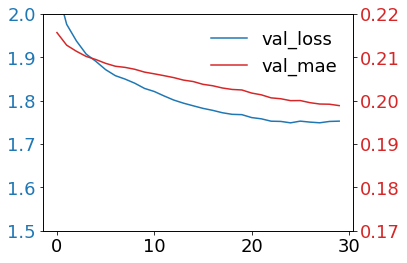

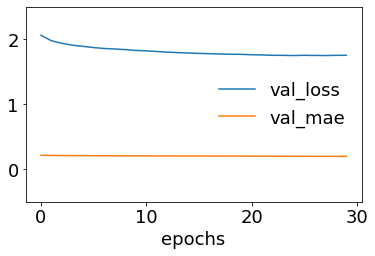

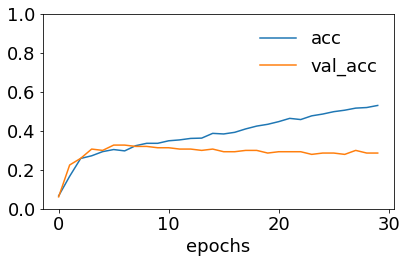

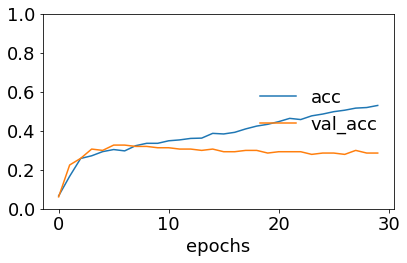

{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6}, '1': {'precision': 0.32, 'recall': 0.6666666666666666, 'f1-score': 0.43243243243243246, 'support': 60}, '2': {'precision': 0.38095238095238093, 'recall': 0.18604651162790697, 'f1-score': 0.25, 'support': 43}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 34}, '4': {'precision': 0.5, 'recall': 0.02702702702702703, 'f1-score': 0.05128205128205129, 'support': 37}, '5': {'precision': 0.28421052631578947, 'recall': 0.54, 'f1-score': 0.37241379310344824, 'support': 50}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 13}, 'accuracy': 0.31275720164609055, 'macro avg': {'precision': 0.21216612960973863, 'recall': 0.20282002933165724, 'f1-score': 0.15801832525970458, 'support': 243}, 'weighted avg': {'precision': 0.28103489175613927, 'recall': 0.31275720164609055, 'f1-score': 0.23544885390351547, 'support': 243}}


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_lstm_cnn_tf_1, r] = lstm_cnn_tf(texts_tf1, data_1, embedding_matrix_1, num1)  # 20% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Model: "model_88"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_177 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_86 (Embedding)        (None, 432, 300)     5821500     input_177[0][0]                  
__________________________________________________________________________________________________
input_178 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_7 (Conv1D)               (None, 430, 300)     270300      embedding_86[0][0]               
_____________________________________________________________

<Figure size 432x288 with 0 Axes>

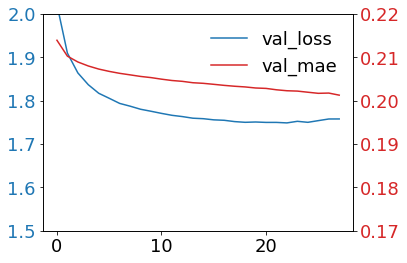

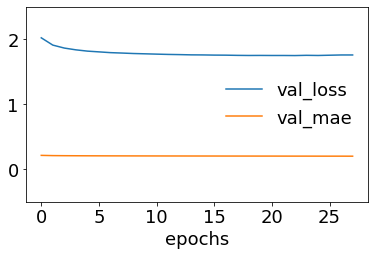

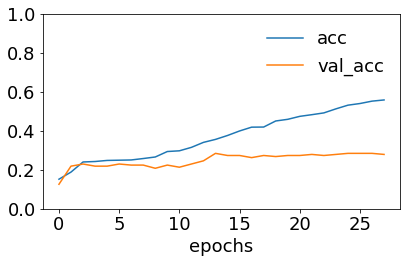

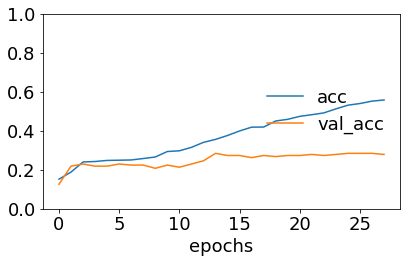

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7}, '1': {'precision': 0.31097560975609756, 'recall': 0.68, 'f1-score': 0.4267782426778243, 'support': 75}, '2': {'precision': 0.3157894736842105, 'recall': 0.10909090909090909, 'f1-score': 0.16216216216216217, 'support': 55}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 42}, '4': {'precision': 0.23076923076923078, 'recall': 0.13043478260869565, 'f1-score': 0.16666666666666669, 'support': 46}, '5': {'precision': 0.2823529411764706, 'recall': 0.375, 'f1-score': 0.3221476510067114, 'support': 64}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.28524590163934427, 'macro avg': {'precision': 0.14248590692325117, 'recall': 0.1618157114624506, 'f1-score': 0.13471934031417057, 'support': 305}, 'weighted avg': {'precision': 0.2274674250328447, 'recall': 0.28524590163934427, 'f1-score': 0.2269226342

<Figure size 432x288 with 0 Axes>

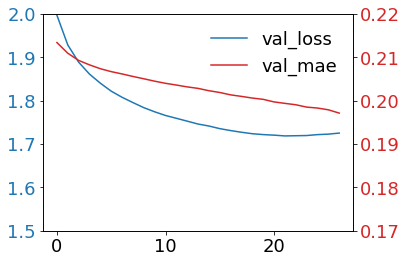

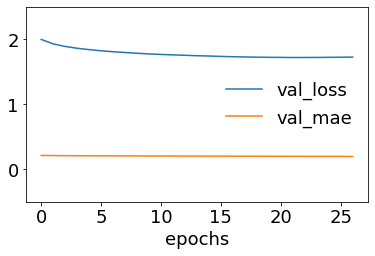

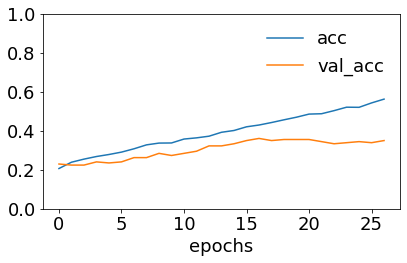

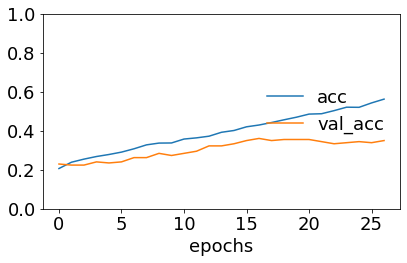

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7}, '1': {'precision': 0.27848101265822783, 'recall': 0.5866666666666667, 'f1-score': 0.37768240343347637, 'support': 75}, '2': {'precision': 0.2222222222222222, 'recall': 0.17857142857142858, 'f1-score': 0.198019801980198, 'support': 56}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 42}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 45}, '5': {'precision': 0.2808988764044944, 'recall': 0.390625, 'f1-score': 0.32679738562091504, 'support': 64}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.25901639344262295, 'macro avg': {'precision': 0.09770026391061806, 'recall': 0.1444828869047619, 'f1-score': 0.11281244887932368, 'support': 305}, 'weighted avg': {'precision': 0.16822310978262023, 'recall': 0.25901639344262295, 'f1-score': 0.19780433392832908, 'support': 305}}
9.0


<Figure size 432x288 with 0 Axes>

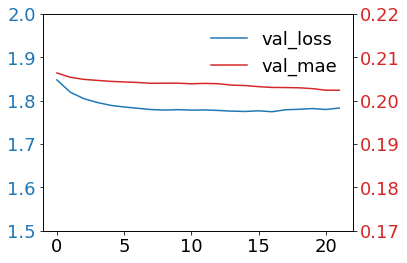

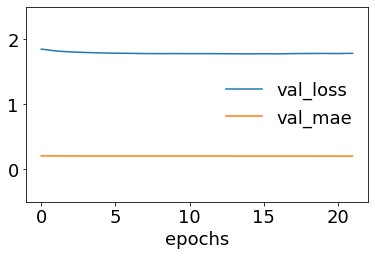

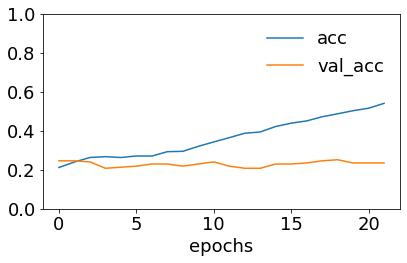

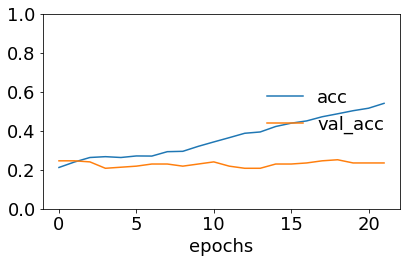

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7}, '1': {'precision': 0.26519337016574585, 'recall': 0.64, 'f1-score': 0.375, 'support': 75}, '2': {'precision': 0.2631578947368421, 'recall': 0.08928571428571429, 'f1-score': 0.13333333333333333, 'support': 56}, '3': {'precision': 0.15384615384615385, 'recall': 0.047619047619047616, 'f1-score': 0.07272727272727272, 'support': 42}, '4': {'precision': 0.07407407407407407, 'recall': 0.044444444444444446, 'f1-score': 0.05555555555555555, 'support': 45}, '5': {'precision': 0.21875, 'recall': 0.21875, 'f1-score': 0.21875, 'support': 64}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, 'accuracy': 0.23355263157894737, 'macro avg': {'precision': 0.13928878468897368, 'recall': 0.14858560090702946, 'f1-score': 0.12219516594516595, 'support': 304}, 'weighted avg': {'precision': 0.19217505481107203, 'recall': 0.23355263157894737, 'f1-score': 0.18140201355661884, 'support': 304}}
9.0
Model: "model_91"
____

<Figure size 432x288 with 0 Axes>

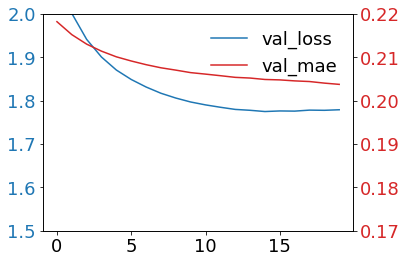

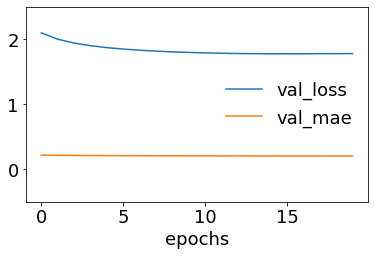

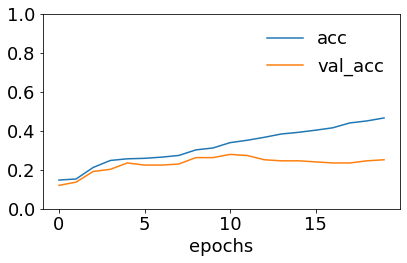

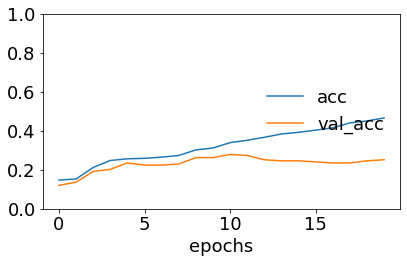

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7}, '1': {'precision': 0.30601092896174864, 'recall': 0.7567567567567568, 'f1-score': 0.43579766536964976, 'support': 74}, '2': {'precision': 0.375, 'recall': 0.05357142857142857, 'f1-score': 0.09375, 'support': 56}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 42}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 45}, '5': {'precision': 0.3113207547169811, 'recall': 0.5076923076923077, 'f1-score': 0.38596491228070173, 'support': 65}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, 'accuracy': 0.3026315789473684, 'macro avg': {'precision': 0.1417616690969614, 'recall': 0.18828864186007044, 'f1-score': 0.13078751109290737, 'support': 304}, 'weighted avg': {'precision': 0.21013374276241176, 'recall': 0.3026315789473684, 'f1-score': 0.20587745570920954, 'support': 304}}
9.0
Model: "model_92"
____________________________________________________________________

<Figure size 432x288 with 0 Axes>

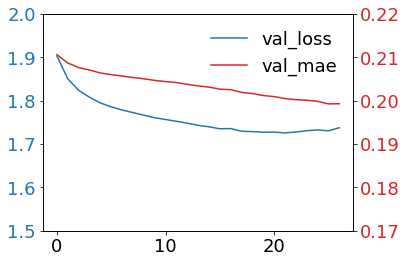

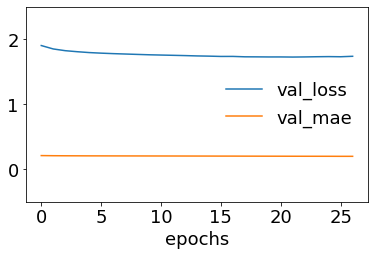

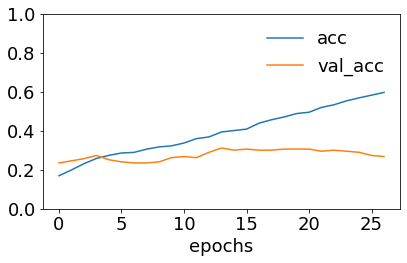

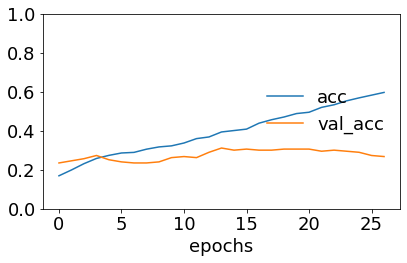

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7}, '1': {'precision': 0.29457364341085274, 'recall': 0.5135135135135135, 'f1-score': 0.374384236453202, 'support': 74}, '2': {'precision': 0.35294117647058826, 'recall': 0.32142857142857145, 'f1-score': 0.33644859813084116, 'support': 56}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 42}, '4': {'precision': 0.14285714285714285, 'recall': 0.10869565217391304, 'f1-score': 0.12345679012345678, 'support': 46}, '5': {'precision': 0.25301204819277107, 'recall': 0.328125, 'f1-score': 0.28571428571428564, 'support': 64}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, 'accuracy': 0.26973684210526316, 'macro avg': {'precision': 0.1490548587044793, 'recall': 0.18168039101657116, 'f1-score': 0.16000055863168366, 'support': 304}, 'weighted avg': {'precision': 0.21160314194250648, 'recall': 0.26973684210526316, 'f1-score': 0.2319417158692676, 'support': 304}}
9.0
Model: "model_93"
____

<Figure size 432x288 with 0 Axes>

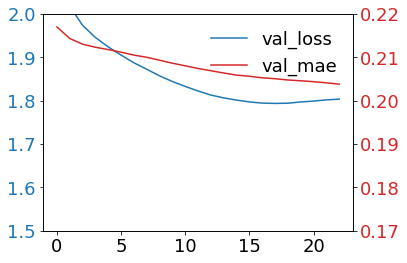

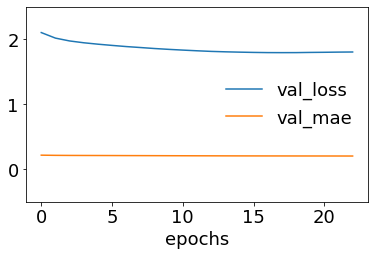

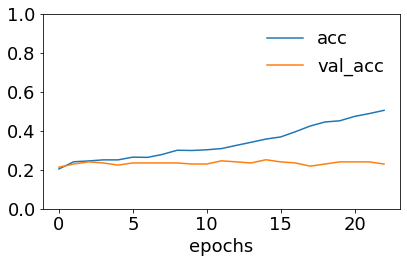

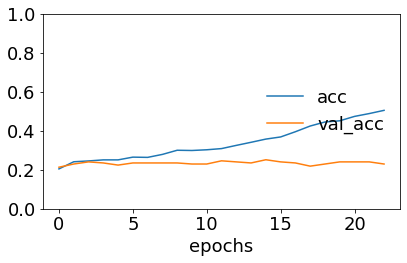

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7}, '1': {'precision': 0.291866028708134, 'recall': 0.8133333333333334, 'f1-score': 0.42957746478873243, 'support': 75}, '2': {'precision': 0.2608695652173913, 'recall': 0.21428571428571427, 'f1-score': 0.23529411764705882, 'support': 56}, '3': {'precision': 0.36363636363636365, 'recall': 0.0975609756097561, 'f1-score': 0.15384615384615385, 'support': 41}, '4': {'precision': 0.25, 'recall': 0.10869565217391304, 'f1-score': 0.15151515151515152, 'support': 46}, '5': {'precision': 0.3333333333333333, 'recall': 0.09375, 'f1-score': 0.14634146341463417, 'support': 64}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, 'accuracy': 0.2894736842105263, 'macro avg': {'precision': 0.21424361298503175, 'recall': 0.1896608107718167, 'f1-score': 0.1595106216016758, 'support': 304}, 'weighted avg': {'precision': 0.2771087896306191, 'recall': 0.2894736842105263, 'f1-score': 0.22380928744511874, 'support': 304}}


<Figure size 432x288 with 0 Axes>

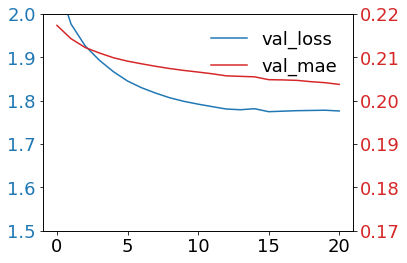

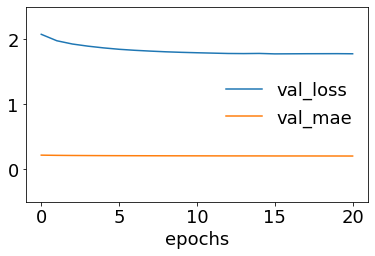

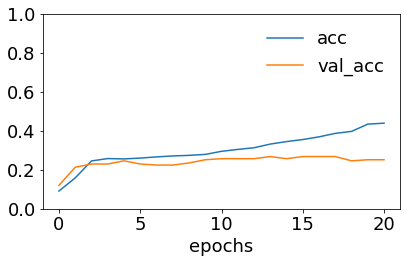

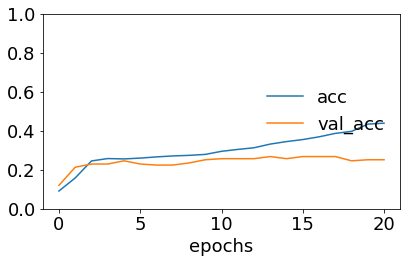

{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6}, '1': {'precision': 0.2903225806451613, 'recall': 0.84, 'f1-score': 0.43150684931506844, 'support': 75}, '2': {'precision': 0.23529411764705882, 'recall': 0.21428571428571427, 'f1-score': 0.22429906542056074, 'support': 56}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 41}, '4': {'precision': 0.1935483870967742, 'recall': 0.13043478260869565, 'f1-score': 0.15584415584415587, 'support': 46}, '5': {'precision': 0.4, 'recall': 0.03125, 'f1-score': 0.057971014492753624, 'support': 64}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2730263157894737, 'macro avg': {'precision': 0.13989563567362429, 'recall': 0.15199631211180123, 'f1-score': 0.10870263563406735, 'support': 304}, 'weighted avg': {'precision': 0.22846674323379607, 'recall': 0.2730263157894737, 'f1-score': 0.18356163637680573, 's

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_lstm_cnn_tf_2, r] = lstm_cnn_tf(texts_tf2, data_2, embedding_matrix_2, num2)  # 50% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Model: "model_95"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_191 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_87 (Embedding)        (None, 432, 300)     6372900     input_191[0][0]                  
__________________________________________________________________________________________________
input_192 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_14 (Conv1D)              (None, 430, 300)     270300      embedding_87[0][0]               
_____________________________________________________________

<Figure size 432x288 with 0 Axes>

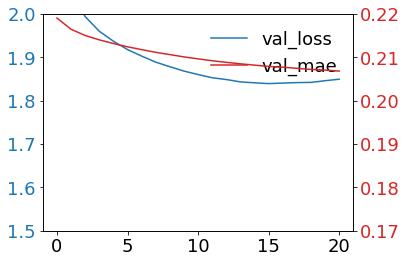

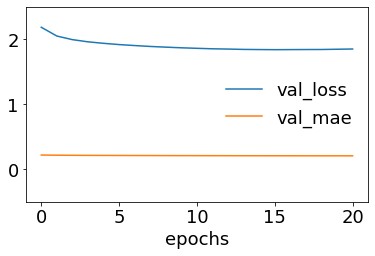

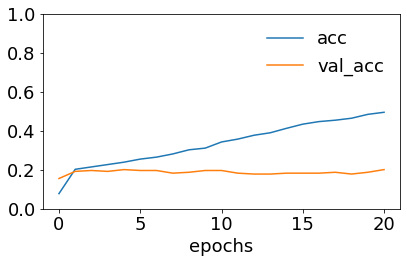

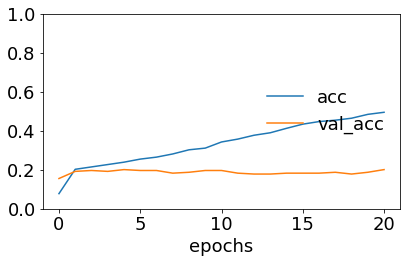

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 9}, '1': {'precision': 0.31666666666666665, 'recall': 0.4318181818181818, 'f1-score': 0.36538461538461536, 'support': 88}, '2': {'precision': 0.2903225806451613, 'recall': 0.13636363636363635, 'f1-score': 0.18556701030927836, 'support': 66}, '3': {'precision': 0.08333333333333333, 'recall': 0.018867924528301886, 'f1-score': 0.03076923076923077, 'support': 53}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 55}, '5': {'precision': 0.26262626262626265, 'recall': 0.6842105263157895, 'f1-score': 0.3795620437956205, 'support': 76}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 18}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.273224043715847, 'macro avg': {'precision': 0.11911860540892799, 'recall': 0.15890753362823867, 'f1-score': 0.1201603625323431, 'support': 366}, 'weighted avg': {'precision': 0.1950934962172403, 'recall': 0.273224043715847

<Figure size 432x288 with 0 Axes>

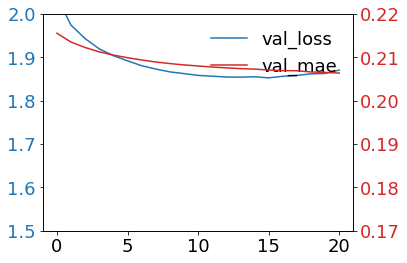

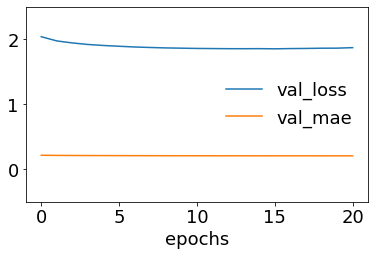

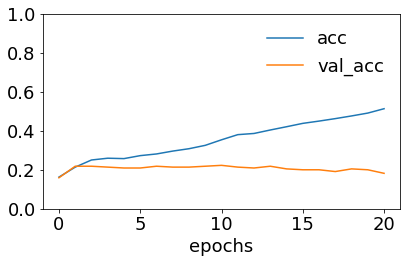

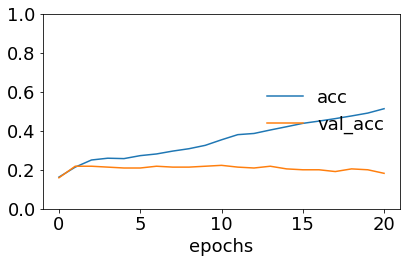

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 9}, '1': {'precision': 0.3224043715846995, 'recall': 0.6704545454545454, 'f1-score': 0.4354243542435424, 'support': 88}, '2': {'precision': 0.20833333333333334, 'recall': 0.15151515151515152, 'f1-score': 0.1754385964912281, 'support': 66}, '3': {'precision': 0.06060606060606061, 'recall': 0.038461538461538464, 'f1-score': 0.047058823529411764, 'support': 52}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 54}, '5': {'precision': 0.2857142857142857, 'recall': 0.36363636363636365, 'f1-score': 0.32, 'support': 77}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 19}, 'accuracy': 0.27123287671232876, 'macro avg': {'precision': 0.12529400731976845, 'recall': 0.17486679986679984, 'f1-score': 0.1397031106091689, 'support': 365}, 'weighted avg': {'precision': 0.18430986260539367, 'recall': 0.27123287671232876, 'f1-score': 0.21091328593255396, 'support': 365}}
9.0
Model: "model_97"
_______

<Figure size 432x288 with 0 Axes>

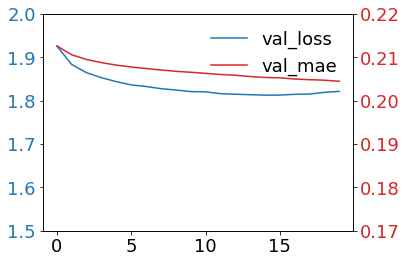

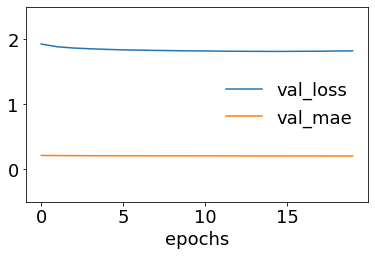

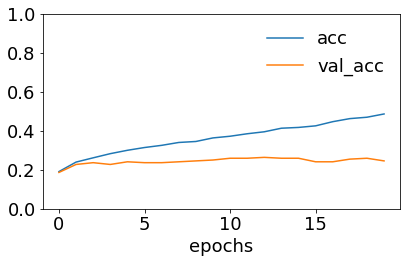

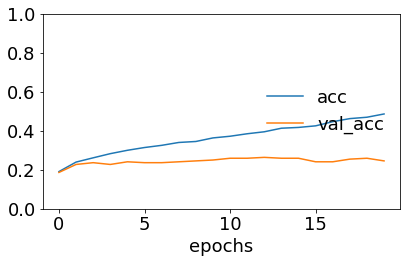

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 9}, '1': {'precision': 0.2626728110599078, 'recall': 0.6477272727272727, 'f1-score': 0.37377049180327865, 'support': 88}, '2': {'precision': 0.14893617021276595, 'recall': 0.10606060606060606, 'f1-score': 0.12389380530973451, 'support': 66}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 52}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 54}, '5': {'precision': 0.24752475247524752, 'recall': 0.3246753246753247, 'f1-score': 0.2808988764044944, 'support': 77}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 19}, 'accuracy': 0.24383561643835616, 'macro avg': {'precision': 0.09416196196398875, 'recall': 0.15406617192331476, 'f1-score': 0.11122331050250109, 'support': 365}, 'weighted avg': {'precision': 0.14247780972029728, 'recall': 0.24383561643835616, 'f1-score': 0.17177536414322483, 'support': 365}}
9.0
Model: "model_98"
________________________________________

<Figure size 432x288 with 0 Axes>

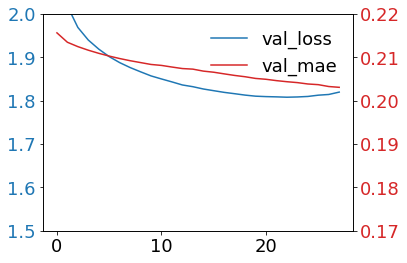

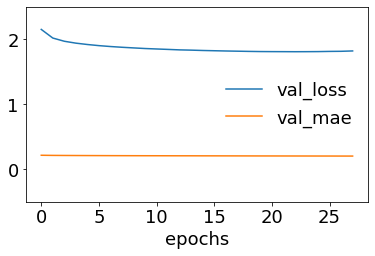

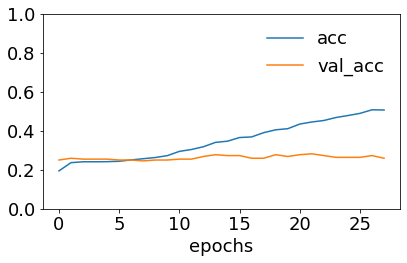

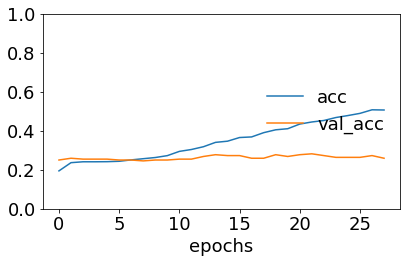

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 9}, '1': {'precision': 0.2577777777777778, 'recall': 0.6590909090909091, 'f1-score': 0.3706070287539936, 'support': 88}, '2': {'precision': 0.13333333333333333, 'recall': 0.029850746268656716, 'f1-score': 0.048780487804878044, 'support': 67}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 52}, '4': {'precision': 0.21052631578947367, 'recall': 0.14814814814814814, 'f1-score': 0.17391304347826086, 'support': 54}, '5': {'precision': 0.28735632183908044, 'recall': 0.32894736842105265, 'f1-score': 0.3067484662576687, 'support': 76}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 19}, 'accuracy': 0.2547945205479452, 'macro avg': {'precision': 0.1269991069628093, 'recall': 0.16657673884696664, 'f1-score': 0.12857843232782876, 'support': 365}, 'weighted avg': {'precision': 0.17760350490460128, 'recall': 0.2547945205479452, 'f1-score': 0.1879065725936635, 'support': 365}}
0.0
Model: "mode

<Figure size 432x288 with 0 Axes>

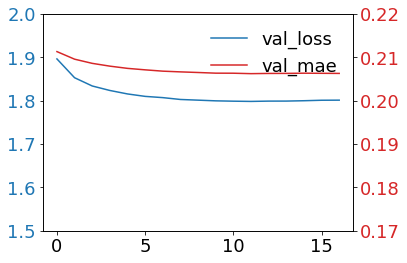

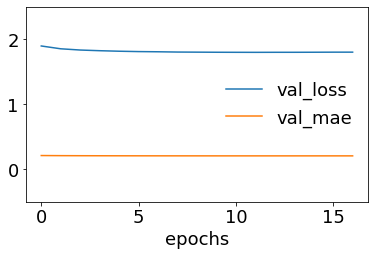

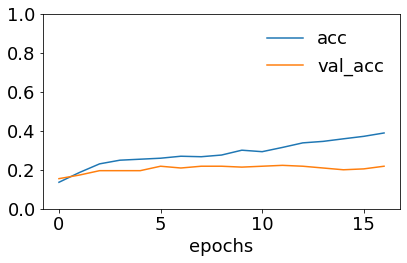

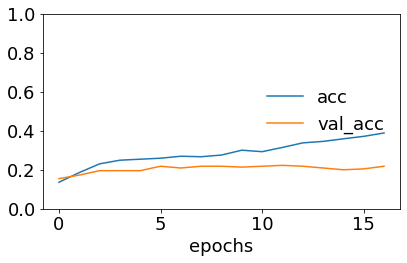

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 9}, '1': {'precision': 0.2533783783783784, 'recall': 0.8522727272727273, 'f1-score': 0.39062500000000006, 'support': 88}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 66}, '3': {'precision': 0.3333333333333333, 'recall': 0.057692307692307696, 'f1-score': 0.09836065573770493, 'support': 52}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 55}, '5': {'precision': 0.24074074074074073, 'recall': 0.17105263157894737, 'f1-score': 0.19999999999999998, 'support': 76}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 18}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2493150684931507, 'macro avg': {'precision': 0.10343155655655656, 'recall': 0.1351272083179978, 'f1-score': 0.08612320696721312, 'support': 365}, 'weighted avg': {'precision': 0.15870390938884088, 'recall': 0.2493150684931507, 'f1-score': 0.1498349427352347, 'support':

<Figure size 432x288 with 0 Axes>

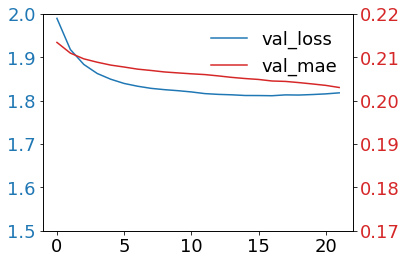

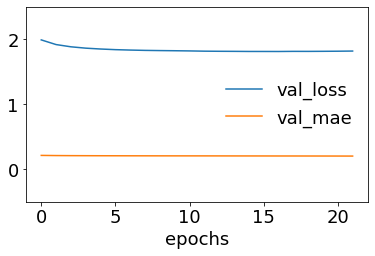

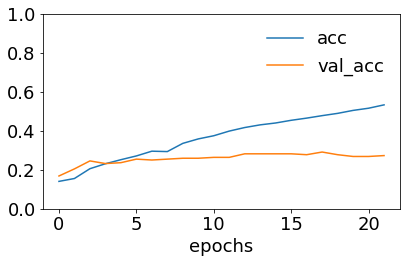

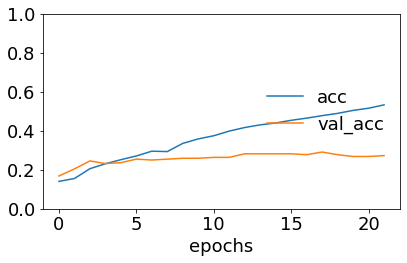

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 9}, '1': {'precision': 0.24858757062146894, 'recall': 0.5, 'f1-score': 0.3320754716981132, 'support': 88}, '2': {'precision': 0.26136363636363635, 'recall': 0.3484848484848485, 'f1-score': 0.2987012987012987, 'support': 66}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 52}, '4': {'precision': 0.5, 'recall': 0.01818181818181818, 'f1-score': 0.03508771929824561, 'support': 55}, '5': {'precision': 0.26804123711340205, 'recall': 0.34210526315789475, 'f1-score': 0.30057803468208094, 'support': 76}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 18}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.25753424657534246, 'macro avg': {'precision': 0.15974905551231341, 'recall': 0.15109649122807017, 'f1-score': 0.12080531554746729, 'support': 365}, 'weighted avg': {'precision': 0.23834750749399403, 'recall': 0.25753424657534246, 'f1-score': 0.2019470751

<Figure size 432x288 with 0 Axes>

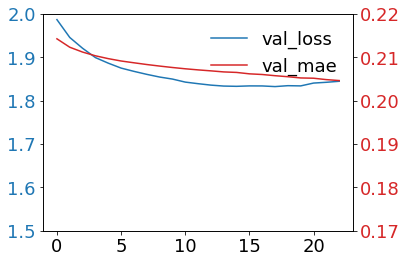

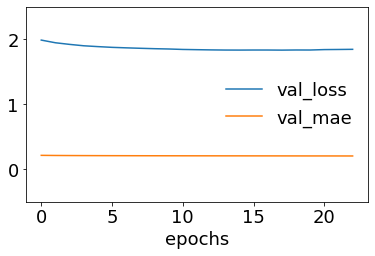

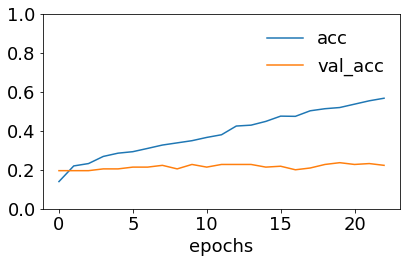

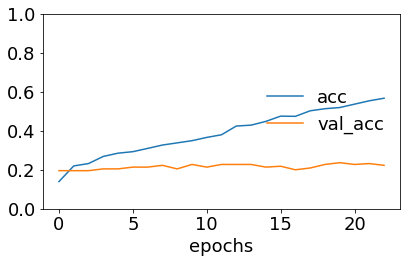

{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 9}, '1': {'precision': 0.2662337662337662, 'recall': 0.4659090909090909, 'f1-score': 0.33884297520661155, 'support': 88}, '2': {'precision': 0.23684210526315788, 'recall': 0.13636363636363635, 'f1-score': 0.17307692307692307, 'support': 66}, '3': {'precision': 0.125, 'recall': 0.057692307692307696, 'f1-score': 0.07894736842105263, 'support': 52}, '4': {'precision': 0.19230769230769232, 'recall': 0.09090909090909091, 'f1-score': 0.1234567901234568, 'support': 55}, '5': {'precision': 0.34959349593495936, 'recall': 0.5657894736842105, 'f1-score': 0.4321608040201005, 'support': 76}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 18}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.27671232876712326, 'macro avg': {'precision': 0.14624713246744697, 'recall': 0.16458294994479206, 'f1-score': 0.14331060760601805, 'support': 365}, 'weighted avg': {'precision': 0.226592271

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_lstm_cnn_tf_3, r] = lstm_cnn_tf(texts_tf3, data_3, embedding_matrix_3, num3)  # 80% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
9.0
Model: "model_102"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_205 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_88 (Embedding)        (None, 432, 300)     6682500     input_205[0][0]                  
__________________________________________________________________________________________________
input_206 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_21 (Conv1D)              (None, 430, 300)     270300      embedding_88[0][0]               
____________________________________________________________

<Figure size 432x288 with 0 Axes>

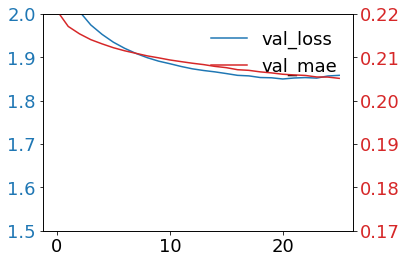

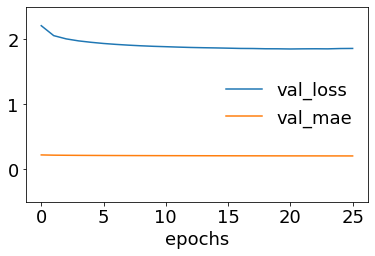

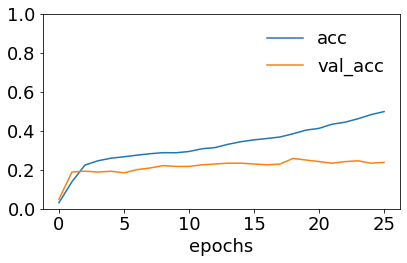

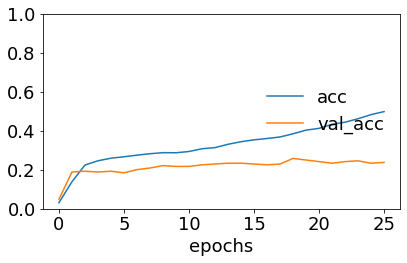

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10}, '1': {'precision': 0.2605042016806723, 'recall': 0.6326530612244898, 'f1-score': 0.3690476190476191, 'support': 98}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 73}, '3': {'precision': 0.4782608695652174, 'recall': 0.1864406779661017, 'f1-score': 0.26829268292682923, 'support': 59}, '4': {'precision': 0.2, 'recall': 0.04918032786885246, 'f1-score': 0.07894736842105264, 'support': 61}, '5': {'precision': 0.27906976744186046, 'recall': 0.42857142857142855, 'f1-score': 0.3380281690140845, 'support': 84}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 21}, 'accuracy': 0.27586206896551724, 'macro avg': {'precision': 0.17397640552682145, 'recall': 0.1852636422329818, 'f1-score': 0.15061654848708364, 'support': 406}, 'weighted avg': {'precision': 0.2201691220053448, 'recall': 0.27586206896551724, 'f1-score': 0.20986721830102686, 'support': 406}}
0.0
Model: "model_103"
__________

<Figure size 432x288 with 0 Axes>

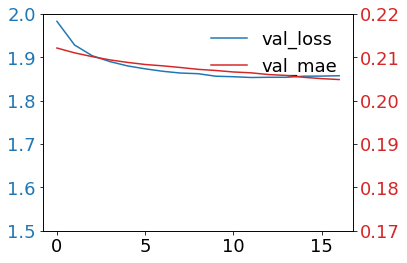

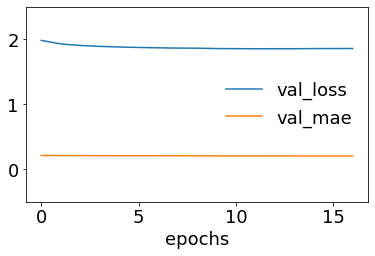

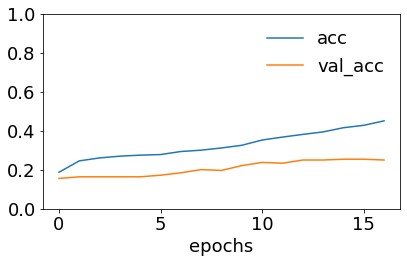

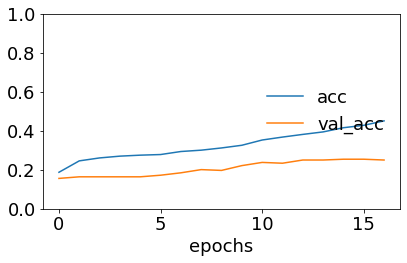

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10}, '1': {'precision': 0.26996197718631176, 'recall': 0.7244897959183674, 'f1-score': 0.3933518005540166, 'support': 98}, '2': {'precision': 0.12903225806451613, 'recall': 0.0547945205479452, 'f1-score': 0.07692307692307691, 'support': 73}, '3': {'precision': 0.09090909090909091, 'recall': 0.01694915254237288, 'f1-score': 0.028571428571428574, 'support': 59}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 61}, '5': {'precision': 0.23, 'recall': 0.27380952380952384, 'f1-score': 0.25000000000000006, 'support': 84}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 20}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2438423645320197, 'macro avg': {'precision': 0.08998791576998985, 'recall': 0.13375537410227617, 'f1-score': 0.09360578825606528, 'support': 406}, 'weighted avg': {'precision': 0.1491607511492724, 'recall': 0.2438423645320197, 'f1-scor

<Figure size 432x288 with 0 Axes>

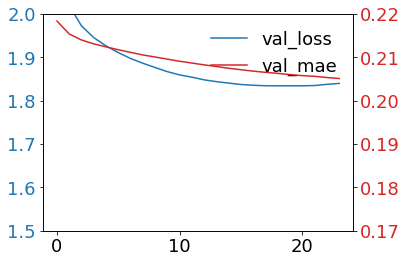

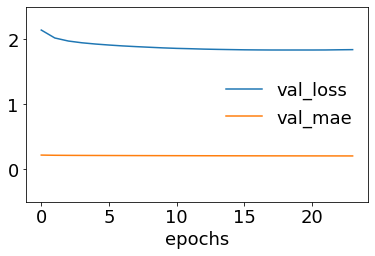

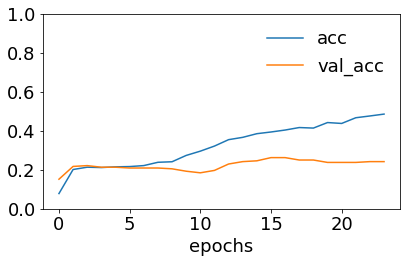

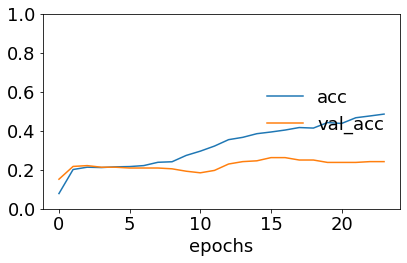

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10}, '1': {'precision': 0.29347826086956524, 'recall': 0.5510204081632653, 'f1-score': 0.3829787234042554, 'support': 98}, '2': {'precision': 0.35294117647058826, 'recall': 0.0821917808219178, 'f1-score': 0.13333333333333333, 'support': 73}, '3': {'precision': 0.09090909090909091, 'recall': 0.03389830508474576, 'f1-score': 0.04938271604938272, 'support': 59}, '4': {'precision': 0.21568627450980393, 'recall': 0.18032786885245902, 'f1-score': 0.19642857142857142, 'support': 61}, '5': {'precision': 0.22727272727272727, 'recall': 0.35714285714285715, 'f1-score': 0.2777777777777778, 'support': 84}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 20}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2536945812807882, 'macro avg': {'precision': 0.14753594125397196, 'recall': 0.15057265250815563, 'f1-score': 0.1299876402491651, 'support': 406}, 'weighted avg': {'precision'

<Figure size 432x288 with 0 Axes>

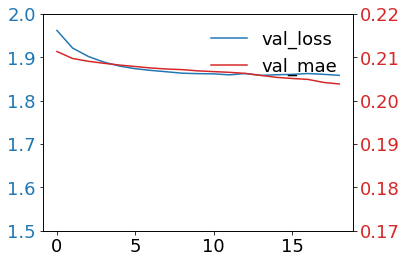

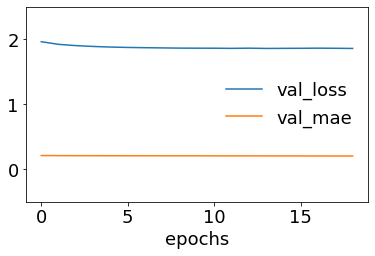

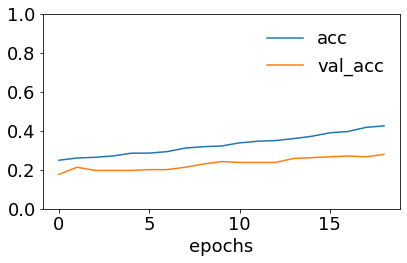

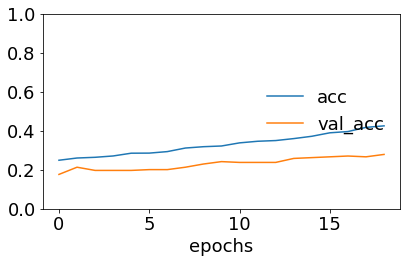

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10}, '1': {'precision': 0.2706766917293233, 'recall': 0.7346938775510204, 'f1-score': 0.3956043956043956, 'support': 98}, '2': {'precision': 0.2222222222222222, 'recall': 0.027777777777777776, 'f1-score': 0.04938271604938271, 'support': 72}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 59}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 61}, '5': {'precision': 0.3511450381679389, 'recall': 0.5411764705882353, 'f1-score': 0.4259259259259258, 'support': 85}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 20}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2955665024630542, 'macro avg': {'precision': 0.10550549401493556, 'recall': 0.1629560157396292, 'f1-score': 0.10886412969746301, 'support': 406}, 'weighted avg': {'precision': 0.1782602069796761, 'recall': 0.2955665024630542, 'f1-score': 0.19341992617854684, 'support': 40

<Figure size 432x288 with 0 Axes>

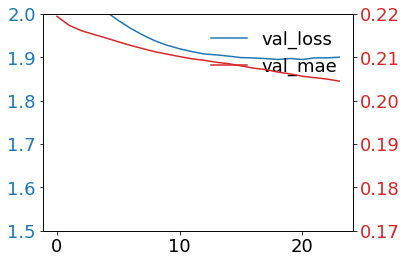

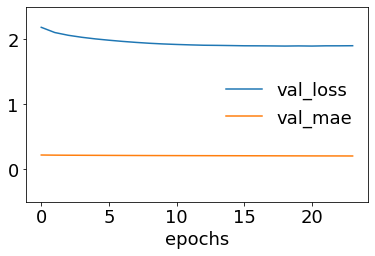

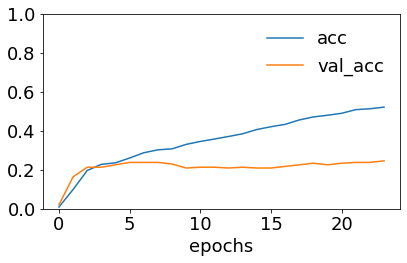

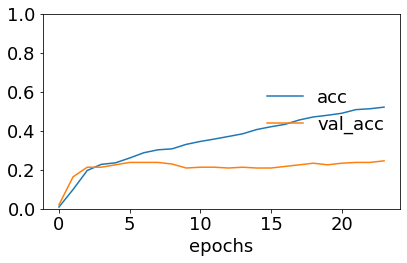

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10}, '1': {'precision': 0.27011494252873564, 'recall': 0.47959183673469385, 'f1-score': 0.34558823529411764, 'support': 98}, '2': {'precision': 0.1568627450980392, 'recall': 0.1095890410958904, 'f1-score': 0.12903225806451613, 'support': 73}, '3': {'precision': 0.08333333333333333, 'recall': 0.05172413793103448, 'f1-score': 0.06382978723404255, 'support': 58}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 61}, '5': {'precision': 0.2827586206896552, 'recall': 0.4823529411764706, 'f1-score': 0.3565217391304348, 'support': 85}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 20}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2438423645320197, 'macro avg': {'precision': 0.09913370520622042, 'recall': 0.14040724461726117, 'f1-score': 0.11187150246538888, 'support': 406}, 'weighted avg': {'precision': 0.16450753904415513, 'recall': 0.2438423645320

<Figure size 432x288 with 0 Axes>

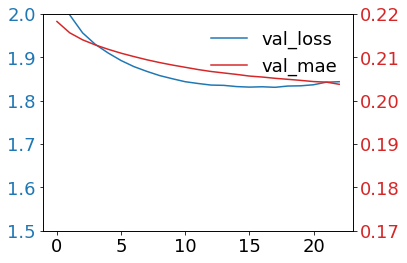

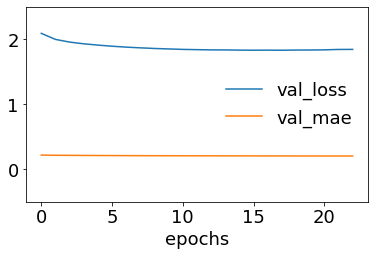

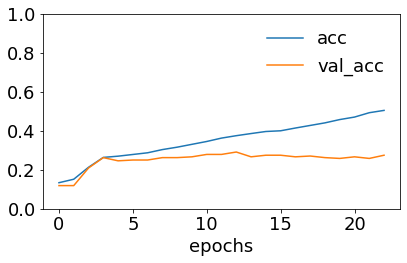

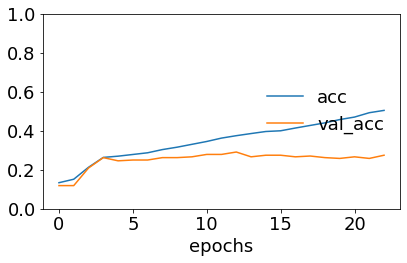

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10}, '1': {'precision': 0.2796610169491525, 'recall': 0.673469387755102, 'f1-score': 0.3952095808383233, 'support': 98}, '2': {'precision': 0.14285714285714285, 'recall': 0.0547945205479452, 'f1-score': 0.07920792079207921, 'support': 73}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 58}, '4': {'precision': 0.5, 'recall': 0.016129032258064516, 'f1-score': 0.03125, 'support': 62}, '5': {'precision': 0.22302158273381295, 'recall': 0.36904761904761907, 'f1-score': 0.27802690582959644, 'support': 84}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 20}, 'accuracy': 0.2518518518518518, 'macro avg': {'precision': 0.16364853464858692, 'recall': 0.15906293708696154, 'f1-score': 0.111956343922857, 'support': 405}, 'weighted avg': {'precision': 0.21622015812155226, 'recall': 0.2518518518518518, 'f1-score': 0.17235673390040385, 'support': 405}}
9.0
Model: "model_108"
______________________

<Figure size 432x288 with 0 Axes>

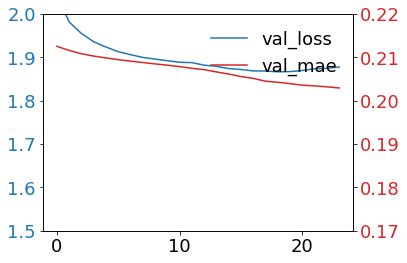

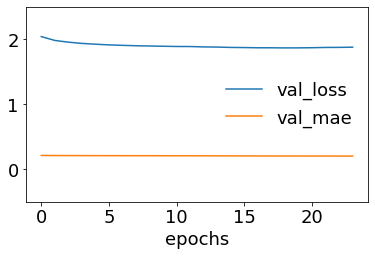

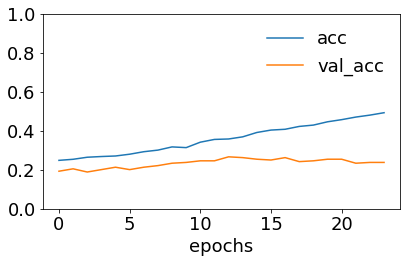

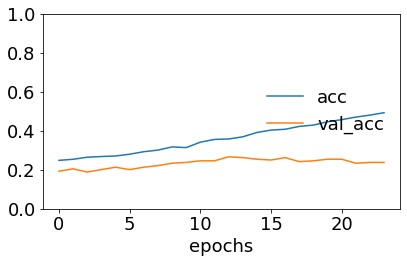

{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10}, '1': {'precision': 0.2985781990521327, 'recall': 0.6428571428571429, 'f1-score': 0.4077669902912622, 'support': 98}, '2': {'precision': 0.22, 'recall': 0.1506849315068493, 'f1-score': 0.17886178861788618, 'support': 73}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 58}, '4': {'precision': 1.0, 'recall': 0.01639344262295082, 'f1-score': 0.03225806451612903, 'support': 61}, '5': {'precision': 0.3076923076923077, 'recall': 0.5238095238095238, 'f1-score': 0.3876651982378855, 'support': 84}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 21}, 'accuracy': 0.2938271604938272, 'macro avg': {'precision': 0.2608957866777772, 'recall': 0.19053500582806673, 'f1-score': 0.14379314880902325, 'support': 405}, 'weighted avg': {'precision': 0.32633782062534034, 'recall': 0.2938271604938272, 'f1-score': 0.21617208445707561, 'support': 405}}


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_lstm_cnn_tf_4, r] = lstm_cnn_tf(texts_tf4, data_4, embedding_matrix_4, num4)  # 100% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Model: "model_109"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_219 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_89 (Embedding)        (None, 432, 300)     6878400     input_219[0][0]                  
__________________________________________________________________________________________________
input_220 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_28 (Conv1D)              (None, 430, 300)     270300      embedding_89[0][0]               
____________________________________________________________

<Figure size 432x288 with 0 Axes>

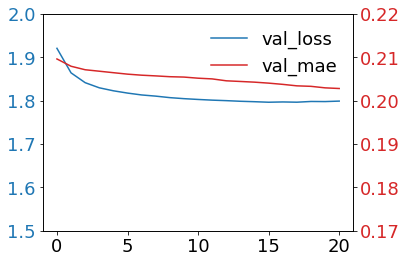

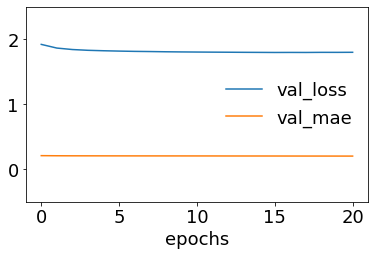

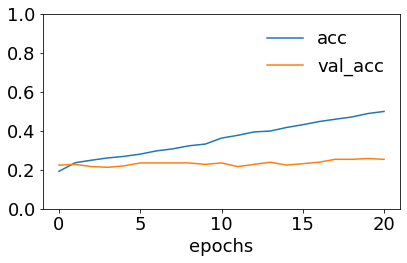

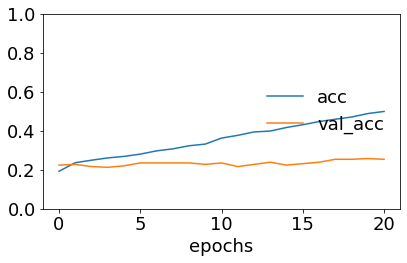

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 11}, '1': {'precision': 0.2850467289719626, 'recall': 0.5596330275229358, 'f1-score': 0.37770897832817335, 'support': 109}, '2': {'precision': 0.25757575757575757, 'recall': 0.2125, 'f1-score': 0.2328767123287671, 'support': 80}, '3': {'precision': 0.25, 'recall': 0.015625, 'f1-score': 0.029411764705882353, 'support': 64}, '4': {'precision': 0.3888888888888889, 'recall': 0.1044776119402985, 'f1-score': 0.16470588235294117, 'support': 67}, '5': {'precision': 0.2827586206896552, 'recall': 0.44086021505376344, 'f1-score': 0.3445378151260505, 'support': 93}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 22}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2841163310961969, 'macro avg': {'precision': 0.18303374951578305, 'recall': 0.16663698181462472, 'f1-score': 0.1436551441052268, 'support': 447}, 'weighted avg': {'precision': 0.2685196003214721, 'recall': 0.284116

<Figure size 432x288 with 0 Axes>

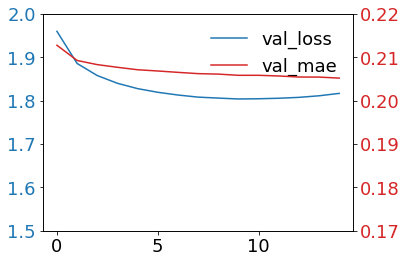

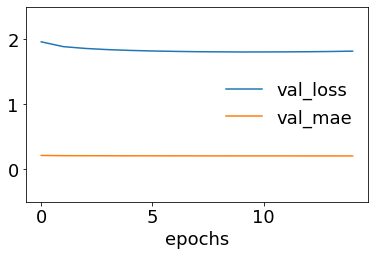

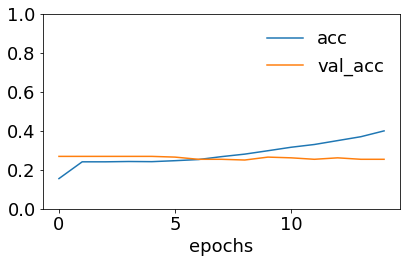

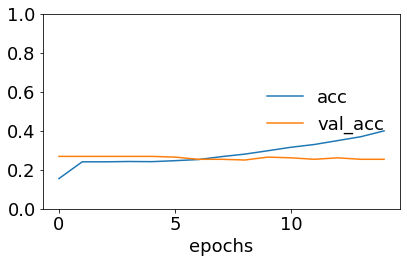

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 11}, '1': {'precision': 0.2560646900269542, 'recall': 0.8715596330275229, 'f1-score': 0.39583333333333337, 'support': 109}, '2': {'precision': 0.2535211267605634, 'recall': 0.225, 'f1-score': 0.2384105960264901, 'support': 80}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 63}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 67}, '5': {'precision': 0.6666666666666666, 'recall': 0.021505376344086023, 'f1-score': 0.04166666666666667, 'support': 93}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 23}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.25727069351230425, 'macro avg': {'precision': 0.147031560431773, 'recall': 0.1397581261714511, 'f1-score': 0.08448882450331126, 'support': 447}, 'weighted avg': {'precision': 0.24651619989660645, 'recall': 0.25727069351230425, 'f1-score': 0.1478605839271869, 'support': 447}}
9.0
Mod

<Figure size 432x288 with 0 Axes>

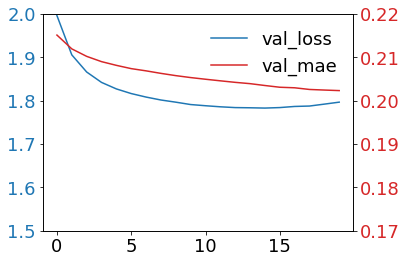

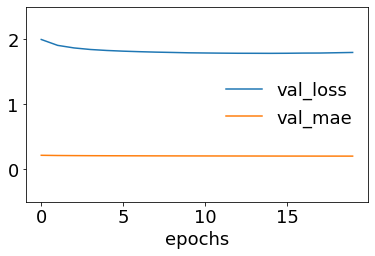

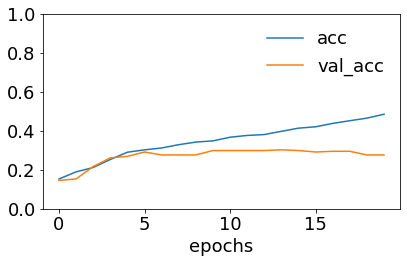

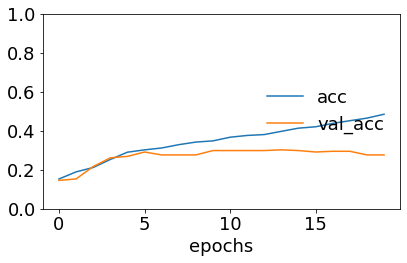

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 11}, '1': {'precision': 0.24358974358974358, 'recall': 0.5229357798165137, 'f1-score': 0.33236151603498537, 'support': 109}, '2': {'precision': 0.16666666666666666, 'recall': 0.05, 'f1-score': 0.07692307692307691, 'support': 80}, '3': {'precision': 0.2, 'recall': 0.047619047619047616, 'f1-score': 0.07692307692307693, 'support': 63}, '4': {'precision': 0.3181818181818182, 'recall': 0.208955223880597, 'f1-score': 0.2522522522522523, 'support': 67}, '5': {'precision': 0.31007751937984496, 'recall': 0.43010752688172044, 'f1-score': 0.3603603603603604, 'support': 93}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 23}, 'accuracy': 0.2645739910313901, 'macro avg': {'precision': 0.17693082111686761, 'recall': 0.1799453683139827, 'f1-score': 0.156974326070536, 'support': 446}, 'weighted avg': {'precision': 0.23013454373345915, 'recall': 0.2645739910313901, 'f1-score': 0.2189278467762956, 'support': 446}}
9.

<Figure size 432x288 with 0 Axes>

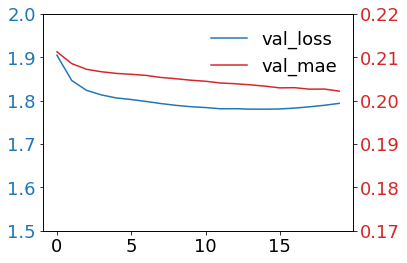

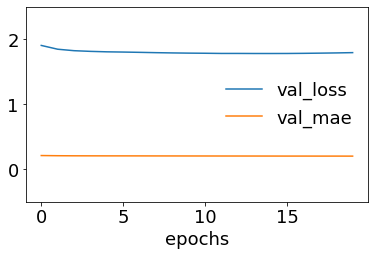

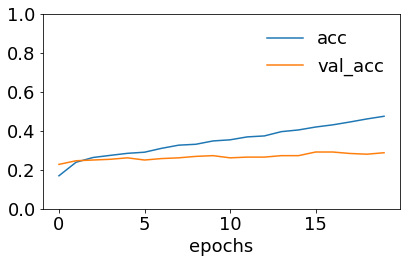

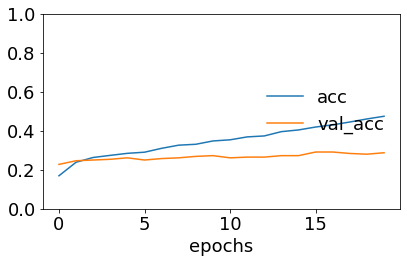

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 11}, '1': {'precision': 0.27956989247311825, 'recall': 0.7155963302752294, 'f1-score': 0.40206185567010305, 'support': 109}, '2': {'precision': 0.16216216216216217, 'recall': 0.075, 'f1-score': 0.10256410256410256, 'support': 80}, '3': {'precision': 1.0, 'recall': 0.015873015873015872, 'f1-score': 0.03125, 'support': 63}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 67}, '5': {'precision': 0.265625, 'recall': 0.3655913978494624, 'f1-score': 0.30769230769230765, 'support': 93}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 23}, 'accuracy': 0.26681614349775784, 'macro avg': {'precision': 0.2439081506621829, 'recall': 0.16743724914252964, 'f1-score': 0.1205097522752162, 'support': 446}, 'weighted avg': {'precision': 0.2940565386828315, 'recall': 0.26681614349775784, 'f1-score': 0.18523319526581625, 'support': 446}}
0.0
Model: "model_113"
__________________________________________

<Figure size 432x288 with 0 Axes>

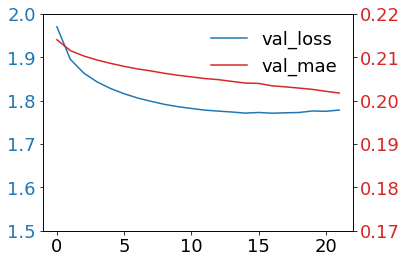

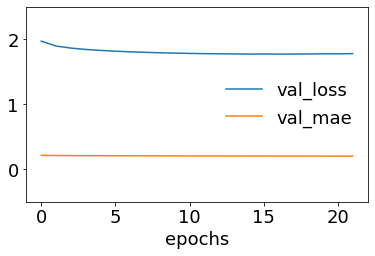

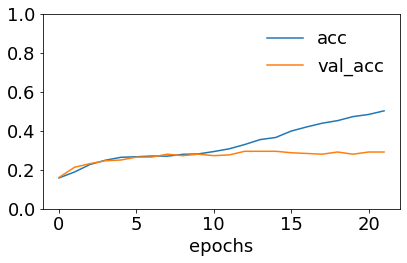

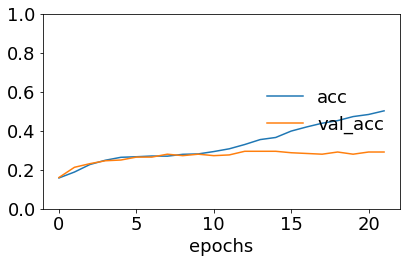

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10}, '1': {'precision': 0.24912280701754386, 'recall': 0.6574074074074074, 'f1-score': 0.361323155216285, 'support': 108}, '2': {'precision': 0.14634146341463414, 'recall': 0.14814814814814814, 'f1-score': 0.14723926380368096, 'support': 81}, '3': {'precision': 0.14814814814814814, 'recall': 0.06349206349206349, 'f1-score': 0.08888888888888888, 'support': 63}, '4': {'precision': 0.2777777777777778, 'recall': 0.07462686567164178, 'f1-score': 0.11764705882352941, 'support': 67}, '5': {'precision': 0.20588235294117646, 'recall': 0.07526881720430108, 'f1-score': 0.11023622047244096, 'support': 93}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 23}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2219730941704036, 'macro avg': {'precision': 0.12840906866241006, 'recall': 0.12736791274044523, 'f1-score': 0.10316682340060315, 'support': 446}, 'weighted avg': {'precisio

<Figure size 432x288 with 0 Axes>

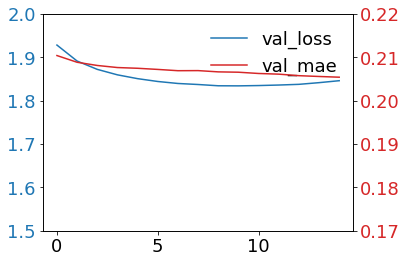

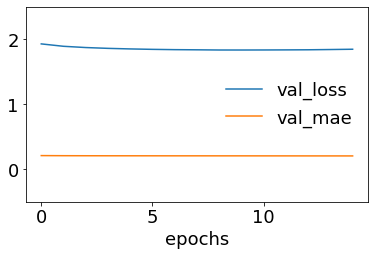

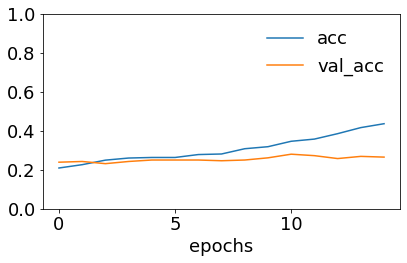

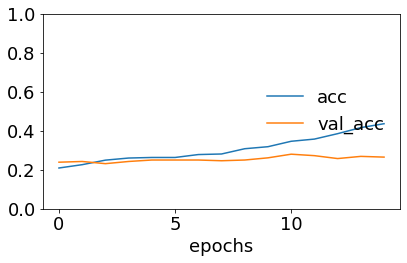

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 11}, '1': {'precision': 0.2608695652173913, 'recall': 0.8333333333333334, 'f1-score': 0.3973509933774834, 'support': 108}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 80}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 64}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 67}, '5': {'precision': 0.24719101123595505, 'recall': 0.2391304347826087, 'f1-score': 0.2430939226519337, 'support': 92}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 23}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.25112107623318386, 'macro avg': {'precision': 0.0635075720566683, 'recall': 0.13405797101449277, 'f1-score': 0.08005561450367714, 'support': 446}, 'weighted avg': {'precision': 0.11416028268427383, 'recall': 0.25112107623318386, 'f1-score': 0.14636445777745766, 'support': 446}}
0.0
Model: "model_115"
________________

<Figure size 432x288 with 0 Axes>

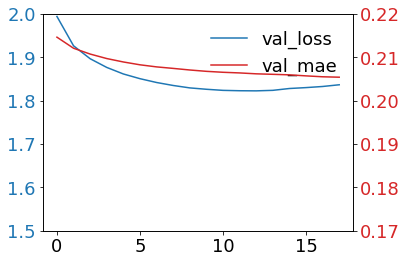

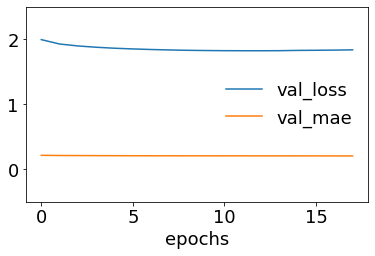

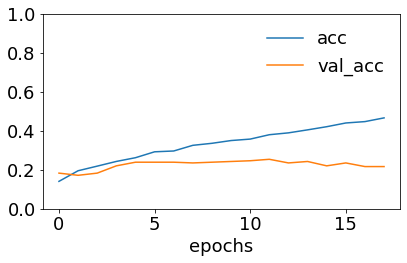

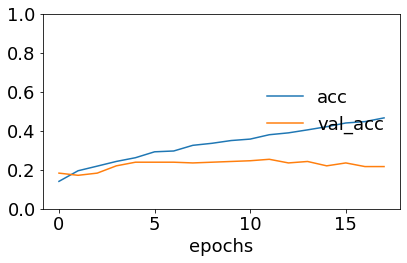

{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 11}, '1': {'precision': 0.28936170212765955, 'recall': 0.6296296296296297, 'f1-score': 0.39650145772594747, 'support': 108}, '2': {'precision': 0.28, 'recall': 0.0875, 'f1-score': 0.13333333333333333, 'support': 80}, '3': {'precision': 0.2857142857142857, 'recall': 0.03125, 'f1-score': 0.056338028169014086, 'support': 64}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 67}, '5': {'precision': 0.2346368715083799, 'recall': 0.45161290322580644, 'f1-score': 0.30882352941176466, 'support': 93}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 22}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.26681614349775784, 'macro avg': {'precision': 0.13621410741879064, 'recall': 0.14999906660692952, 'f1-score': 0.11187454358000745, 'support': 446}, 'weighted avg': {'precision': 0.2102197470084772, 'recall': 0.26681614349775784, 'f1-score': 0.1924104173524215

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_lstm_cnn_tf_5, r] = lstm_cnn_tf(texts_tf5, data_5, embedding_matrix_5, num5)  # 120% data augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
0.0
Model: "model_116"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_233 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_90 (Embedding)        (None, 432, 300)     7125000     input_233[0][0]                  
__________________________________________________________________________________________________
input_234 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_35 (Conv1D)              (None, 430, 300)     270300      embedding_90[0][0]               
____________________________________________________________

<Figure size 432x288 with 0 Axes>

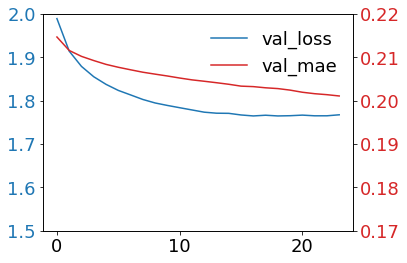

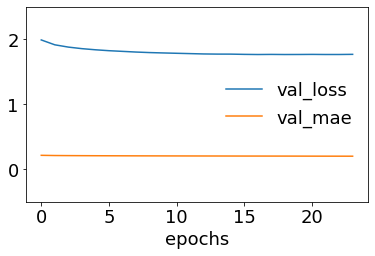

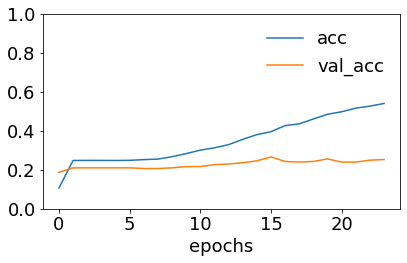

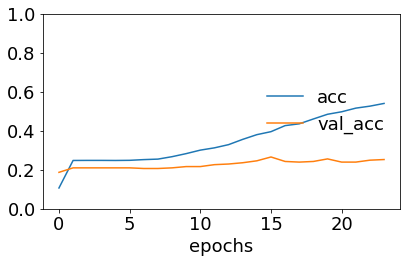

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12}, '1': {'precision': 0.2840466926070039, 'recall': 0.5934959349593496, 'f1-score': 0.38421052631578945, 'support': 123}, '2': {'precision': 0.20512820512820512, 'recall': 0.08602150537634409, 'f1-score': 0.12121212121212123, 'support': 93}, '3': {'precision': 0.16666666666666666, 'recall': 0.11267605633802817, 'f1-score': 0.13445378151260506, 'support': 71}, '4': {'precision': 0.1951219512195122, 'recall': 0.1038961038961039, 'f1-score': 0.13559322033898308, 'support': 77}, '5': {'precision': 0.24390243902439024, 'recall': 0.2830188679245283, 'f1-score': 0.26200873362445415, 'support': 106}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 25}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.25, 'macro avg': {'precision': 0.13685824433072227, 'recall': 0.14738855856179425, 'f1-score': 0.1296847978754941, 'support': 508}, 'weighted avg': {'precision': 0.210090646

<Figure size 432x288 with 0 Axes>

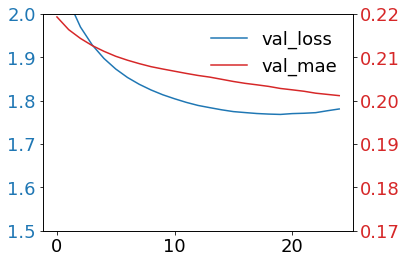

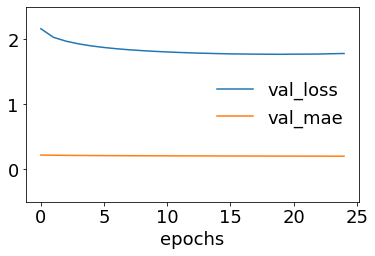

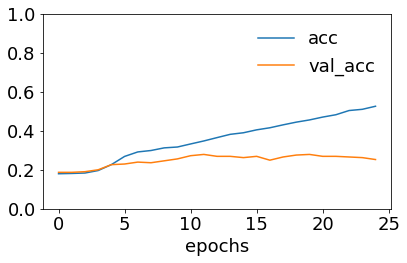

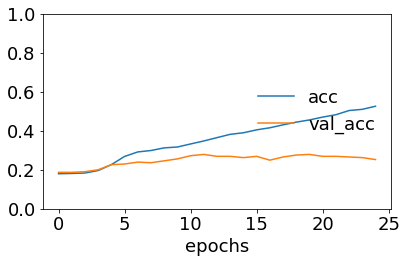

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 11}, '1': {'precision': 0.29583333333333334, 'recall': 0.5772357723577236, 'f1-score': 0.39118457300275483, 'support': 123}, '2': {'precision': 0.22413793103448276, 'recall': 0.13978494623655913, 'f1-score': 0.17218543046357615, 'support': 93}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 71}, '4': {'precision': 0.17647058823529413, 'recall': 0.039473684210526314, 'f1-score': 0.06451612903225806, 'support': 76}, '5': {'precision': 0.32432432432432434, 'recall': 0.5607476635514018, 'f1-score': 0.410958904109589, 'support': 107}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 26}, 'accuracy': 0.28994082840236685, 'macro avg': {'precision': 0.14582373956106207, 'recall': 0.1881774380508873, 'f1-score': 0.1484064338011683, 'support': 507}, 'weighted avg': {'precision': 0.20778460551241018, 'recall': 0.28994082840236685, 'f1-score': 0.22288910465212833, 'support': 507}}
9.0
Model: "

<Figure size 432x288 with 0 Axes>

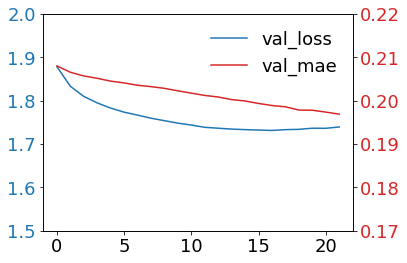

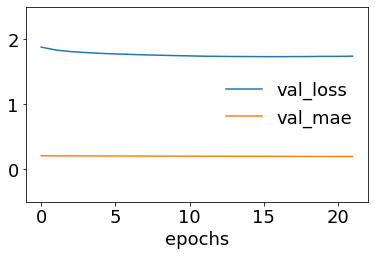

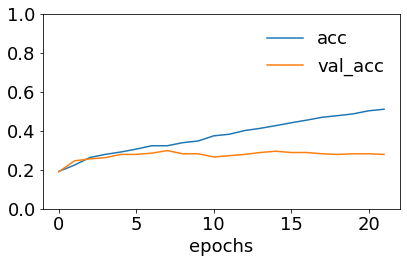

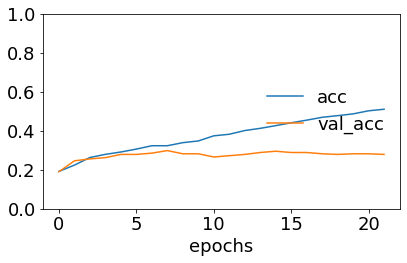

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12}, '1': {'precision': 0.2682926829268293, 'recall': 0.4435483870967742, 'f1-score': 0.3343465045592705, 'support': 124}, '2': {'precision': 0.24175824175824176, 'recall': 0.2391304347826087, 'f1-score': 0.24043715846994537, 'support': 92}, '3': {'precision': 0.2857142857142857, 'recall': 0.056338028169014086, 'f1-score': 0.09411764705882353, 'support': 71}, '4': {'precision': 0.125, 'recall': 0.039473684210526314, 'f1-score': 0.05999999999999999, 'support': 76}, '5': {'precision': 0.28901734104046245, 'recall': 0.4672897196261682, 'f1-score': 0.3571428571428572, 'support': 107}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 25}, 'accuracy': 0.26429980276134124, 'macro avg': {'precision': 0.17282607877711703, 'recall': 0.1779686076978702, 'f1-score': 0.15514916674727092, 'support': 507}, 'weighted avg': {'precision': 0.22923199349453421, 'recall': 0.26429980276134124, 'f1-score': 0.222950342800881

<Figure size 432x288 with 0 Axes>

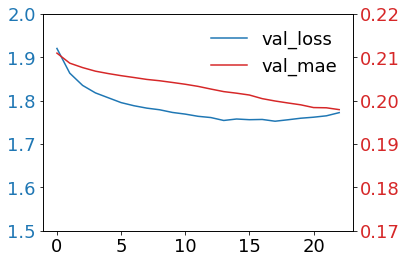

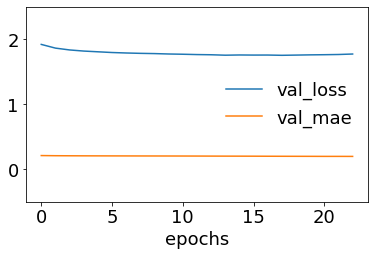

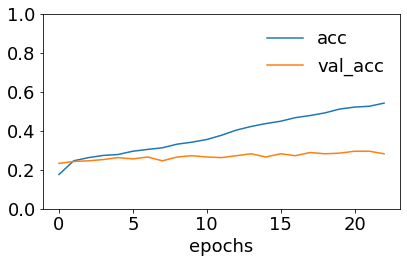

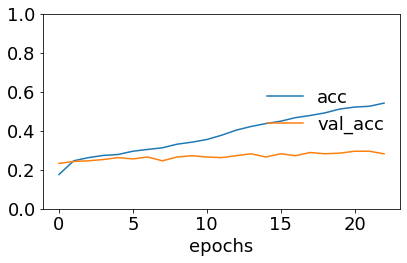

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12}, '1': {'precision': 0.29411764705882354, 'recall': 0.5645161290322581, 'f1-score': 0.3867403314917127, 'support': 124}, '2': {'precision': 0.2753623188405797, 'recall': 0.20652173913043478, 'f1-score': 0.23602484472049687, 'support': 92}, '3': {'precision': 0.16666666666666666, 'recall': 0.04225352112676056, 'f1-score': 0.06741573033707865, 'support': 71}, '4': {'precision': 0.21875, 'recall': 0.09210526315789473, 'f1-score': 0.12962962962962962, 'support': 76}, '5': {'precision': 0.30666666666666664, 'recall': 0.4339622641509434, 'f1-score': 0.35937499999999994, 'support': 106}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 25}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2859960552268245, 'macro avg': {'precision': 0.15769541240409207, 'recall': 0.16741986457478644, 'f1-score': 0.1473981920223647, 'support': 507}, 'weighted avg': {'precision': 0.242147

<Figure size 432x288 with 0 Axes>

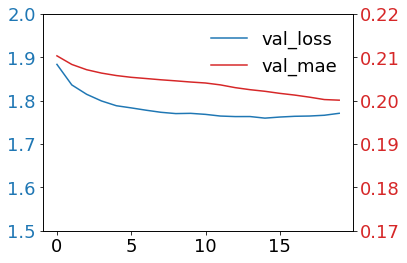

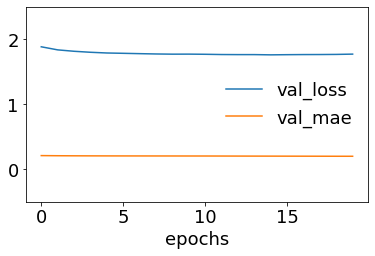

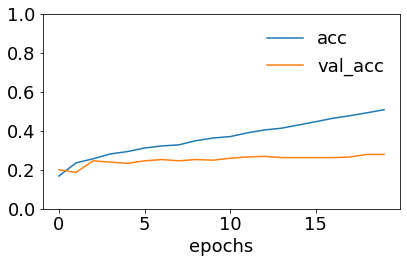

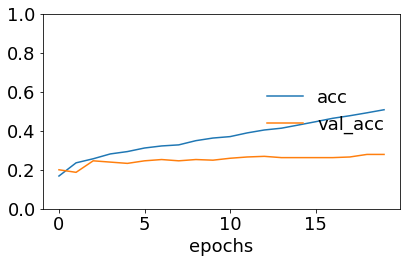

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12}, '1': {'precision': 0.30735930735930733, 'recall': 0.5725806451612904, 'f1-score': 0.39999999999999997, 'support': 124}, '2': {'precision': 0.24050632911392406, 'recall': 0.20652173913043478, 'f1-score': 0.22222222222222224, 'support': 92}, '3': {'precision': 0.2, 'recall': 0.028169014084507043, 'f1-score': 0.04938271604938272, 'support': 71}, '4': {'precision': 0.125, 'recall': 0.013157894736842105, 'f1-score': 0.02380952380952381, 'support': 76}, '5': {'precision': 0.27932960893854747, 'recall': 0.4716981132075472, 'f1-score': 0.3508771929824561, 'support': 106}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 25}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.28205128205128205, 'macro avg': {'precision': 0.14402440567647237, 'recall': 0.16151592579007767, 'f1-score': 0.1307864568829481, 'support': 507}, 'weighted avg': {'precision': 0.2239607000759786, 'r

<Figure size 432x288 with 0 Axes>

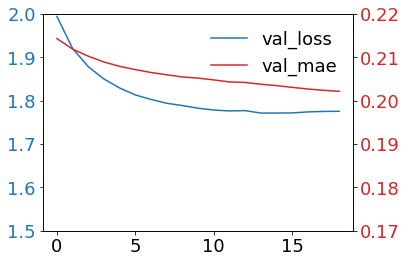

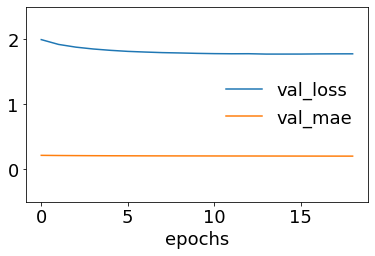

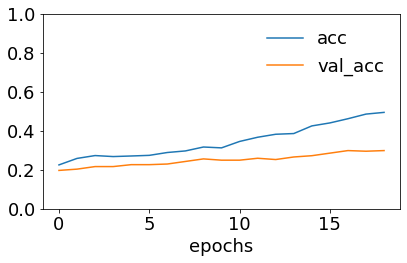

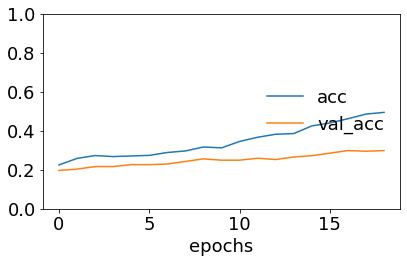

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12}, '1': {'precision': 0.2857142857142857, 'recall': 0.6935483870967742, 'f1-score': 0.4047058823529412, 'support': 124}, '2': {'precision': 0.2753623188405797, 'recall': 0.20652173913043478, 'f1-score': 0.23602484472049687, 'support': 92}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 71}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 76}, '5': {'precision': 0.31746031746031744, 'recall': 0.37735849056603776, 'f1-score': 0.3448275862068966, 'support': 106}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 25}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2859960552268245, 'macro avg': {'precision': 0.10981711525189786, 'recall': 0.15967857709915584, 'f1-score': 0.12319478916004183, 'support': 507}, 'weighted avg': {'precision': 0.1862183400644939, 'recall': 0.2859960552268245, 'f1-score': 0.21390441669424348, 'support'

<Figure size 432x288 with 0 Axes>

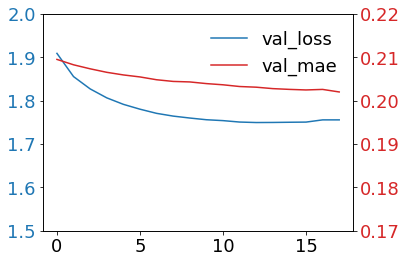

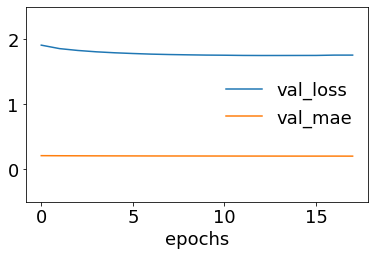

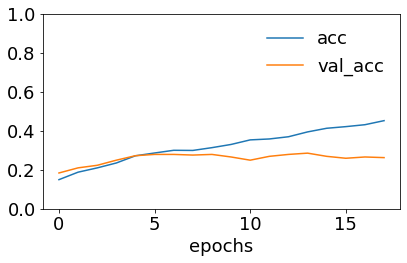

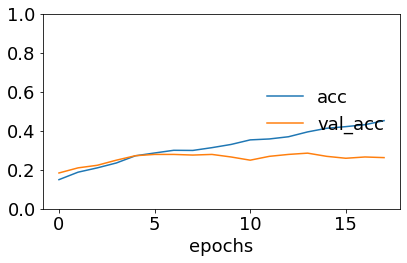

{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 12}, '1': {'precision': 0.26878612716763006, 'recall': 0.75, 'f1-score': 0.3957446808510638, 'support': 124}, '2': {'precision': 0.27692307692307694, 'recall': 0.1956521739130435, 'f1-score': 0.22929936305732487, 'support': 92}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 71}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 76}, '5': {'precision': 0.28125, 'recall': 0.25471698113207547, 'f1-score': 0.2673267326732673, 'support': 106}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 25}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.27218934911242604, 'macro avg': {'precision': 0.10336990051133838, 'recall': 0.15004614438063987, 'f1-score': 0.111546347072707, 'support': 507}, 'weighted avg': {'precision': 0.17479073539587617, 'recall': 0.27218934911242604, 'f1-score': 0.19428898518771623, 'support': 507}}


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_lstm_cnn_tf_6, r] = lstm_cnn_tf(texts_tf6, data_6, embedding_matrix_6, num6)  # 150% data augmentation

##### 1.8 augmentation

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Building Bi-LSTM model...
9.0
Model: "model_123"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_247 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_91 (Embedding)        (None, 432, 300)     7303800     input_247[0][0]                  
__________________________________________________________________________________________________
input_248 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_42 (Conv1D)              (None, 430, 300)     270300      embedding_91[0][0]               
____________________________________________________________

<Figure size 432x288 with 0 Axes>

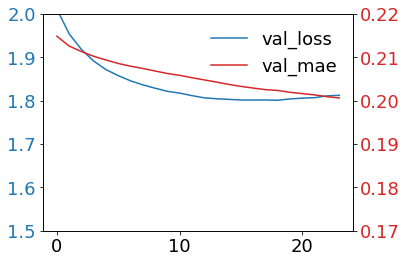

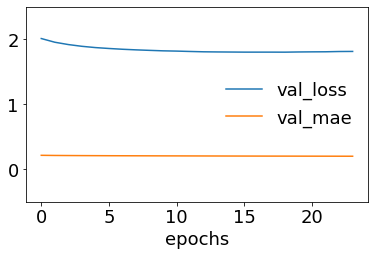

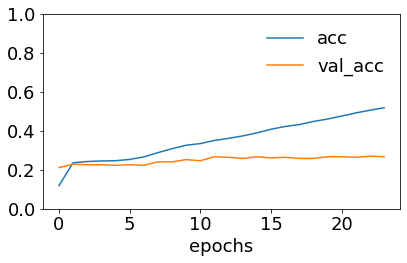

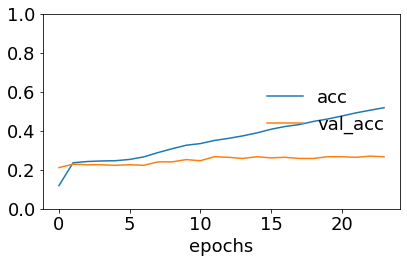

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14}, '1': {'precision': 0.29754601226993865, 'recall': 0.708029197080292, 'f1-score': 0.41900647948164155, 'support': 137}, '2': {'precision': 0.24, 'recall': 0.05825242718446602, 'f1-score': 0.09375000000000001, 'support': 103}, '3': {'precision': 0.16666666666666666, 'recall': 0.06097560975609756, 'f1-score': 0.08928571428571429, 'support': 82}, '4': {'precision': 0.1111111111111111, 'recall': 0.023529411764705882, 'f1-score': 0.038834951456310676, 'support': 85}, '5': {'precision': 0.31952662721893493, 'recall': 0.4576271186440678, 'f1-score': 0.3763066202090593, 'support': 118}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 29}, 'accuracy': 0.2887323943661972, 'macro avg': {'precision': 0.1621214881809502, 'recall': 0.1869162520613756, 'f1-score': 0.1453119664903894, 'support': 568}, 'weighted avg': {'precision': 0.22235749437311098, 'recall': 0.2887323943661972, 'f1-score': 0.21494140549096633

<Figure size 432x288 with 0 Axes>

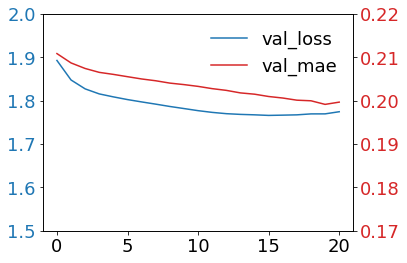

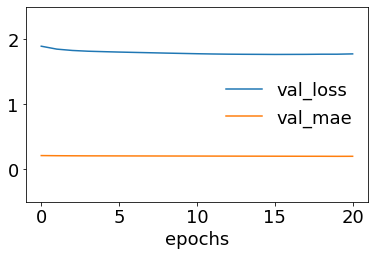

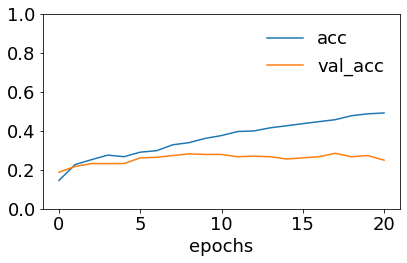

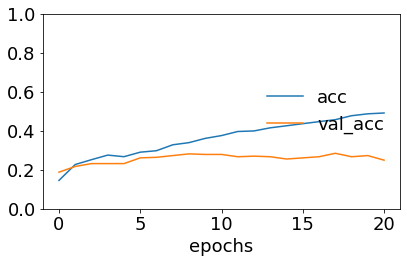

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14}, '1': {'precision': 0.2791666666666667, 'recall': 0.48905109489051096, 'f1-score': 0.35543766578249336, 'support': 137}, '2': {'precision': 0.23478260869565218, 'recall': 0.2621359223300971, 'f1-score': 0.24770642201834864, 'support': 103}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 82}, '4': {'precision': 0.2222222222222222, 'recall': 0.07058823529411765, 'f1-score': 0.10714285714285715, 'support': 85}, '5': {'precision': 0.2737430167597765, 'recall': 0.4152542372881356, 'f1-score': 0.32996632996632996, 'support': 118}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 28}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2623239436619718, 'macro avg': {'precision': 0.1262393142930397, 'recall': 0.15462868622535766, 'f1-score': 0.13003165936375366, 'support': 568}, 'weighted avg': {'precision': 0.20003346284423948, 'recall': 0.26232394366

<Figure size 432x288 with 0 Axes>

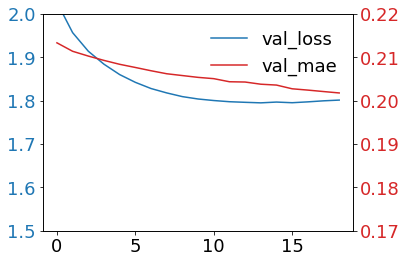

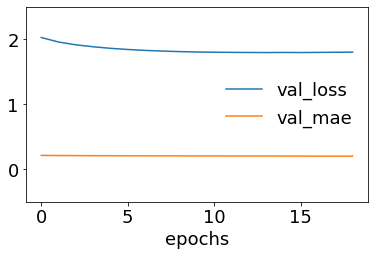

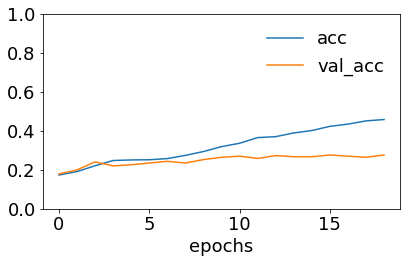

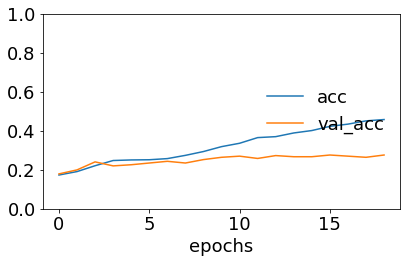

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14}, '1': {'precision': 0.29393939393939394, 'recall': 0.708029197080292, 'f1-score': 0.41541755888650966, 'support': 137}, '2': {'precision': 0.16666666666666666, 'recall': 0.02912621359223301, 'f1-score': 0.04958677685950413, 'support': 103}, '3': {'precision': 0.21311475409836064, 'recall': 0.15853658536585366, 'f1-score': 0.1818181818181818, 'support': 82}, '4': {'precision': 0.08333333333333333, 'recall': 0.011764705882352941, 'f1-score': 0.020618556701030927, 'support': 85}, '5': {'precision': 0.3197278911564626, 'recall': 0.3983050847457627, 'f1-score': 0.3547169811320755, 'support': 118}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 28}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2834507042253521, 'macro avg': {'precision': 0.13459775489927714, 'recall': 0.1632202233333118, 'f1-score': 0.12776975692466275, 'support': 568}, 'weighted avg': {'precisi

<Figure size 432x288 with 0 Axes>

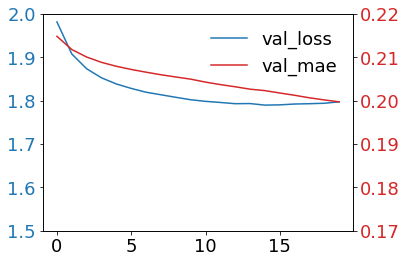

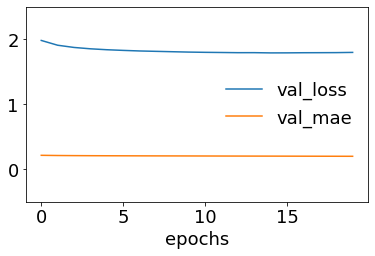

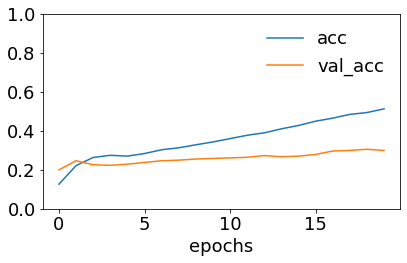

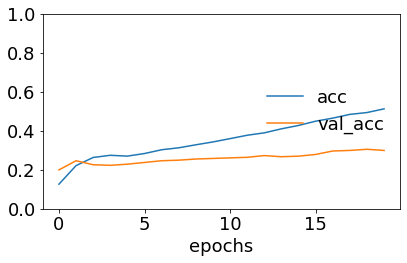

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14}, '1': {'precision': 0.3181818181818182, 'recall': 0.6131386861313869, 'f1-score': 0.4189526184538653, 'support': 137}, '2': {'precision': 0.275, 'recall': 0.10784313725490197, 'f1-score': 0.15492957746478872, 'support': 102}, '3': {'precision': 0.23076923076923078, 'recall': 0.07407407407407407, 'f1-score': 0.11214953271028039, 'support': 81}, '4': {'precision': 0.20689655172413793, 'recall': 0.06976744186046512, 'f1-score': 0.10434782608695653, 'support': 86}, '5': {'precision': 0.2966507177033493, 'recall': 0.5210084033613446, 'f1-score': 0.3780487804878049, 'support': 119}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 28}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2975352112676056, 'macro avg': {'precision': 0.165937289797317, 'recall': 0.17322896783527159, 'f1-score': 0.14605354190046196, 'support': 568}, 'weighted avg': {'precision': 0.2525136542

<Figure size 432x288 with 0 Axes>

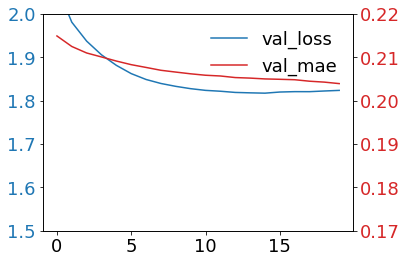

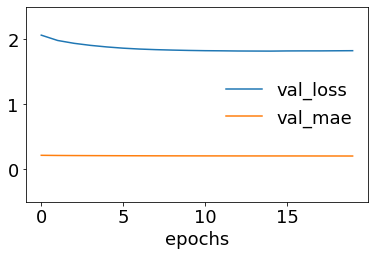

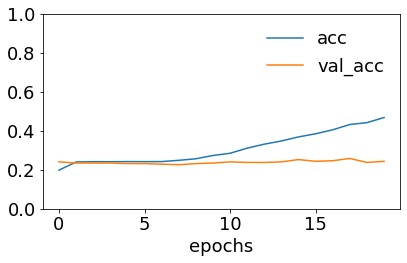

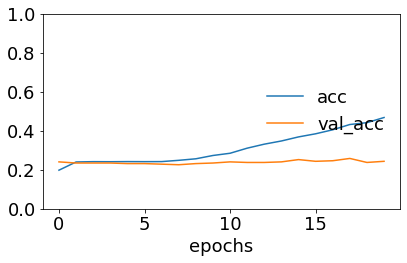

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14}, '1': {'precision': 0.2648648648648649, 'recall': 0.7153284671532847, 'f1-score': 0.38658777120315585, 'support': 137}, '2': {'precision': 0.21929824561403508, 'recall': 0.24509803921568626, 'f1-score': 0.23148148148148148, 'support': 102}, '3': {'precision': 0.3333333333333333, 'recall': 0.012345679012345678, 'f1-score': 0.023809523809523808, 'support': 81}, '4': {'precision': 0.125, 'recall': 0.023529411764705882, 'f1-score': 0.039603960396039604, 'support': 85}, '5': {'precision': 0.24615384615384617, 'recall': 0.13445378151260504, 'f1-score': 0.1739130434782609, 'support': 119}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 29}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.25, 'macro avg': {'precision': 0.14858128624575992, 'recall': 0.14134442233232844, 'f1-score': 0.1069244725460577, 'support': 568}, 'weighted avg': {'precision': 0.22107784371729888

<Figure size 432x288 with 0 Axes>

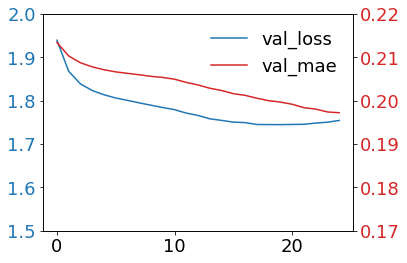

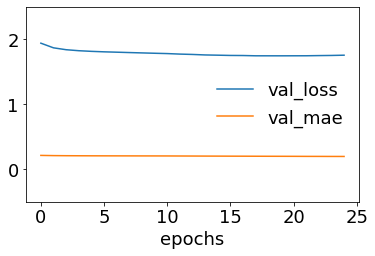

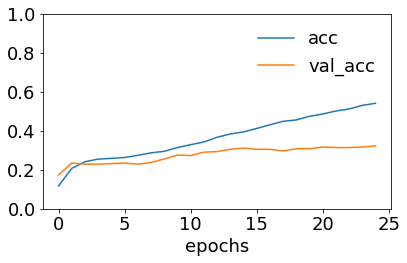

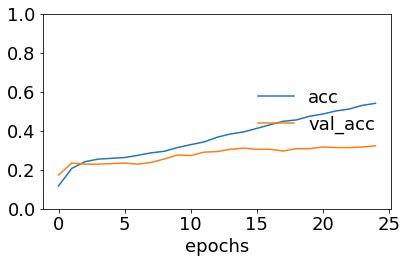

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14}, '1': {'precision': 0.2863070539419087, 'recall': 0.5036496350364964, 'f1-score': 0.36507936507936506, 'support': 137}, '2': {'precision': 0.05714285714285714, 'recall': 0.0196078431372549, 'f1-score': 0.0291970802919708, 'support': 102}, '3': {'precision': 0.16091954022988506, 'recall': 0.1728395061728395, 'f1-score': 0.16666666666666666, 'support': 81}, '4': {'precision': 0.2647058823529412, 'recall': 0.10588235294117647, 'f1-score': 0.15126050420168066, 'support': 85}, '5': {'precision': 0.3216374269005848, 'recall': 0.46218487394957986, 'f1-score': 0.3793103448275862, 'support': 119}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 29}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2623239436619718, 'macro avg': {'precision': 0.1363390950710221, 'recall': 0.15802052640466838, 'f1-score': 0.13643924513340866, 'support': 568}, 'weighted avg': {'precision':

<Figure size 432x288 with 0 Axes>

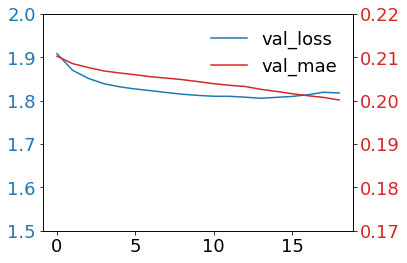

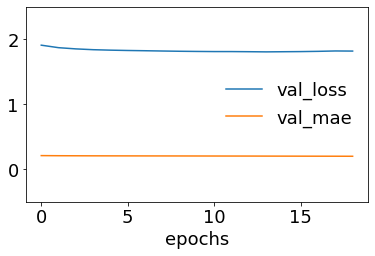

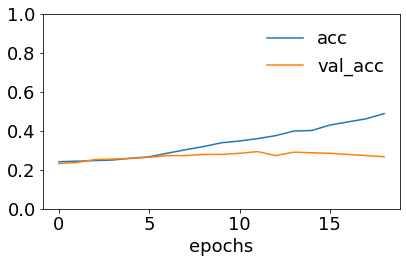

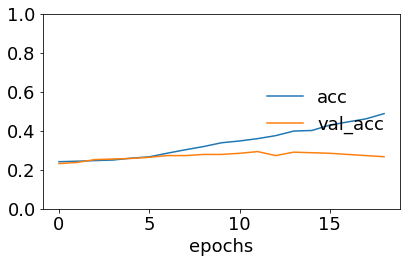

{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14}, '1': {'precision': 0.2653061224489796, 'recall': 0.5693430656934306, 'f1-score': 0.3619489559164733, 'support': 137}, '2': {'precision': 0.16, 'recall': 0.07766990291262135, 'f1-score': 0.1045751633986928, 'support': 103}, '3': {'precision': 0.4444444444444444, 'recall': 0.04938271604938271, 'f1-score': 0.08888888888888889, 'support': 81}, '4': {'precision': 0.2857142857142857, 'recall': 0.023529411764705882, 'f1-score': 0.043478260869565216, 'support': 85}, '5': {'precision': 0.2980769230769231, 'recall': 0.5254237288135594, 'f1-score': 0.3803680981595092, 'support': 118}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 29}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2711267605633803, 'macro avg': {'precision': 0.1816927219605791, 'recall': 0.1556686031542125, 'f1-score': 0.12240742090414117, 'support': 568}, 'weighted avg': {'precision': 0.261066426028

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_lstm_cnn_tf_7, r] = lstm_cnn_tf(texts_tf7, data_7, embedding_matrix_7, num7)  # 180% data augmentation

In [0]:
scores_lstm_cnn_tf_7

,accuracy,precision,recall,f1,cohen_kappa_score,auc
0,0.288732,0.222357,0.288732,0.214941,0.087423,0.584886
1,0.262324,0.200033,0.262324,0.215232,0.062684,0.582911
2,0.283451,0.210780,0.283451,0.212215,0.083333,0.580967
3,0.297535,0.252514,0.297535,0.239868,0.103885,0.586577
4,0.250000,0.221078,0.250000,0.180571,0.035861,0.567974
5,0.262324,0.209264,0.262324,0.219171,0.069439,0.604999
6,0.271127,0.261066,0.271127,0.204467,0.064362,0.588562


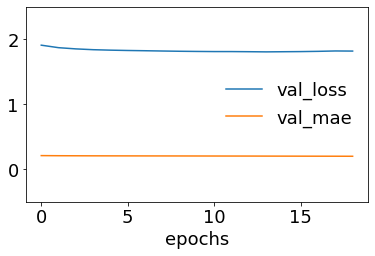

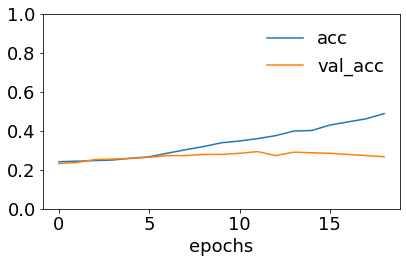

In [0]:
  # plot loss
figure(figsize=(6, 4))
plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
plt.plot(r.history['val_loss'], label='val_loss')
plt.plot(r.history['val_mae'], label='val_mae')
plt.xlabel('epochs') 
plt.ylim(-0.5, 2.5)       
plt.legend(frameon=False, loc = 'center right')
plt.show()

# plot accuracy
figure(figsize=(6, 4))
plt.rcParams.update({'figure.autolayout': True, 'font.size':18})  
plt.plot(r.history['accuracy'], label='acc')
plt.plot(r.history['val_accuracy'], label='val_acc')
plt.xlabel('epochs') 
plt.ylim(0, 1)       
plt.legend(frameon=False, loc = 'upper right')
plt.show()

Building Bi-LSTM model...
0.0


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 6 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


Model: "model_130"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_261 (InputLayer)          [(None, 432)]        0                                            
__________________________________________________________________________________________________
embedding_92 (Embedding)        (None, 432, 300)     6690900     input_261[0][0]                  
__________________________________________________________________________________________________
input_262 (InputLayer)          [(None, 500)]        0                                            
__________________________________________________________________________________________________
conv1d_49 (Conv1D)              (None, 430, 300)     270300      embedding_92[0][0]               
__________________________________________________________________________________________

<Figure size 432x288 with 0 Axes>

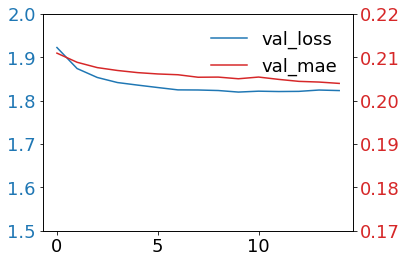

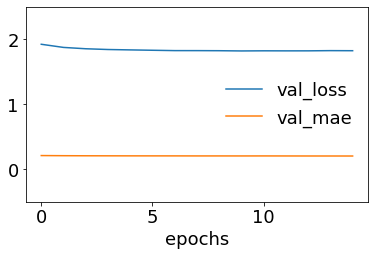

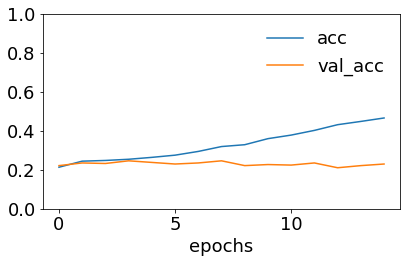

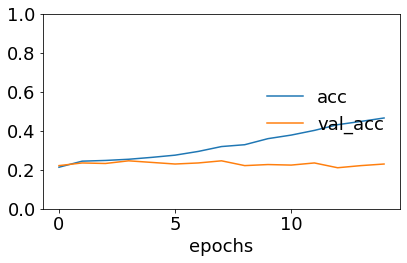

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '1': {'precision': 0.2510822510822511, 'recall': 0.7891156462585034, 'f1-score': 0.38095238095238093, 'support': 147}, '2': {'precision': 0.24193548387096775, 'recall': 0.13761467889908258, 'f1-score': 0.17543859649122806, 'support': 109}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 88}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 92}, '5': {'precision': 0.1875, 'recall': 0.11811023622047244, 'f1-score': 0.14492753623188404, 'support': 127}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 30}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.23973727422003285, 'macro avg': {'precision': 0.08506471686915235, 'recall': 0.1306050701722573, 'f1-score': 0.08766481420943663, 'support': 609}, 'weighted avg': {'precision': 0.14300912750579048, 'recall': 0.23973727422003285, 'f1-score': 0.15357734666501338, 'support': 609}}

<Figure size 432x288 with 0 Axes>

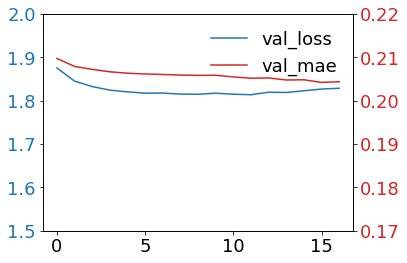

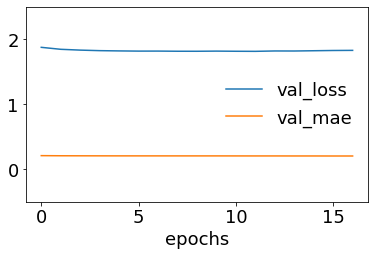

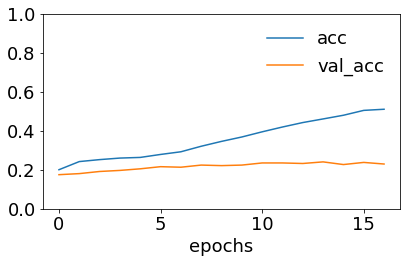

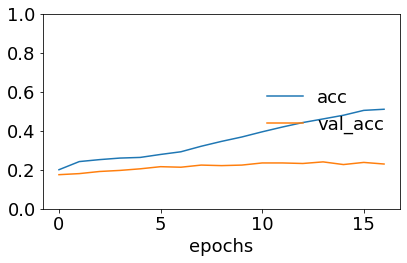

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '1': {'precision': 0.28116710875331563, 'recall': 0.7210884353741497, 'f1-score': 0.40458015267175573, 'support': 147}, '2': {'precision': 0.20833333333333334, 'recall': 0.045871559633027525, 'f1-score': 0.07518796992481204, 'support': 109}, '3': {'precision': 0.10810810810810811, 'recall': 0.045454545454545456, 'f1-score': 0.064, 'support': 88}, '4': {'precision': 0.19047619047619047, 'recall': 0.043478260869565216, 'f1-score': 0.07079646017699115, 'support': 92}, '5': {'precision': 0.2733333333333333, 'recall': 0.3228346456692913, 'f1-score': 0.296028880866426, 'support': 127}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 30}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2627257799671593, 'macro avg': {'precision': 0.1326772592505351, 'recall': 0.14734093087507238, 'f1-score': 0.11382418295499812, 'support': 609}, 'weighted avg': {'precision': 0.20655

<Figure size 432x288 with 0 Axes>

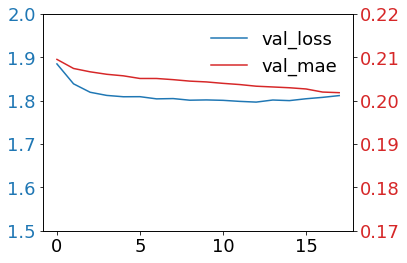

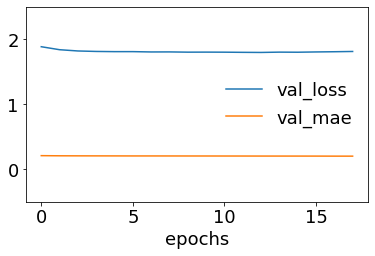

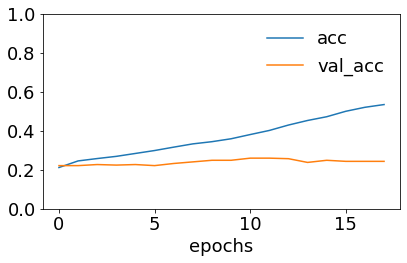

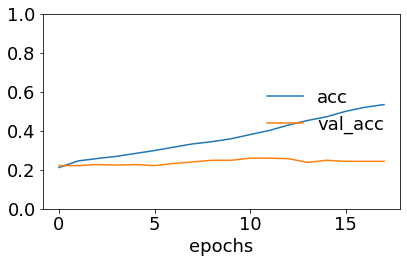

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '1': {'precision': 0.2974683544303797, 'recall': 0.6394557823129252, 'f1-score': 0.40604751619870405, 'support': 147}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 109}, '3': {'precision': 0.21621621621621623, 'recall': 0.09090909090909091, 'f1-score': 0.128, 'support': 88}, '4': {'precision': 0.2903225806451613, 'recall': 0.09782608695652174, 'f1-score': 0.14634146341463417, 'support': 92}, '5': {'precision': 0.2669683257918552, 'recall': 0.4645669291338583, 'f1-score': 0.3390804597701149, 'support': 127}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 30}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2791461412151067, 'macro avg': {'precision': 0.13387193463545155, 'recall': 0.1615947361640495, 'f1-score': 0.12743367992293164, 'support': 609}, 'weighted avg': {'precision': 0.20257722483286256, 'recall': 0.2791461412151067, 'f1-scor

<Figure size 432x288 with 0 Axes>

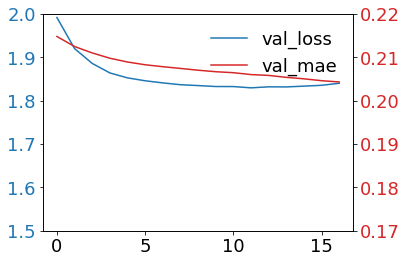

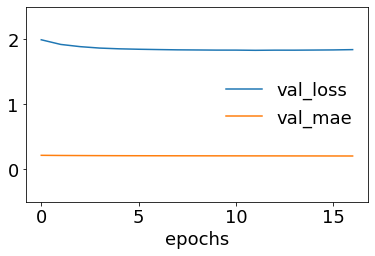

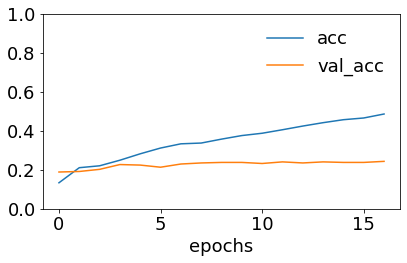

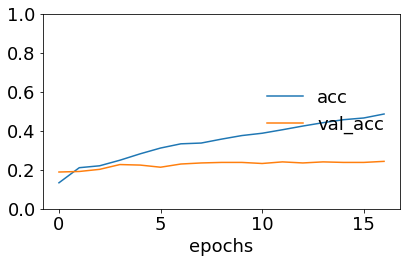

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '1': {'precision': 0.2490118577075099, 'recall': 0.42857142857142855, 'f1-score': 0.315, 'support': 147}, '2': {'precision': 0.19658119658119658, 'recall': 0.21100917431192662, 'f1-score': 0.20353982300884954, 'support': 109}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 88}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 92}, '5': {'precision': 0.25738396624472576, 'recall': 0.48412698412698413, 'f1-score': 0.33608815426997246, 'support': 126}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 31}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2413793103448276, 'macro avg': {'precision': 0.08787212756667903, 'recall': 0.1404634483762924, 'f1-score': 0.10682849715985276, 'support': 609}, 'weighted avg': {'precision': 0.1485426490265843, 'recall': 0.2413793103448276, 'f1-score': 0.1819999148538278, 'support': 609}}
9.0

<Figure size 432x288 with 0 Axes>

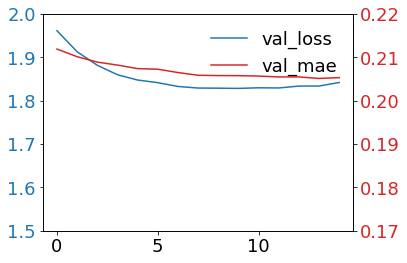

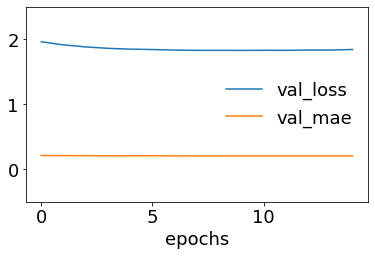

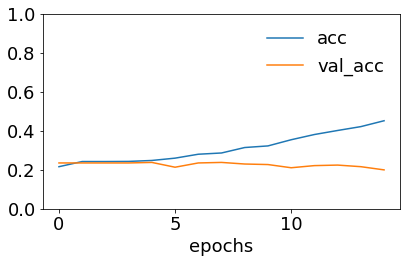

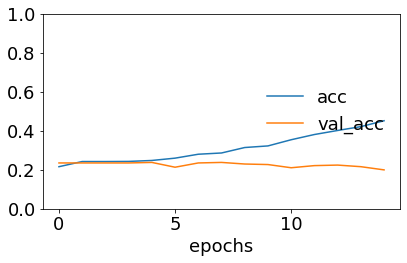

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '1': {'precision': 0.2554890219560878, 'recall': 0.8707482993197279, 'f1-score': 0.3950617283950617, 'support': 147}, '2': {'precision': 0.16326530612244897, 'recall': 0.07339449541284404, 'f1-score': 0.10126582278481013, 'support': 109}, '3': {'precision': 0.2857142857142857, 'recall': 0.045454545454545456, 'f1-score': 0.0784313725490196, 'support': 88}, '4': {'precision': 0.28, 'recall': 0.07608695652173914, 'f1-score': 0.11965811965811966, 'support': 92}, '5': {'precision': 0.10526315789473684, 'recall': 0.015873015873015872, 'f1-score': 0.027586206896551724, 'support': 126}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 31}, 'accuracy': 0.2450657894736842, 'macro avg': {'precision': 0.15567596738393702, 'recall': 0.15450818751169604, 'f1-score': 0.10314332146908042, 'support': 608}, 'weighted avg': {'precision': 0.19657700597448327, 'recall': 0.2450657894736842, 'f1-score': 0.1488460832556

<Figure size 432x288 with 0 Axes>

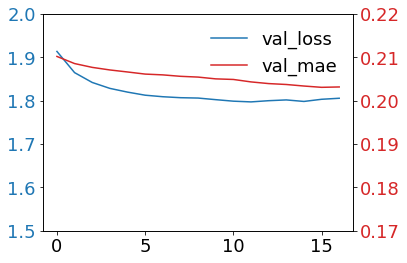

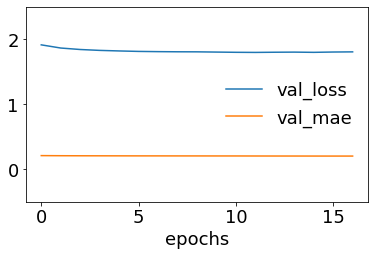

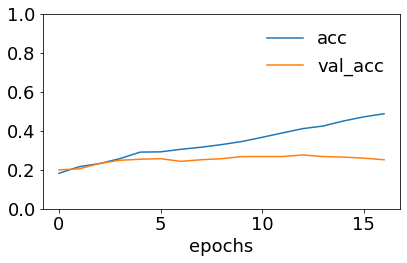

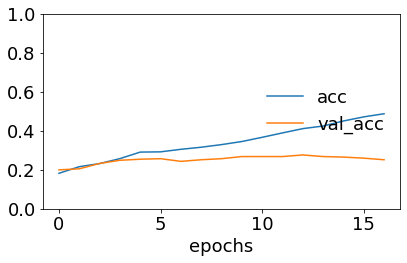

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '1': {'precision': 0.27522935779816515, 'recall': 0.6122448979591837, 'f1-score': 0.379746835443038, 'support': 147}, '2': {'precision': 0.15384615384615385, 'recall': 0.01818181818181818, 'f1-score': 0.03252032520325203, 'support': 110}, '3': {'precision': 0.14814814814814814, 'recall': 0.04597701149425287, 'f1-score': 0.07017543859649122, 'support': 87}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 91}, '5': {'precision': 0.24166666666666667, 'recall': 0.4603174603174603, 'f1-score': 0.31693989071038253, 'support': 126}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 31}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.2532894736842105, 'macro avg': {'precision': 0.10236129080739173, 'recall': 0.14209014849408938, 'f1-score': 0.09992281124414548, 'support': 608}, 'weighted avg': {'precision': 0.16565901547417122, 'recall': 0.253289473

<Figure size 432x288 with 0 Axes>

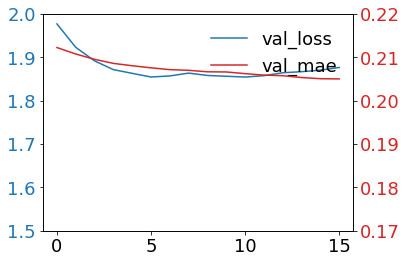

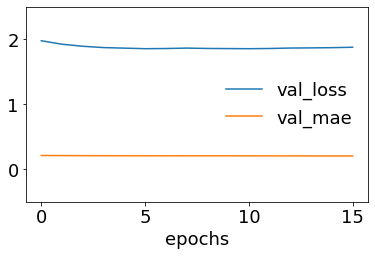

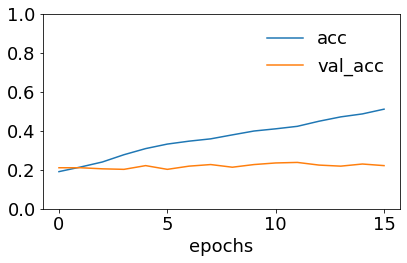

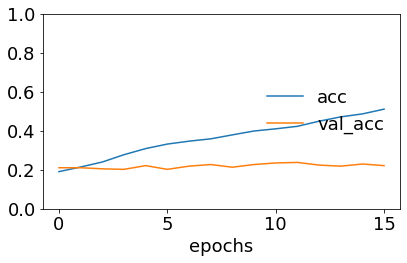

{'0': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15}, '1': {'precision': 0.27596439169139464, 'recall': 0.6326530612244898, 'f1-score': 0.384297520661157, 'support': 147}, '2': {'precision': 0.2235294117647059, 'recall': 0.17272727272727273, 'f1-score': 0.1948717948717949, 'support': 110}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 88}, '4': {'precision': 0.12, 'recall': 0.03296703296703297, 'f1-score': 0.05172413793103449, 'support': 91}, '5': {'precision': 0.20496894409937888, 'recall': 0.2619047619047619, 'f1-score': 0.22996515679442509, 'support': 126}, '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 30}, '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1}, 'accuracy': 0.24342105263157895, 'macro avg': {'precision': 0.10305784344443492, 'recall': 0.13753151610294467, 'f1-score': 0.10760732628230144, 'support': 608}, 'weighted avg': {'precision': 0.16760047340341186, 'recall': 0.24342105263157895, 'f1-sc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
[scores_lstm_cnn_tf_8, r] = lstm_cnn_tf(texts_tf8, data_8, embedding_matrix_8, num8)  # 200% data augmentation

In [0]:
print('20% augmentation')
print(scores_lstm_cnn_tf_1.mean())
print('\n50% augmentation')
print(scores_lstm_cnn_tf_2.mean())
print('\n80% augmentation')
print(scores_lstm_cnn_tf_3.mean())
print('\n100% augmentation')
print(scores_lstm_cnn_tf_4.mean())
print('\n120% augmentation')
print(scores_lstm_cnn_tf_5.mean())
print('\n150% augmentation')
print(scores_lstm_cnn_tf_6.mean())
print('\n180% augmentation')
print(scores_lstm_cnn_tf_7.mean())
print('\n200% augmentation')
print(scores_lstm_cnn_tf_8.mean())

20% augmentation
accuracy             0.267622
precision            0.227462
recall               0.267622
f1                   0.210498
cohen_kappa_score    0.062628
auc                  0.574952
dtype: float64

50% augmentation
accuracy             0.273240
precision            0.216454
recall               0.273240
f1                   0.207331
cohen_kappa_score    0.065749
auc                  0.561160
dtype: float64

80% augmentation
accuracy             0.260950
precision            0.189018
recall               0.260950
f1                   0.194255
cohen_kappa_score    0.053081
auc                  0.567033
dtype: float64

100% augmentation
accuracy             0.265498
precision            0.211656
recall               0.265498
f1                   0.193918
cohen_kappa_score    0.056955
auc                  0.560538
dtype: float64

120% augmentation
accuracy             0.258955
precision            0.222300
recall               0.258955
f1                   0.184659
cohen_kap